# Afriat

In [1]:
import warnings
import os
import sys
import gc
import warnings

In [2]:
import anndata as ad
import scanpy as sc
import copy
import torch
from pathlib import Path
import networkx as nx
from sklearn.neighbors import kneighbors_graph
import numpy as np
import scanpy as sc
import pandas as pd
import numpy as np
import scipy.stats

sys.path.append("/home/icb/kemal.inecik/work/codes/tardis")
import tardis
tardis.config = tardis.config_server

In [3]:
print(f"CUDA used: {torch.cuda.is_available()}")

CUDA used: False


In [4]:
%matplotlib inline
%config InlineBackend.figure_format='retina'
import matplotlib.pyplot as plt
import seaborn as sns

import pickle
_rcparams_path = "/home/icb/kemal.inecik/work/codes/tardis/training/local/figures/rcparams.pickle"
with open(_rcparams_path, 'rb') as file:
    _rcparams = pickle.load(file)
plt.rcParams.update(_rcparams)

In [5]:
adata_file_path = os.path.join(tardis.config.io_directories["processed"], "cpa_GSM_new.h5ad")
assert os.path.isfile(adata_file_path), f"File not already exist: `{adata_file_path}`"
adata = ad.read_h5ad(adata_file_path)

adata.X = adata.layers["counts"].copy()
del adata.layers
adata.obs.loc[adata.obs["dose"] == "0.0", "dose_val"] = 0.0
d = {i: ind for ind, i in enumerate(sorted(adata.obs["dose"].astype(float).unique()))}
adata.obs["dose_training"] = [d[float(i)] for i in adata.obs["dose"]]
gc.collect()

12

In [6]:
model_level_metrics = [
    dict(
        metric_identifier = "metric_mi|dose_training",
        training_set = ["train", "validation"],
        every_n_epoch = 5,
        subsample = 1.0,
        progress_bar = True,
        metric_kwargs = dict(
            variation = "normalized",
            discretization_bins = 256,
            latent_subset=None,
            reduce=np.mean
        )
    ),
    dict(
        metric_identifier = "metric_mi|condition",
        training_set = ["train", "validation"],
        every_n_epoch = 5,
        subsample = 1.0,
        progress_bar = True,
        metric_kwargs = dict(
            variation = "normalized",
            discretization_bins = 256,
            latent_subset=None,
            reduce=np.mean
        )
    )
]

In [7]:
warmup_epoch_range = [6, 48]
dtc_w1 = 100
dtc_w2 = 10

counteractive_minibatch_settings = dict(
    method = "categorical_random",
    method_kwargs = dict(
        within_labels = False,
        within_batch = False,
        within_categorical_covs = None,
        seed = "forward",
    )
)

disentenglement_targets_configurations=[
    dict(
        obs_key = "dose_training",
        n_reserved_latent = 8,
        counteractive_minibatch_settings = counteractive_minibatch_settings,
        auxillary_losses = [
            dict(
                apply = True, 
                target_type="pseudo_categorical",
                non_categorical_coefficient_method="squared_difference",
                progress_bar = False,
                weight = dtc_w1,
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "negative",
                transformation = "inverse", 
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w2, 
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "positive",
                transformation = "none",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w2 * 1,
                method = "mse_z", 
                latent_group = "unreserved_complete",
                counteractive_example = "negative",
                transformation = "none", 
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w1 * 1, 
                method = "mse_z", 
                latent_group = "unreserved_complete",
                counteractive_example = "positive",
                transformation = "inverse",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
        ]
    ),
    dict(
        obs_key = "condition",
        n_reserved_latent = 8,
        counteractive_minibatch_settings = counteractive_minibatch_settings,
        auxillary_losses = [
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w1,
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "negative",
                transformation = "inverse", 
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w2, 
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "positive",
                transformation = "none",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w2 * 1,
                method = "mse_z", 
                latent_group = "unreserved_complete",
                counteractive_example = "negative",
                transformation = "none", 
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w1 * 1, 
                method = "mse_z", 
                latent_group = "unreserved_complete",
                counteractive_example = "positive",
                transformation = "inverse",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
        ]
    )
]

In [8]:
n_epochs_kl_warmup = 600

model_params = dict(
    n_hidden=512,
    n_layers=3, 
    n_latent=(24 + 8 * len(disentenglement_targets_configurations)),
    gene_likelihood = "nb",
    use_batch_norm = "none",
    use_layer_norm = "both",
    dropout_rate = 0.5,
    deeply_inject_disentengled_latents = True,
    include_auxillary_loss = True,
    beta_kl_weight = 0.5,
    encode_covariates=True
)

train_params = dict(
    max_epochs=600,
    train_size=0.8,
    batch_size=64,
    check_val_every_n_epoch=10,
    limit_train_batches=1.0, 
    limit_val_batches=1.0,
    learning_rate_monitor=True,
    # early stopping:
    early_stopping=False,
    early_stopping_patience=150,
    early_stopping_monitor="elbo_train",
    plan_kwargs = dict(
        n_epochs_kl_warmup=n_epochs_kl_warmup,
        lr=5e-5,
        weight_decay=1e-2,
        optimizer="AdamW",
        # lr-scheduler:
        reduce_lr_on_plateau=True,
        lr_patience=100,
        lr_scheduler_metric="elbo_train",
    )
)

dataset_params = dict(
    layer=None, 
    labels_key=None,
    batch_key=None,
    categorical_covariate_keys=None,
    disentenglement_targets_configurations=disentenglement_targets_configurations,
    model_level_metrics=model_level_metrics,
    model_level_metrics_helper_covariates=['condition', 'dose_training']
)

tardis.MyModel.setup_anndata(adata, **dataset_params)
dataset_params["adata_path"] = adata_file_path
dataset_params["adata"] = os.path.split(adata_file_path)[1]

tardis.MyModel.setup_wandb(
    wandb_configurations=tardis.config.wandb,
    hyperparams=dict(
        model_params=model_params,
        train_params=train_params,
        dataset_params=dataset_params,
    )
)

vae = tardis.MyModel(
    adata,
    **model_params
)
vae.train(**train_params)

dir_path = os.path.join(
    tardis.config.io_directories["models"],
    "cpa_sciplex_v2"
)

vae.save(
    dir_path,
    overwrite=True,
)

W&B logger initialized with the following parameters: 
Entity: inecik-academic
Project: tardis_conference
ID: 12e9qynu
Name: holographic-carrier-91
Tags: tardis, conference, figures, final
Notes: Final runs for Tardis before conference.
URL: https://wandb.ai/inecik-academic/tardis_conference/runs/12e9qynu
Directory: /lustre/groups/ml01/workspace/kemal.inecik/wandb/run-20240504_153253-12e9qynu/files



/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/lightning/fabric/plugins/environments/slurm.py:168: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_ ...
GPU available: False, used: False


TPU available: False, using: 0 TPU cores


IPU available: False, using: 0 IPUs


HPU available: False, using: 0 HPUs


`Trainer(limit_train_batches=1.0)` was configured so 100% of the batches per epoch will be used..


`Trainer(limit_val_batches=1.0)` was configured so 100% of the batches will be used..


/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/lightning/fabric/plugins/environments/slurm.py:168: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_ ...
/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:28: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn("The verbose parameter is deprecated. Please use get_last_lr() "


Training:   0%|          | 0/600 [00:00<?, ?it/s]

Epoch 1/600:   0%|          | 0/600 [00:00<?, ?it/s]

/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `dose_training` for `training` set. Number of elements in each group: 1724,1582,1428,1731,1433,1558,1398,995
  possible_indices = CachedPossibleGroupDefinitionIndices.get(


/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `condition` for `training` set. Number of elements in each group: 1558,3555,2190,2822,1724
  possible_indices = CachedPossibleGroupDefinitionIndices.get(


/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `dose_training` for `validation` set. Number of elements in each group: 431,379,364,440,357,382,369,240
  possible_indices = CachedPossibleGroupDefinitionIndices.get(
/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `condition` for `validation` set. Number of elements in each group: 381,913,570,667,431
  possible_indices = CachedPossibleGroupDefinitionIndices.get(


Epoch 1/600:   0%|          | 1/600 [00:16<2:45:54, 16.62s/it]

Epoch 1/600:   0%|          | 1/600 [00:16<2:45:54, 16.62s/it, v_num=nu_1, total_loss_train=2.65e+3, kl_local_train=31.8]

Epoch 2/600:   0%|          | 1/600 [00:16<2:45:54, 16.62s/it, v_num=nu_1, total_loss_train=2.65e+3, kl_local_train=31.8]

Epoch 2/600:   0%|          | 2/600 [00:31<2:37:17, 15.78s/it, v_num=nu_1, total_loss_train=2.65e+3, kl_local_train=31.8]

Epoch 2/600:   0%|          | 2/600 [00:31<2:37:17, 15.78s/it, v_num=nu_1, total_loss_train=2.23e+3, kl_local_train=55.7]

Epoch 3/600:   0%|          | 2/600 [00:31<2:37:17, 15.78s/it, v_num=nu_1, total_loss_train=2.23e+3, kl_local_train=55.7]

Epoch 3/600:   0%|          | 3/600 [00:46<2:32:32, 15.33s/it, v_num=nu_1, total_loss_train=2.23e+3, kl_local_train=55.7]

Epoch 3/600:   0%|          | 3/600 [00:46<2:32:32, 15.33s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=60.2]

Epoch 4/600:   0%|          | 3/600 [00:46<2:32:32, 15.33s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=60.2]

Epoch 4/600:   1%|          | 4/600 [01:01<2:30:18, 15.13s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=60.2]

Epoch 4/600:   1%|          | 4/600 [01:01<2:30:18, 15.13s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=60.9] 

Epoch 5/600:   1%|          | 4/600 [01:01<2:30:18, 15.13s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=60.9]

Epoch 5/600:   1%|          | 5/600 [01:16<2:30:47, 15.21s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=60.9]

Epoch 5/600:   1%|          | 5/600 [01:16<2:30:47, 15.21s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=59]  

Epoch 6/600:   1%|          | 5/600 [01:17<2:30:47, 15.21s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=59]

Epoch 6/600:   1%|          | 6/600 [01:31<2:27:34, 14.91s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=59]

Epoch 6/600:   1%|          | 6/600 [01:31<2:27:34, 14.91s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=53.4, metric_mi|dose_training_train=0.0382, metric_mi|condition_train=0.0291]

Epoch 7/600:   1%|          | 6/600 [01:31<2:27:34, 14.91s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=53.4, metric_mi|dose_training_train=0.0382, metric_mi|condition_train=0.0291]

Epoch 7/600:   1%|          | 7/600 [01:44<2:23:21, 14.51s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=53.4, metric_mi|dose_training_train=0.0382, metric_mi|condition_train=0.0291]

Epoch 7/600:   1%|          | 7/600 [01:44<2:23:21, 14.51s/it, v_num=nu_1, total_loss_train=2.19e+3, kl_local_train=40.6, metric_mi|dose_training_train=0.0382, metric_mi|condition_train=0.0291]

Epoch 8/600:   1%|          | 7/600 [01:44<2:23:21, 14.51s/it, v_num=nu_1, total_loss_train=2.19e+3, kl_local_train=40.6, metric_mi|dose_training_train=0.0382, metric_mi|condition_train=0.0291]

Epoch 8/600:   1%|▏         | 8/600 [01:58<2:20:50, 14.27s/it, v_num=nu_1, total_loss_train=2.19e+3, kl_local_train=40.6, metric_mi|dose_training_train=0.0382, metric_mi|condition_train=0.0291]

Epoch 8/600:   1%|▏         | 8/600 [01:58<2:20:50, 14.27s/it, v_num=nu_1, total_loss_train=2.17e+3, kl_local_train=52.4, metric_mi|dose_training_train=0.0382, metric_mi|condition_train=0.0291]

Epoch 9/600:   1%|▏         | 8/600 [01:58<2:20:50, 14.27s/it, v_num=nu_1, total_loss_train=2.17e+3, kl_local_train=52.4, metric_mi|dose_training_train=0.0382, metric_mi|condition_train=0.0291]

Epoch 9/600:   2%|▏         | 9/600 [02:12<2:18:16, 14.04s/it, v_num=nu_1, total_loss_train=2.17e+3, kl_local_train=52.4, metric_mi|dose_training_train=0.0382, metric_mi|condition_train=0.0291]

Epoch 9/600:   2%|▏         | 9/600 [02:12<2:18:16, 14.04s/it, v_num=nu_1, total_loss_train=2.17e+3, kl_local_train=54.3, metric_mi|dose_training_train=0.0382, metric_mi|condition_train=0.0291]

Epoch 10/600:   2%|▏         | 9/600 [02:12<2:18:16, 14.04s/it, v_num=nu_1, total_loss_train=2.17e+3, kl_local_train=54.3, metric_mi|dose_training_train=0.0382, metric_mi|condition_train=0.0291]

Epoch 10/600:   2%|▏         | 10/600 [02:26<2:17:59, 14.03s/it, v_num=nu_1, total_loss_train=2.17e+3, kl_local_train=54.3, metric_mi|dose_training_train=0.0382, metric_mi|condition_train=0.0291]

Epoch 10/600:   2%|▏         | 10/600 [02:26<2:17:59, 14.03s/it, v_num=nu_1, total_loss_train=2.17e+3, kl_local_train=53.9, metric_mi|dose_training_train=0.0382, metric_mi|condition_train=0.0291]

Epoch 11/600:   2%|▏         | 10/600 [02:26<2:17:59, 14.03s/it, v_num=nu_1, total_loss_train=2.17e+3, kl_local_train=53.9, metric_mi|dose_training_train=0.0382, metric_mi|condition_train=0.0291]

Epoch 11/600:   2%|▏         | 11/600 [02:40<2:19:19, 14.19s/it, v_num=nu_1, total_loss_train=2.17e+3, kl_local_train=53.9, metric_mi|dose_training_train=0.0382, metric_mi|condition_train=0.0291]

Epoch 11/600:   2%|▏         | 11/600 [02:40<2:19:19, 14.19s/it, v_num=nu_1, total_loss_train=2.18e+3, kl_local_train=57, metric_mi|dose_training_train=0.0505, metric_mi|condition_train=0.117]   

Epoch 12/600:   2%|▏         | 11/600 [02:40<2:19:19, 14.19s/it, v_num=nu_1, total_loss_train=2.18e+3, kl_local_train=57, metric_mi|dose_training_train=0.0505, metric_mi|condition_train=0.117]

Epoch 12/600:   2%|▏         | 12/600 [02:54<2:17:43, 14.05s/it, v_num=nu_1, total_loss_train=2.18e+3, kl_local_train=57, metric_mi|dose_training_train=0.0505, metric_mi|condition_train=0.117]

Epoch 12/600:   2%|▏         | 12/600 [02:54<2:17:43, 14.05s/it, v_num=nu_1, total_loss_train=2.18e+3, kl_local_train=58.4, metric_mi|dose_training_train=0.0505, metric_mi|condition_train=0.117]

Epoch 13/600:   2%|▏         | 12/600 [02:54<2:17:43, 14.05s/it, v_num=nu_1, total_loss_train=2.18e+3, kl_local_train=58.4, metric_mi|dose_training_train=0.0505, metric_mi|condition_train=0.117]

Epoch 13/600:   2%|▏         | 13/600 [03:08<2:16:26, 13.95s/it, v_num=nu_1, total_loss_train=2.18e+3, kl_local_train=58.4, metric_mi|dose_training_train=0.0505, metric_mi|condition_train=0.117]

Epoch 13/600:   2%|▏         | 13/600 [03:08<2:16:26, 13.95s/it, v_num=nu_1, total_loss_train=2.19e+3, kl_local_train=60.3, metric_mi|dose_training_train=0.0505, metric_mi|condition_train=0.117]

Epoch 14/600:   2%|▏         | 13/600 [03:08<2:16:26, 13.95s/it, v_num=nu_1, total_loss_train=2.19e+3, kl_local_train=60.3, metric_mi|dose_training_train=0.0505, metric_mi|condition_train=0.117]

Epoch 14/600:   2%|▏         | 14/600 [03:21<2:15:27, 13.87s/it, v_num=nu_1, total_loss_train=2.19e+3, kl_local_train=60.3, metric_mi|dose_training_train=0.0505, metric_mi|condition_train=0.117]

Epoch 14/600:   2%|▏         | 14/600 [03:21<2:15:27, 13.87s/it, v_num=nu_1, total_loss_train=2.19e+3, kl_local_train=61.9, metric_mi|dose_training_train=0.0505, metric_mi|condition_train=0.117]

Epoch 15/600:   2%|▏         | 14/600 [03:21<2:15:27, 13.87s/it, v_num=nu_1, total_loss_train=2.19e+3, kl_local_train=61.9, metric_mi|dose_training_train=0.0505, metric_mi|condition_train=0.117]

Epoch 15/600:   2%|▎         | 15/600 [03:36<2:17:25, 14.09s/it, v_num=nu_1, total_loss_train=2.19e+3, kl_local_train=61.9, metric_mi|dose_training_train=0.0505, metric_mi|condition_train=0.117]

Epoch 15/600:   2%|▎         | 15/600 [03:36<2:17:25, 14.09s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=63.6, metric_mi|dose_training_train=0.0505, metric_mi|condition_train=0.117] 

Epoch 16/600:   2%|▎         | 15/600 [03:37<2:17:25, 14.09s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=63.6, metric_mi|dose_training_train=0.0505, metric_mi|condition_train=0.117]

Epoch 16/600:   3%|▎         | 16/600 [03:51<2:18:58, 14.28s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=63.6, metric_mi|dose_training_train=0.0505, metric_mi|condition_train=0.117]

Epoch 16/600:   3%|▎         | 16/600 [03:51<2:18:58, 14.28s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=63.2, metric_mi|dose_training_train=0.0589, metric_mi|condition_train=0.134]

Epoch 17/600:   3%|▎         | 16/600 [03:51<2:18:58, 14.28s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=63.2, metric_mi|dose_training_train=0.0589, metric_mi|condition_train=0.134]

Epoch 17/600:   3%|▎         | 17/600 [04:04<2:17:12, 14.12s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=63.2, metric_mi|dose_training_train=0.0589, metric_mi|condition_train=0.134]

Epoch 17/600:   3%|▎         | 17/600 [04:04<2:17:12, 14.12s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=64.7, metric_mi|dose_training_train=0.0589, metric_mi|condition_train=0.134]

Epoch 18/600:   3%|▎         | 17/600 [04:04<2:17:12, 14.12s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=64.7, metric_mi|dose_training_train=0.0589, metric_mi|condition_train=0.134]

Epoch 18/600:   3%|▎         | 18/600 [04:18<2:15:30, 13.97s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=64.7, metric_mi|dose_training_train=0.0589, metric_mi|condition_train=0.134]

Epoch 18/600:   3%|▎         | 18/600 [04:18<2:15:30, 13.97s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=66.1, metric_mi|dose_training_train=0.0589, metric_mi|condition_train=0.134]

Epoch 19/600:   3%|▎         | 18/600 [04:18<2:15:30, 13.97s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=66.1, metric_mi|dose_training_train=0.0589, metric_mi|condition_train=0.134]

Epoch 19/600:   3%|▎         | 19/600 [04:32<2:14:58, 13.94s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=66.1, metric_mi|dose_training_train=0.0589, metric_mi|condition_train=0.134]

Epoch 19/600:   3%|▎         | 19/600 [04:32<2:14:58, 13.94s/it, v_num=nu_1, total_loss_train=2.22e+3, kl_local_train=69.7, metric_mi|dose_training_train=0.0589, metric_mi|condition_train=0.134]

Epoch 20/600:   3%|▎         | 19/600 [04:32<2:14:58, 13.94s/it, v_num=nu_1, total_loss_train=2.22e+3, kl_local_train=69.7, metric_mi|dose_training_train=0.0589, metric_mi|condition_train=0.134]

Epoch 20/600:   3%|▎         | 20/600 [04:47<2:18:15, 14.30s/it, v_num=nu_1, total_loss_train=2.22e+3, kl_local_train=69.7, metric_mi|dose_training_train=0.0589, metric_mi|condition_train=0.134]

Epoch 20/600:   3%|▎         | 20/600 [04:47<2:18:15, 14.30s/it, v_num=nu_1, total_loss_train=2.22e+3, kl_local_train=72.4, metric_mi|dose_training_train=0.0589, metric_mi|condition_train=0.134]

Epoch 21/600:   3%|▎         | 20/600 [04:48<2:18:15, 14.30s/it, v_num=nu_1, total_loss_train=2.22e+3, kl_local_train=72.4, metric_mi|dose_training_train=0.0589, metric_mi|condition_train=0.134]

Epoch 21/600:   4%|▎         | 21/600 [05:01<2:18:30, 14.35s/it, v_num=nu_1, total_loss_train=2.22e+3, kl_local_train=72.4, metric_mi|dose_training_train=0.0589, metric_mi|condition_train=0.134]

Epoch 21/600:   4%|▎         | 21/600 [05:01<2:18:30, 14.35s/it, v_num=nu_1, total_loss_train=2.22e+3, kl_local_train=76.8, metric_mi|dose_training_train=0.0791, metric_mi|condition_train=0.13] 

Epoch 22/600:   4%|▎         | 21/600 [05:01<2:18:30, 14.35s/it, v_num=nu_1, total_loss_train=2.22e+3, kl_local_train=76.8, metric_mi|dose_training_train=0.0791, metric_mi|condition_train=0.13]

Epoch 22/600:   4%|▎         | 22/600 [05:15<2:16:39, 14.19s/it, v_num=nu_1, total_loss_train=2.22e+3, kl_local_train=76.8, metric_mi|dose_training_train=0.0791, metric_mi|condition_train=0.13]

Epoch 22/600:   4%|▎         | 22/600 [05:15<2:16:39, 14.19s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=81.7, metric_mi|dose_training_train=0.0791, metric_mi|condition_train=0.13]

Epoch 23/600:   4%|▎         | 22/600 [05:15<2:16:39, 14.19s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=81.7, metric_mi|dose_training_train=0.0791, metric_mi|condition_train=0.13]

Epoch 23/600:   4%|▍         | 23/600 [05:29<2:15:50, 14.13s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=81.7, metric_mi|dose_training_train=0.0791, metric_mi|condition_train=0.13]

Epoch 23/600:   4%|▍         | 23/600 [05:29<2:15:50, 14.13s/it, v_num=nu_1, total_loss_train=2.22e+3, kl_local_train=87.2, metric_mi|dose_training_train=0.0791, metric_mi|condition_train=0.13]

Epoch 24/600:   4%|▍         | 23/600 [05:29<2:15:50, 14.13s/it, v_num=nu_1, total_loss_train=2.22e+3, kl_local_train=87.2, metric_mi|dose_training_train=0.0791, metric_mi|condition_train=0.13]

Epoch 24/600:   4%|▍         | 24/600 [05:43<2:14:56, 14.06s/it, v_num=nu_1, total_loss_train=2.22e+3, kl_local_train=87.2, metric_mi|dose_training_train=0.0791, metric_mi|condition_train=0.13]

Epoch 24/600:   4%|▍         | 24/600 [05:43<2:14:56, 14.06s/it, v_num=nu_1, total_loss_train=2.22e+3, kl_local_train=94.4, metric_mi|dose_training_train=0.0791, metric_mi|condition_train=0.13]

Epoch 25/600:   4%|▍         | 24/600 [05:43<2:14:56, 14.06s/it, v_num=nu_1, total_loss_train=2.22e+3, kl_local_train=94.4, metric_mi|dose_training_train=0.0791, metric_mi|condition_train=0.13]

Epoch 25/600:   4%|▍         | 25/600 [05:58<2:17:27, 14.34s/it, v_num=nu_1, total_loss_train=2.22e+3, kl_local_train=94.4, metric_mi|dose_training_train=0.0791, metric_mi|condition_train=0.13]

Epoch 25/600:   4%|▍         | 25/600 [05:58<2:17:27, 14.34s/it, v_num=nu_1, total_loss_train=2.22e+3, kl_local_train=103, metric_mi|dose_training_train=0.0791, metric_mi|condition_train=0.13] 

Epoch 26/600:   4%|▍         | 25/600 [05:59<2:17:27, 14.34s/it, v_num=nu_1, total_loss_train=2.22e+3, kl_local_train=103, metric_mi|dose_training_train=0.0791, metric_mi|condition_train=0.13]

Epoch 26/600:   4%|▍         | 26/600 [06:13<2:18:15, 14.45s/it, v_num=nu_1, total_loss_train=2.22e+3, kl_local_train=103, metric_mi|dose_training_train=0.0791, metric_mi|condition_train=0.13]

Epoch 26/600:   4%|▍         | 26/600 [06:13<2:18:15, 14.45s/it, v_num=nu_1, total_loss_train=2.22e+3, kl_local_train=114, metric_mi|dose_training_train=0.111, metric_mi|condition_train=0.146]

Epoch 27/600:   4%|▍         | 26/600 [06:13<2:18:15, 14.45s/it, v_num=nu_1, total_loss_train=2.22e+3, kl_local_train=114, metric_mi|dose_training_train=0.111, metric_mi|condition_train=0.146]

Epoch 27/600:   4%|▍         | 27/600 [06:27<2:16:28, 14.29s/it, v_num=nu_1, total_loss_train=2.22e+3, kl_local_train=114, metric_mi|dose_training_train=0.111, metric_mi|condition_train=0.146]

Epoch 27/600:   4%|▍         | 27/600 [06:27<2:16:28, 14.29s/it, v_num=nu_1, total_loss_train=2.22e+3, kl_local_train=121, metric_mi|dose_training_train=0.111, metric_mi|condition_train=0.146]

Epoch 28/600:   4%|▍         | 27/600 [06:27<2:16:28, 14.29s/it, v_num=nu_1, total_loss_train=2.22e+3, kl_local_train=121, metric_mi|dose_training_train=0.111, metric_mi|condition_train=0.146]

Epoch 28/600:   5%|▍         | 28/600 [06:41<2:14:54, 14.15s/it, v_num=nu_1, total_loss_train=2.22e+3, kl_local_train=121, metric_mi|dose_training_train=0.111, metric_mi|condition_train=0.146]

Epoch 28/600:   5%|▍         | 28/600 [06:41<2:14:54, 14.15s/it, v_num=nu_1, total_loss_train=2.22e+3, kl_local_train=134, metric_mi|dose_training_train=0.111, metric_mi|condition_train=0.146]

Epoch 29/600:   5%|▍         | 28/600 [06:41<2:14:54, 14.15s/it, v_num=nu_1, total_loss_train=2.22e+3, kl_local_train=134, metric_mi|dose_training_train=0.111, metric_mi|condition_train=0.146]

Epoch 29/600:   5%|▍         | 29/600 [06:55<2:14:11, 14.10s/it, v_num=nu_1, total_loss_train=2.22e+3, kl_local_train=134, metric_mi|dose_training_train=0.111, metric_mi|condition_train=0.146]

Epoch 29/600:   5%|▍         | 29/600 [06:55<2:14:11, 14.10s/it, v_num=nu_1, total_loss_train=2.22e+3, kl_local_train=141, metric_mi|dose_training_train=0.111, metric_mi|condition_train=0.146]

Epoch 30/600:   5%|▍         | 29/600 [06:55<2:14:11, 14.10s/it, v_num=nu_1, total_loss_train=2.22e+3, kl_local_train=141, metric_mi|dose_training_train=0.111, metric_mi|condition_train=0.146]

Epoch 30/600:   5%|▌         | 30/600 [07:09<2:15:55, 14.31s/it, v_num=nu_1, total_loss_train=2.22e+3, kl_local_train=141, metric_mi|dose_training_train=0.111, metric_mi|condition_train=0.146]

Epoch 30/600:   5%|▌         | 30/600 [07:09<2:15:55, 14.31s/it, v_num=nu_1, total_loss_train=2.22e+3, kl_local_train=150, metric_mi|dose_training_train=0.111, metric_mi|condition_train=0.146]

Epoch 31/600:   5%|▌         | 30/600 [07:10<2:15:55, 14.31s/it, v_num=nu_1, total_loss_train=2.22e+3, kl_local_train=150, metric_mi|dose_training_train=0.111, metric_mi|condition_train=0.146]

Epoch 31/600:   5%|▌         | 31/600 [07:24<2:16:17, 14.37s/it, v_num=nu_1, total_loss_train=2.22e+3, kl_local_train=150, metric_mi|dose_training_train=0.111, metric_mi|condition_train=0.146]

Epoch 31/600:   5%|▌         | 31/600 [07:24<2:16:17, 14.37s/it, v_num=nu_1, total_loss_train=2.22e+3, kl_local_train=164, metric_mi|dose_training_train=0.148, metric_mi|condition_train=0.179]

Epoch 32/600:   5%|▌         | 31/600 [07:24<2:16:17, 14.37s/it, v_num=nu_1, total_loss_train=2.22e+3, kl_local_train=164, metric_mi|dose_training_train=0.148, metric_mi|condition_train=0.179]

Epoch 32/600:   5%|▌         | 32/600 [07:38<2:15:26, 14.31s/it, v_num=nu_1, total_loss_train=2.22e+3, kl_local_train=164, metric_mi|dose_training_train=0.148, metric_mi|condition_train=0.179]

Epoch 32/600:   5%|▌         | 32/600 [07:38<2:15:26, 14.31s/it, v_num=nu_1, total_loss_train=2.22e+3, kl_local_train=171, metric_mi|dose_training_train=0.148, metric_mi|condition_train=0.179]

Epoch 33/600:   5%|▌         | 32/600 [07:38<2:15:26, 14.31s/it, v_num=nu_1, total_loss_train=2.22e+3, kl_local_train=171, metric_mi|dose_training_train=0.148, metric_mi|condition_train=0.179]

Epoch 33/600:   6%|▌         | 33/600 [07:52<2:13:47, 14.16s/it, v_num=nu_1, total_loss_train=2.22e+3, kl_local_train=171, metric_mi|dose_training_train=0.148, metric_mi|condition_train=0.179]

Epoch 33/600:   6%|▌         | 33/600 [07:52<2:13:47, 14.16s/it, v_num=nu_1, total_loss_train=2.22e+3, kl_local_train=180, metric_mi|dose_training_train=0.148, metric_mi|condition_train=0.179]

Epoch 34/600:   6%|▌         | 33/600 [07:52<2:13:47, 14.16s/it, v_num=nu_1, total_loss_train=2.22e+3, kl_local_train=180, metric_mi|dose_training_train=0.148, metric_mi|condition_train=0.179]

Epoch 34/600:   6%|▌         | 34/600 [08:06<2:13:06, 14.11s/it, v_num=nu_1, total_loss_train=2.22e+3, kl_local_train=180, metric_mi|dose_training_train=0.148, metric_mi|condition_train=0.179]

Epoch 34/600:   6%|▌         | 34/600 [08:06<2:13:06, 14.11s/it, v_num=nu_1, total_loss_train=2.22e+3, kl_local_train=181, metric_mi|dose_training_train=0.148, metric_mi|condition_train=0.179]

Epoch 35/600:   6%|▌         | 34/600 [08:06<2:13:06, 14.11s/it, v_num=nu_1, total_loss_train=2.22e+3, kl_local_train=181, metric_mi|dose_training_train=0.148, metric_mi|condition_train=0.179]

Epoch 35/600:   6%|▌         | 35/600 [08:21<2:15:27, 14.38s/it, v_num=nu_1, total_loss_train=2.22e+3, kl_local_train=181, metric_mi|dose_training_train=0.148, metric_mi|condition_train=0.179]

Epoch 35/600:   6%|▌         | 35/600 [08:21<2:15:27, 14.38s/it, v_num=nu_1, total_loss_train=2.23e+3, kl_local_train=192, metric_mi|dose_training_train=0.148, metric_mi|condition_train=0.179]

Epoch 36/600:   6%|▌         | 35/600 [08:22<2:15:27, 14.38s/it, v_num=nu_1, total_loss_train=2.23e+3, kl_local_train=192, metric_mi|dose_training_train=0.148, metric_mi|condition_train=0.179]

Epoch 36/600:   6%|▌         | 36/600 [08:35<2:15:00, 14.36s/it, v_num=nu_1, total_loss_train=2.23e+3, kl_local_train=192, metric_mi|dose_training_train=0.148, metric_mi|condition_train=0.179]

Epoch 36/600:   6%|▌         | 36/600 [08:35<2:15:00, 14.36s/it, v_num=nu_1, total_loss_train=2.23e+3, kl_local_train=196, metric_mi|dose_training_train=0.173, metric_mi|condition_train=0.207]

Epoch 37/600:   6%|▌         | 36/600 [08:35<2:15:00, 14.36s/it, v_num=nu_1, total_loss_train=2.23e+3, kl_local_train=196, metric_mi|dose_training_train=0.173, metric_mi|condition_train=0.207]

Epoch 37/600:   6%|▌         | 37/600 [08:49<2:12:31, 14.12s/it, v_num=nu_1, total_loss_train=2.23e+3, kl_local_train=196, metric_mi|dose_training_train=0.173, metric_mi|condition_train=0.207]

Epoch 37/600:   6%|▌         | 37/600 [08:49<2:12:31, 14.12s/it, v_num=nu_1, total_loss_train=2.23e+3, kl_local_train=201, metric_mi|dose_training_train=0.173, metric_mi|condition_train=0.207]

Epoch 38/600:   6%|▌         | 37/600 [08:49<2:12:31, 14.12s/it, v_num=nu_1, total_loss_train=2.23e+3, kl_local_train=201, metric_mi|dose_training_train=0.173, metric_mi|condition_train=0.207]

Epoch 38/600:   6%|▋         | 38/600 [09:02<2:10:54, 13.98s/it, v_num=nu_1, total_loss_train=2.23e+3, kl_local_train=201, metric_mi|dose_training_train=0.173, metric_mi|condition_train=0.207]

Epoch 38/600:   6%|▋         | 38/600 [09:02<2:10:54, 13.98s/it, v_num=nu_1, total_loss_train=2.23e+3, kl_local_train=207, metric_mi|dose_training_train=0.173, metric_mi|condition_train=0.207]

Epoch 39/600:   6%|▋         | 38/600 [09:02<2:10:54, 13.98s/it, v_num=nu_1, total_loss_train=2.23e+3, kl_local_train=207, metric_mi|dose_training_train=0.173, metric_mi|condition_train=0.207]

Epoch 39/600:   6%|▋         | 39/600 [09:16<2:10:14, 13.93s/it, v_num=nu_1, total_loss_train=2.23e+3, kl_local_train=207, metric_mi|dose_training_train=0.173, metric_mi|condition_train=0.207]

Epoch 39/600:   6%|▋         | 39/600 [09:16<2:10:14, 13.93s/it, v_num=nu_1, total_loss_train=2.23e+3, kl_local_train=213, metric_mi|dose_training_train=0.173, metric_mi|condition_train=0.207]

Epoch 40/600:   6%|▋         | 39/600 [09:16<2:10:14, 13.93s/it, v_num=nu_1, total_loss_train=2.23e+3, kl_local_train=213, metric_mi|dose_training_train=0.173, metric_mi|condition_train=0.207]

Epoch 40/600:   7%|▋         | 40/600 [09:31<2:11:54, 14.13s/it, v_num=nu_1, total_loss_train=2.23e+3, kl_local_train=213, metric_mi|dose_training_train=0.173, metric_mi|condition_train=0.207]

Epoch 40/600:   7%|▋         | 40/600 [09:31<2:11:54, 14.13s/it, v_num=nu_1, total_loss_train=2.23e+3, kl_local_train=221, metric_mi|dose_training_train=0.173, metric_mi|condition_train=0.207]

Epoch 41/600:   7%|▋         | 40/600 [09:31<2:11:54, 14.13s/it, v_num=nu_1, total_loss_train=2.23e+3, kl_local_train=221, metric_mi|dose_training_train=0.173, metric_mi|condition_train=0.207]

Epoch 41/600:   7%|▋         | 41/600 [09:47<2:18:40, 14.89s/it, v_num=nu_1, total_loss_train=2.23e+3, kl_local_train=221, metric_mi|dose_training_train=0.173, metric_mi|condition_train=0.207]

Epoch 41/600:   7%|▋         | 41/600 [09:47<2:18:40, 14.89s/it, v_num=nu_1, total_loss_train=2.24e+3, kl_local_train=228, metric_mi|dose_training_train=0.187, metric_mi|condition_train=0.22] 

Epoch 42/600:   7%|▋         | 41/600 [09:47<2:18:40, 14.89s/it, v_num=nu_1, total_loss_train=2.24e+3, kl_local_train=228, metric_mi|dose_training_train=0.187, metric_mi|condition_train=0.22]

Epoch 42/600:   7%|▋         | 42/600 [10:01<2:15:44, 14.60s/it, v_num=nu_1, total_loss_train=2.24e+3, kl_local_train=228, metric_mi|dose_training_train=0.187, metric_mi|condition_train=0.22]

Epoch 42/600:   7%|▋         | 42/600 [10:01<2:15:44, 14.60s/it, v_num=nu_1, total_loss_train=2.24e+3, kl_local_train=235, metric_mi|dose_training_train=0.187, metric_mi|condition_train=0.22]

Epoch 43/600:   7%|▋         | 42/600 [10:01<2:15:44, 14.60s/it, v_num=nu_1, total_loss_train=2.24e+3, kl_local_train=235, metric_mi|dose_training_train=0.187, metric_mi|condition_train=0.22]

Epoch 43/600:   7%|▋         | 43/600 [10:15<2:13:23, 14.37s/it, v_num=nu_1, total_loss_train=2.24e+3, kl_local_train=235, metric_mi|dose_training_train=0.187, metric_mi|condition_train=0.22]

Epoch 43/600:   7%|▋         | 43/600 [10:15<2:13:23, 14.37s/it, v_num=nu_1, total_loss_train=2.24e+3, kl_local_train=236, metric_mi|dose_training_train=0.187, metric_mi|condition_train=0.22]

Epoch 44/600:   7%|▋         | 43/600 [10:15<2:13:23, 14.37s/it, v_num=nu_1, total_loss_train=2.24e+3, kl_local_train=236, metric_mi|dose_training_train=0.187, metric_mi|condition_train=0.22]

Epoch 44/600:   7%|▋         | 44/600 [10:29<2:11:33, 14.20s/it, v_num=nu_1, total_loss_train=2.24e+3, kl_local_train=236, metric_mi|dose_training_train=0.187, metric_mi|condition_train=0.22]

Epoch 44/600:   7%|▋         | 44/600 [10:29<2:11:33, 14.20s/it, v_num=nu_1, total_loss_train=2.24e+3, kl_local_train=235, metric_mi|dose_training_train=0.187, metric_mi|condition_train=0.22]

Epoch 45/600:   7%|▋         | 44/600 [10:29<2:11:33, 14.20s/it, v_num=nu_1, total_loss_train=2.24e+3, kl_local_train=235, metric_mi|dose_training_train=0.187, metric_mi|condition_train=0.22]

Epoch 45/600:   8%|▊         | 45/600 [10:44<2:12:14, 14.30s/it, v_num=nu_1, total_loss_train=2.24e+3, kl_local_train=235, metric_mi|dose_training_train=0.187, metric_mi|condition_train=0.22]

Epoch 45/600:   8%|▊         | 45/600 [10:44<2:12:14, 14.30s/it, v_num=nu_1, total_loss_train=2.25e+3, kl_local_train=236, metric_mi|dose_training_train=0.187, metric_mi|condition_train=0.22]

Epoch 46/600:   8%|▊         | 45/600 [10:44<2:12:14, 14.30s/it, v_num=nu_1, total_loss_train=2.25e+3, kl_local_train=236, metric_mi|dose_training_train=0.187, metric_mi|condition_train=0.22]

Epoch 46/600:   8%|▊         | 46/600 [10:58<2:12:10, 14.31s/it, v_num=nu_1, total_loss_train=2.25e+3, kl_local_train=236, metric_mi|dose_training_train=0.187, metric_mi|condition_train=0.22]

Epoch 46/600:   8%|▊         | 46/600 [10:58<2:12:10, 14.31s/it, v_num=nu_1, total_loss_train=2.25e+3, kl_local_train=242, metric_mi|dose_training_train=0.195, metric_mi|condition_train=0.23]

Epoch 47/600:   8%|▊         | 46/600 [10:58<2:12:10, 14.31s/it, v_num=nu_1, total_loss_train=2.25e+3, kl_local_train=242, metric_mi|dose_training_train=0.195, metric_mi|condition_train=0.23]

Epoch 47/600:   8%|▊         | 47/600 [11:12<2:10:42, 14.18s/it, v_num=nu_1, total_loss_train=2.25e+3, kl_local_train=242, metric_mi|dose_training_train=0.195, metric_mi|condition_train=0.23]

Epoch 47/600:   8%|▊         | 47/600 [11:12<2:10:42, 14.18s/it, v_num=nu_1, total_loss_train=2.25e+3, kl_local_train=247, metric_mi|dose_training_train=0.195, metric_mi|condition_train=0.23]

Epoch 48/600:   8%|▊         | 47/600 [11:12<2:10:42, 14.18s/it, v_num=nu_1, total_loss_train=2.25e+3, kl_local_train=247, metric_mi|dose_training_train=0.195, metric_mi|condition_train=0.23]

Epoch 48/600:   8%|▊         | 48/600 [11:26<2:10:04, 14.14s/it, v_num=nu_1, total_loss_train=2.25e+3, kl_local_train=247, metric_mi|dose_training_train=0.195, metric_mi|condition_train=0.23]

Epoch 48/600:   8%|▊         | 48/600 [11:26<2:10:04, 14.14s/it, v_num=nu_1, total_loss_train=2.26e+3, kl_local_train=252, metric_mi|dose_training_train=0.195, metric_mi|condition_train=0.23]

Epoch 49/600:   8%|▊         | 48/600 [11:26<2:10:04, 14.14s/it, v_num=nu_1, total_loss_train=2.26e+3, kl_local_train=252, metric_mi|dose_training_train=0.195, metric_mi|condition_train=0.23]

Epoch 49/600:   8%|▊         | 49/600 [11:40<2:09:11, 14.07s/it, v_num=nu_1, total_loss_train=2.26e+3, kl_local_train=252, metric_mi|dose_training_train=0.195, metric_mi|condition_train=0.23]

Epoch 49/600:   8%|▊         | 49/600 [11:40<2:09:11, 14.07s/it, v_num=nu_1, total_loss_train=2.26e+3, kl_local_train=249, metric_mi|dose_training_train=0.195, metric_mi|condition_train=0.23]

Epoch 50/600:   8%|▊         | 49/600 [11:40<2:09:11, 14.07s/it, v_num=nu_1, total_loss_train=2.26e+3, kl_local_train=249, metric_mi|dose_training_train=0.195, metric_mi|condition_train=0.23]

Epoch 50/600:   8%|▊         | 50/600 [11:54<2:10:51, 14.28s/it, v_num=nu_1, total_loss_train=2.26e+3, kl_local_train=249, metric_mi|dose_training_train=0.195, metric_mi|condition_train=0.23]

Epoch 50/600:   8%|▊         | 50/600 [11:54<2:10:51, 14.28s/it, v_num=nu_1, total_loss_train=2.26e+3, kl_local_train=254, metric_mi|dose_training_train=0.195, metric_mi|condition_train=0.23]

Epoch 51/600:   8%|▊         | 50/600 [11:55<2:10:51, 14.28s/it, v_num=nu_1, total_loss_train=2.26e+3, kl_local_train=254, metric_mi|dose_training_train=0.195, metric_mi|condition_train=0.23]

Epoch 51/600:   8%|▊         | 51/600 [12:09<2:11:07, 14.33s/it, v_num=nu_1, total_loss_train=2.26e+3, kl_local_train=254, metric_mi|dose_training_train=0.195, metric_mi|condition_train=0.23]

Epoch 51/600:   8%|▊         | 51/600 [12:09<2:11:07, 14.33s/it, v_num=nu_1, total_loss_train=2.26e+3, kl_local_train=261, metric_mi|dose_training_train=0.205, metric_mi|condition_train=0.237]

Epoch 52/600:   8%|▊         | 51/600 [12:09<2:11:07, 14.33s/it, v_num=nu_1, total_loss_train=2.26e+3, kl_local_train=261, metric_mi|dose_training_train=0.205, metric_mi|condition_train=0.237]

Epoch 52/600:   9%|▊         | 52/600 [12:23<2:09:52, 14.22s/it, v_num=nu_1, total_loss_train=2.26e+3, kl_local_train=261, metric_mi|dose_training_train=0.205, metric_mi|condition_train=0.237]

Epoch 52/600:   9%|▊         | 52/600 [12:23<2:09:52, 14.22s/it, v_num=nu_1, total_loss_train=2.26e+3, kl_local_train=261, metric_mi|dose_training_train=0.205, metric_mi|condition_train=0.237]

Epoch 53/600:   9%|▊         | 52/600 [12:23<2:09:52, 14.22s/it, v_num=nu_1, total_loss_train=2.26e+3, kl_local_train=261, metric_mi|dose_training_train=0.205, metric_mi|condition_train=0.237]

Epoch 53/600:   9%|▉         | 53/600 [12:37<2:08:29, 14.09s/it, v_num=nu_1, total_loss_train=2.26e+3, kl_local_train=261, metric_mi|dose_training_train=0.205, metric_mi|condition_train=0.237]

Epoch 53/600:   9%|▉         | 53/600 [12:37<2:08:29, 14.09s/it, v_num=nu_1, total_loss_train=2.26e+3, kl_local_train=269, metric_mi|dose_training_train=0.205, metric_mi|condition_train=0.237]

Epoch 54/600:   9%|▉         | 53/600 [12:37<2:08:29, 14.09s/it, v_num=nu_1, total_loss_train=2.26e+3, kl_local_train=269, metric_mi|dose_training_train=0.205, metric_mi|condition_train=0.237]

Epoch 54/600:   9%|▉         | 54/600 [12:50<2:06:28, 13.90s/it, v_num=nu_1, total_loss_train=2.26e+3, kl_local_train=269, metric_mi|dose_training_train=0.205, metric_mi|condition_train=0.237]

Epoch 54/600:   9%|▉         | 54/600 [12:50<2:06:28, 13.90s/it, v_num=nu_1, total_loss_train=2.26e+3, kl_local_train=268, metric_mi|dose_training_train=0.205, metric_mi|condition_train=0.237]

Epoch 55/600:   9%|▉         | 54/600 [12:50<2:06:28, 13.90s/it, v_num=nu_1, total_loss_train=2.26e+3, kl_local_train=268, metric_mi|dose_training_train=0.205, metric_mi|condition_train=0.237]

Epoch 55/600:   9%|▉         | 55/600 [13:04<2:06:53, 13.97s/it, v_num=nu_1, total_loss_train=2.26e+3, kl_local_train=268, metric_mi|dose_training_train=0.205, metric_mi|condition_train=0.237]

Epoch 55/600:   9%|▉         | 55/600 [13:04<2:06:53, 13.97s/it, v_num=nu_1, total_loss_train=2.26e+3, kl_local_train=267, metric_mi|dose_training_train=0.205, metric_mi|condition_train=0.237]

Epoch 56/600:   9%|▉         | 55/600 [13:05<2:06:53, 13.97s/it, v_num=nu_1, total_loss_train=2.26e+3, kl_local_train=267, metric_mi|dose_training_train=0.205, metric_mi|condition_train=0.237]

Epoch 56/600:   9%|▉         | 56/600 [13:18<2:07:06, 14.02s/it, v_num=nu_1, total_loss_train=2.26e+3, kl_local_train=267, metric_mi|dose_training_train=0.205, metric_mi|condition_train=0.237]

Epoch 56/600:   9%|▉         | 56/600 [13:18<2:07:06, 14.02s/it, v_num=nu_1, total_loss_train=2.25e+3, kl_local_train=263, metric_mi|dose_training_train=0.21, metric_mi|condition_train=0.238] 

Epoch 57/600:   9%|▉         | 56/600 [13:18<2:07:06, 14.02s/it, v_num=nu_1, total_loss_train=2.25e+3, kl_local_train=263, metric_mi|dose_training_train=0.21, metric_mi|condition_train=0.238]

Epoch 57/600:  10%|▉         | 57/600 [13:32<2:05:30, 13.87s/it, v_num=nu_1, total_loss_train=2.25e+3, kl_local_train=263, metric_mi|dose_training_train=0.21, metric_mi|condition_train=0.238]

Epoch 57/600:  10%|▉         | 57/600 [13:32<2:05:30, 13.87s/it, v_num=nu_1, total_loss_train=2.25e+3, kl_local_train=266, metric_mi|dose_training_train=0.21, metric_mi|condition_train=0.238]

Epoch 58/600:  10%|▉         | 57/600 [13:32<2:05:30, 13.87s/it, v_num=nu_1, total_loss_train=2.25e+3, kl_local_train=266, metric_mi|dose_training_train=0.21, metric_mi|condition_train=0.238]

Epoch 58/600:  10%|▉         | 58/600 [13:45<2:04:13, 13.75s/it, v_num=nu_1, total_loss_train=2.25e+3, kl_local_train=266, metric_mi|dose_training_train=0.21, metric_mi|condition_train=0.238]

Epoch 58/600:  10%|▉         | 58/600 [13:45<2:04:13, 13.75s/it, v_num=nu_1, total_loss_train=2.25e+3, kl_local_train=261, metric_mi|dose_training_train=0.21, metric_mi|condition_train=0.238]

Epoch 59/600:  10%|▉         | 58/600 [13:45<2:04:13, 13.75s/it, v_num=nu_1, total_loss_train=2.25e+3, kl_local_train=261, metric_mi|dose_training_train=0.21, metric_mi|condition_train=0.238]

Epoch 59/600:  10%|▉         | 59/600 [13:59<2:03:16, 13.67s/it, v_num=nu_1, total_loss_train=2.25e+3, kl_local_train=261, metric_mi|dose_training_train=0.21, metric_mi|condition_train=0.238]

Epoch 59/600:  10%|▉         | 59/600 [13:59<2:03:16, 13.67s/it, v_num=nu_1, total_loss_train=2.25e+3, kl_local_train=260, metric_mi|dose_training_train=0.21, metric_mi|condition_train=0.238]

Epoch 60/600:  10%|▉         | 59/600 [13:59<2:03:16, 13.67s/it, v_num=nu_1, total_loss_train=2.25e+3, kl_local_train=260, metric_mi|dose_training_train=0.21, metric_mi|condition_train=0.238]

Epoch 60/600:  10%|█         | 60/600 [14:13<2:03:17, 13.70s/it, v_num=nu_1, total_loss_train=2.25e+3, kl_local_train=260, metric_mi|dose_training_train=0.21, metric_mi|condition_train=0.238]

Epoch 60/600:  10%|█         | 60/600 [14:13<2:03:17, 13.70s/it, v_num=nu_1, total_loss_train=2.25e+3, kl_local_train=263, metric_mi|dose_training_train=0.21, metric_mi|condition_train=0.238]

Epoch 61/600:  10%|█         | 60/600 [14:13<2:03:17, 13.70s/it, v_num=nu_1, total_loss_train=2.25e+3, kl_local_train=263, metric_mi|dose_training_train=0.21, metric_mi|condition_train=0.238]

Epoch 61/600:  10%|█         | 61/600 [14:27<2:04:19, 13.84s/it, v_num=nu_1, total_loss_train=2.25e+3, kl_local_train=263, metric_mi|dose_training_train=0.21, metric_mi|condition_train=0.238]

Epoch 61/600:  10%|█         | 61/600 [14:27<2:04:19, 13.84s/it, v_num=nu_1, total_loss_train=2.25e+3, kl_local_train=259, metric_mi|dose_training_train=0.211, metric_mi|condition_train=0.239]

Epoch 62/600:  10%|█         | 61/600 [14:27<2:04:19, 13.84s/it, v_num=nu_1, total_loss_train=2.25e+3, kl_local_train=259, metric_mi|dose_training_train=0.211, metric_mi|condition_train=0.239]

Epoch 62/600:  10%|█         | 62/600 [14:40<2:03:38, 13.79s/it, v_num=nu_1, total_loss_train=2.25e+3, kl_local_train=259, metric_mi|dose_training_train=0.211, metric_mi|condition_train=0.239]

Epoch 62/600:  10%|█         | 62/600 [14:40<2:03:38, 13.79s/it, v_num=nu_1, total_loss_train=2.25e+3, kl_local_train=258, metric_mi|dose_training_train=0.211, metric_mi|condition_train=0.239]

Epoch 63/600:  10%|█         | 62/600 [14:41<2:03:38, 13.79s/it, v_num=nu_1, total_loss_train=2.25e+3, kl_local_train=258, metric_mi|dose_training_train=0.211, metric_mi|condition_train=0.239]

Epoch 63/600:  10%|█         | 63/600 [14:55<2:04:05, 13.87s/it, v_num=nu_1, total_loss_train=2.25e+3, kl_local_train=258, metric_mi|dose_training_train=0.211, metric_mi|condition_train=0.239]

Epoch 63/600:  10%|█         | 63/600 [14:55<2:04:05, 13.87s/it, v_num=nu_1, total_loss_train=2.25e+3, kl_local_train=254, metric_mi|dose_training_train=0.211, metric_mi|condition_train=0.239]

Epoch 64/600:  10%|█         | 63/600 [14:55<2:04:05, 13.87s/it, v_num=nu_1, total_loss_train=2.25e+3, kl_local_train=254, metric_mi|dose_training_train=0.211, metric_mi|condition_train=0.239]

Epoch 64/600:  11%|█         | 64/600 [15:09<2:04:20, 13.92s/it, v_num=nu_1, total_loss_train=2.25e+3, kl_local_train=254, metric_mi|dose_training_train=0.211, metric_mi|condition_train=0.239]

Epoch 64/600:  11%|█         | 64/600 [15:09<2:04:20, 13.92s/it, v_num=nu_1, total_loss_train=2.25e+3, kl_local_train=252, metric_mi|dose_training_train=0.211, metric_mi|condition_train=0.239]

Epoch 65/600:  11%|█         | 64/600 [15:09<2:04:20, 13.92s/it, v_num=nu_1, total_loss_train=2.25e+3, kl_local_train=252, metric_mi|dose_training_train=0.211, metric_mi|condition_train=0.239]

Epoch 65/600:  11%|█         | 65/600 [15:23<2:05:42, 14.10s/it, v_num=nu_1, total_loss_train=2.25e+3, kl_local_train=252, metric_mi|dose_training_train=0.211, metric_mi|condition_train=0.239]

Epoch 65/600:  11%|█         | 65/600 [15:23<2:05:42, 14.10s/it, v_num=nu_1, total_loss_train=2.25e+3, kl_local_train=246, metric_mi|dose_training_train=0.211, metric_mi|condition_train=0.239]

Epoch 66/600:  11%|█         | 65/600 [15:24<2:05:42, 14.10s/it, v_num=nu_1, total_loss_train=2.25e+3, kl_local_train=246, metric_mi|dose_training_train=0.211, metric_mi|condition_train=0.239]

Epoch 66/600:  11%|█         | 66/600 [15:38<2:07:04, 14.28s/it, v_num=nu_1, total_loss_train=2.25e+3, kl_local_train=246, metric_mi|dose_training_train=0.211, metric_mi|condition_train=0.239]

Epoch 66/600:  11%|█         | 66/600 [15:38<2:07:04, 14.28s/it, v_num=nu_1, total_loss_train=2.24e+3, kl_local_train=247, metric_mi|dose_training_train=0.214, metric_mi|condition_train=0.243]

Epoch 67/600:  11%|█         | 66/600 [15:38<2:07:04, 14.28s/it, v_num=nu_1, total_loss_train=2.24e+3, kl_local_train=247, metric_mi|dose_training_train=0.214, metric_mi|condition_train=0.243]

Epoch 67/600:  11%|█         | 67/600 [15:52<2:06:08, 14.20s/it, v_num=nu_1, total_loss_train=2.24e+3, kl_local_train=247, metric_mi|dose_training_train=0.214, metric_mi|condition_train=0.243]

Epoch 67/600:  11%|█         | 67/600 [15:52<2:06:08, 14.20s/it, v_num=nu_1, total_loss_train=2.24e+3, kl_local_train=243, metric_mi|dose_training_train=0.214, metric_mi|condition_train=0.243]

Epoch 68/600:  11%|█         | 67/600 [15:52<2:06:08, 14.20s/it, v_num=nu_1, total_loss_train=2.24e+3, kl_local_train=243, metric_mi|dose_training_train=0.214, metric_mi|condition_train=0.243]

Epoch 68/600:  11%|█▏        | 68/600 [16:06<2:05:25, 14.15s/it, v_num=nu_1, total_loss_train=2.24e+3, kl_local_train=243, metric_mi|dose_training_train=0.214, metric_mi|condition_train=0.243]

Epoch 68/600:  11%|█▏        | 68/600 [16:06<2:05:25, 14.15s/it, v_num=nu_1, total_loss_train=2.24e+3, kl_local_train=241, metric_mi|dose_training_train=0.214, metric_mi|condition_train=0.243]

Epoch 69/600:  11%|█▏        | 68/600 [16:06<2:05:25, 14.15s/it, v_num=nu_1, total_loss_train=2.24e+3, kl_local_train=241, metric_mi|dose_training_train=0.214, metric_mi|condition_train=0.243]

Epoch 69/600:  12%|█▏        | 69/600 [16:20<2:04:38, 14.08s/it, v_num=nu_1, total_loss_train=2.24e+3, kl_local_train=241, metric_mi|dose_training_train=0.214, metric_mi|condition_train=0.243]

Epoch 69/600:  12%|█▏        | 69/600 [16:20<2:04:38, 14.08s/it, v_num=nu_1, total_loss_train=2.24e+3, kl_local_train=241, metric_mi|dose_training_train=0.214, metric_mi|condition_train=0.243]

Epoch 70/600:  12%|█▏        | 69/600 [16:20<2:04:38, 14.08s/it, v_num=nu_1, total_loss_train=2.24e+3, kl_local_train=241, metric_mi|dose_training_train=0.214, metric_mi|condition_train=0.243]

Epoch 70/600:  12%|█▏        | 70/600 [16:34<2:04:37, 14.11s/it, v_num=nu_1, total_loss_train=2.24e+3, kl_local_train=241, metric_mi|dose_training_train=0.214, metric_mi|condition_train=0.243]

Epoch 70/600:  12%|█▏        | 70/600 [16:34<2:04:37, 14.11s/it, v_num=nu_1, total_loss_train=2.24e+3, kl_local_train=240, metric_mi|dose_training_train=0.214, metric_mi|condition_train=0.243]

Epoch 71/600:  12%|█▏        | 70/600 [16:35<2:04:37, 14.11s/it, v_num=nu_1, total_loss_train=2.24e+3, kl_local_train=240, metric_mi|dose_training_train=0.214, metric_mi|condition_train=0.243]

Epoch 71/600:  12%|█▏        | 71/600 [16:48<2:04:50, 14.16s/it, v_num=nu_1, total_loss_train=2.24e+3, kl_local_train=240, metric_mi|dose_training_train=0.214, metric_mi|condition_train=0.243]

Epoch 71/600:  12%|█▏        | 71/600 [16:48<2:04:50, 14.16s/it, v_num=nu_1, total_loss_train=2.24e+3, kl_local_train=241, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.243] 

Epoch 72/600:  12%|█▏        | 71/600 [16:48<2:04:50, 14.16s/it, v_num=nu_1, total_loss_train=2.24e+3, kl_local_train=241, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.243]

Epoch 72/600:  12%|█▏        | 72/600 [17:02<2:03:40, 14.05s/it, v_num=nu_1, total_loss_train=2.24e+3, kl_local_train=241, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.243]

Epoch 72/600:  12%|█▏        | 72/600 [17:02<2:03:40, 14.05s/it, v_num=nu_1, total_loss_train=2.24e+3, kl_local_train=241, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.243]

Epoch 73/600:  12%|█▏        | 72/600 [17:02<2:03:40, 14.05s/it, v_num=nu_1, total_loss_train=2.24e+3, kl_local_train=241, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.243]

Epoch 73/600:  12%|█▏        | 73/600 [17:16<2:03:12, 14.03s/it, v_num=nu_1, total_loss_train=2.24e+3, kl_local_train=241, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.243]

Epoch 73/600:  12%|█▏        | 73/600 [17:16<2:03:12, 14.03s/it, v_num=nu_1, total_loss_train=2.24e+3, kl_local_train=239, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.243]

Epoch 74/600:  12%|█▏        | 73/600 [17:16<2:03:12, 14.03s/it, v_num=nu_1, total_loss_train=2.24e+3, kl_local_train=239, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.243]

Epoch 74/600:  12%|█▏        | 74/600 [17:30<2:02:40, 13.99s/it, v_num=nu_1, total_loss_train=2.24e+3, kl_local_train=239, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.243]

Epoch 74/600:  12%|█▏        | 74/600 [17:30<2:02:40, 13.99s/it, v_num=nu_1, total_loss_train=2.24e+3, kl_local_train=238, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.243]

Epoch 75/600:  12%|█▏        | 74/600 [17:30<2:02:40, 13.99s/it, v_num=nu_1, total_loss_train=2.24e+3, kl_local_train=238, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.243]

Epoch 75/600:  12%|█▎        | 75/600 [17:44<2:02:27, 13.99s/it, v_num=nu_1, total_loss_train=2.24e+3, kl_local_train=238, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.243]

Epoch 75/600:  12%|█▎        | 75/600 [17:44<2:02:27, 13.99s/it, v_num=nu_1, total_loss_train=2.24e+3, kl_local_train=235, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.243]

Epoch 76/600:  12%|█▎        | 75/600 [17:45<2:02:27, 13.99s/it, v_num=nu_1, total_loss_train=2.24e+3, kl_local_train=235, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.243]

Epoch 76/600:  13%|█▎        | 76/600 [17:58<2:03:39, 14.16s/it, v_num=nu_1, total_loss_train=2.24e+3, kl_local_train=235, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.243]

Epoch 76/600:  13%|█▎        | 76/600 [17:58<2:03:39, 14.16s/it, v_num=nu_1, total_loss_train=2.24e+3, kl_local_train=235, metric_mi|dose_training_train=0.226, metric_mi|condition_train=0.242]

Epoch 77/600:  13%|█▎        | 76/600 [17:58<2:03:39, 14.16s/it, v_num=nu_1, total_loss_train=2.24e+3, kl_local_train=235, metric_mi|dose_training_train=0.226, metric_mi|condition_train=0.242]

Epoch 77/600:  13%|█▎        | 77/600 [18:13<2:04:36, 14.29s/it, v_num=nu_1, total_loss_train=2.24e+3, kl_local_train=235, metric_mi|dose_training_train=0.226, metric_mi|condition_train=0.242]

Epoch 77/600:  13%|█▎        | 77/600 [18:13<2:04:36, 14.29s/it, v_num=nu_1, total_loss_train=2.24e+3, kl_local_train=230, metric_mi|dose_training_train=0.226, metric_mi|condition_train=0.242]

Epoch 78/600:  13%|█▎        | 77/600 [18:13<2:04:36, 14.29s/it, v_num=nu_1, total_loss_train=2.24e+3, kl_local_train=230, metric_mi|dose_training_train=0.226, metric_mi|condition_train=0.242]

Epoch 78/600:  13%|█▎        | 78/600 [18:27<2:03:21, 14.18s/it, v_num=nu_1, total_loss_train=2.24e+3, kl_local_train=230, metric_mi|dose_training_train=0.226, metric_mi|condition_train=0.242]

Epoch 78/600:  13%|█▎        | 78/600 [18:27<2:03:21, 14.18s/it, v_num=nu_1, total_loss_train=2.24e+3, kl_local_train=234, metric_mi|dose_training_train=0.226, metric_mi|condition_train=0.242]

Epoch 79/600:  13%|█▎        | 78/600 [18:27<2:03:21, 14.18s/it, v_num=nu_1, total_loss_train=2.24e+3, kl_local_train=234, metric_mi|dose_training_train=0.226, metric_mi|condition_train=0.242]

Epoch 79/600:  13%|█▎        | 79/600 [18:41<2:02:42, 14.13s/it, v_num=nu_1, total_loss_train=2.24e+3, kl_local_train=234, metric_mi|dose_training_train=0.226, metric_mi|condition_train=0.242]

Epoch 79/600:  13%|█▎        | 79/600 [18:41<2:02:42, 14.13s/it, v_num=nu_1, total_loss_train=2.24e+3, kl_local_train=231, metric_mi|dose_training_train=0.226, metric_mi|condition_train=0.242]

Epoch 80/600:  13%|█▎        | 79/600 [18:41<2:02:42, 14.13s/it, v_num=nu_1, total_loss_train=2.24e+3, kl_local_train=231, metric_mi|dose_training_train=0.226, metric_mi|condition_train=0.242]

Epoch 80/600:  13%|█▎        | 80/600 [18:55<2:02:55, 14.18s/it, v_num=nu_1, total_loss_train=2.24e+3, kl_local_train=231, metric_mi|dose_training_train=0.226, metric_mi|condition_train=0.242]

Epoch 80/600:  13%|█▎        | 80/600 [18:55<2:02:55, 14.18s/it, v_num=nu_1, total_loss_train=2.24e+3, kl_local_train=233, metric_mi|dose_training_train=0.226, metric_mi|condition_train=0.242]

Epoch 81/600:  13%|█▎        | 80/600 [18:56<2:02:55, 14.18s/it, v_num=nu_1, total_loss_train=2.24e+3, kl_local_train=233, metric_mi|dose_training_train=0.226, metric_mi|condition_train=0.242]

Epoch 81/600:  14%|█▎        | 81/600 [19:11<2:06:22, 14.61s/it, v_num=nu_1, total_loss_train=2.24e+3, kl_local_train=233, metric_mi|dose_training_train=0.226, metric_mi|condition_train=0.242]

Epoch 81/600:  14%|█▎        | 81/600 [19:11<2:06:22, 14.61s/it, v_num=nu_1, total_loss_train=2.24e+3, kl_local_train=229, metric_mi|dose_training_train=0.226, metric_mi|condition_train=0.241]

Epoch 82/600:  14%|█▎        | 81/600 [19:11<2:06:22, 14.61s/it, v_num=nu_1, total_loss_train=2.24e+3, kl_local_train=229, metric_mi|dose_training_train=0.226, metric_mi|condition_train=0.241]

Epoch 82/600:  14%|█▎        | 82/600 [19:25<2:04:50, 14.46s/it, v_num=nu_1, total_loss_train=2.24e+3, kl_local_train=229, metric_mi|dose_training_train=0.226, metric_mi|condition_train=0.241]

Epoch 82/600:  14%|█▎        | 82/600 [19:25<2:04:50, 14.46s/it, v_num=nu_1, total_loss_train=2.24e+3, kl_local_train=229, metric_mi|dose_training_train=0.226, metric_mi|condition_train=0.241]

Epoch 83/600:  14%|█▎        | 82/600 [19:25<2:04:50, 14.46s/it, v_num=nu_1, total_loss_train=2.24e+3, kl_local_train=229, metric_mi|dose_training_train=0.226, metric_mi|condition_train=0.241]

Epoch 83/600:  14%|█▍        | 83/600 [19:39<2:03:14, 14.30s/it, v_num=nu_1, total_loss_train=2.24e+3, kl_local_train=229, metric_mi|dose_training_train=0.226, metric_mi|condition_train=0.241]

Epoch 83/600:  14%|█▍        | 83/600 [19:39<2:03:14, 14.30s/it, v_num=nu_1, total_loss_train=2.23e+3, kl_local_train=221, metric_mi|dose_training_train=0.226, metric_mi|condition_train=0.241]

Epoch 84/600:  14%|█▍        | 83/600 [19:39<2:03:14, 14.30s/it, v_num=nu_1, total_loss_train=2.23e+3, kl_local_train=221, metric_mi|dose_training_train=0.226, metric_mi|condition_train=0.241]

Epoch 84/600:  14%|█▍        | 84/600 [19:53<2:02:17, 14.22s/it, v_num=nu_1, total_loss_train=2.23e+3, kl_local_train=221, metric_mi|dose_training_train=0.226, metric_mi|condition_train=0.241]

Epoch 84/600:  14%|█▍        | 84/600 [19:53<2:02:17, 14.22s/it, v_num=nu_1, total_loss_train=2.23e+3, kl_local_train=221, metric_mi|dose_training_train=0.226, metric_mi|condition_train=0.241]

Epoch 85/600:  14%|█▍        | 84/600 [19:53<2:02:17, 14.22s/it, v_num=nu_1, total_loss_train=2.23e+3, kl_local_train=221, metric_mi|dose_training_train=0.226, metric_mi|condition_train=0.241]

Epoch 85/600:  14%|█▍        | 85/600 [20:07<2:02:10, 14.23s/it, v_num=nu_1, total_loss_train=2.23e+3, kl_local_train=221, metric_mi|dose_training_train=0.226, metric_mi|condition_train=0.241]

Epoch 85/600:  14%|█▍        | 85/600 [20:07<2:02:10, 14.23s/it, v_num=nu_1, total_loss_train=2.23e+3, kl_local_train=213, metric_mi|dose_training_train=0.226, metric_mi|condition_train=0.241]

Epoch 86/600:  14%|█▍        | 85/600 [20:08<2:02:10, 14.23s/it, v_num=nu_1, total_loss_train=2.23e+3, kl_local_train=213, metric_mi|dose_training_train=0.226, metric_mi|condition_train=0.241]

Epoch 86/600:  14%|█▍        | 86/600 [20:22<2:03:00, 14.36s/it, v_num=nu_1, total_loss_train=2.23e+3, kl_local_train=213, metric_mi|dose_training_train=0.226, metric_mi|condition_train=0.241]

Epoch 86/600:  14%|█▍        | 86/600 [20:22<2:03:00, 14.36s/it, v_num=nu_1, total_loss_train=2.23e+3, kl_local_train=209, metric_mi|dose_training_train=0.227, metric_mi|condition_train=0.241]

Epoch 87/600:  14%|█▍        | 86/600 [20:22<2:03:00, 14.36s/it, v_num=nu_1, total_loss_train=2.23e+3, kl_local_train=209, metric_mi|dose_training_train=0.227, metric_mi|condition_train=0.241]

Epoch 87/600:  14%|█▍        | 87/600 [20:36<2:01:29, 14.21s/it, v_num=nu_1, total_loss_train=2.23e+3, kl_local_train=209, metric_mi|dose_training_train=0.227, metric_mi|condition_train=0.241]

Epoch 87/600:  14%|█▍        | 87/600 [20:36<2:01:29, 14.21s/it, v_num=nu_1, total_loss_train=2.23e+3, kl_local_train=207, metric_mi|dose_training_train=0.227, metric_mi|condition_train=0.241]

Epoch 88/600:  14%|█▍        | 87/600 [20:36<2:01:29, 14.21s/it, v_num=nu_1, total_loss_train=2.23e+3, kl_local_train=207, metric_mi|dose_training_train=0.227, metric_mi|condition_train=0.241]

Epoch 88/600:  15%|█▍        | 88/600 [20:50<2:00:07, 14.08s/it, v_num=nu_1, total_loss_train=2.23e+3, kl_local_train=207, metric_mi|dose_training_train=0.227, metric_mi|condition_train=0.241]

Epoch 88/600:  15%|█▍        | 88/600 [20:50<2:00:07, 14.08s/it, v_num=nu_1, total_loss_train=2.23e+3, kl_local_train=206, metric_mi|dose_training_train=0.227, metric_mi|condition_train=0.241]

Epoch 89/600:  15%|█▍        | 88/600 [20:50<2:00:07, 14.08s/it, v_num=nu_1, total_loss_train=2.23e+3, kl_local_train=206, metric_mi|dose_training_train=0.227, metric_mi|condition_train=0.241]

Epoch 89/600:  15%|█▍        | 89/600 [21:03<1:59:07, 13.99s/it, v_num=nu_1, total_loss_train=2.23e+3, kl_local_train=206, metric_mi|dose_training_train=0.227, metric_mi|condition_train=0.241]

Epoch 89/600:  15%|█▍        | 89/600 [21:03<1:59:07, 13.99s/it, v_num=nu_1, total_loss_train=2.23e+3, kl_local_train=202, metric_mi|dose_training_train=0.227, metric_mi|condition_train=0.241]

Epoch 90/600:  15%|█▍        | 89/600 [21:03<1:59:07, 13.99s/it, v_num=nu_1, total_loss_train=2.23e+3, kl_local_train=202, metric_mi|dose_training_train=0.227, metric_mi|condition_train=0.241]

Epoch 90/600:  15%|█▌        | 90/600 [21:17<1:59:00, 14.00s/it, v_num=nu_1, total_loss_train=2.23e+3, kl_local_train=202, metric_mi|dose_training_train=0.227, metric_mi|condition_train=0.241]

Epoch 90/600:  15%|█▌        | 90/600 [21:17<1:59:00, 14.00s/it, v_num=nu_1, total_loss_train=2.23e+3, kl_local_train=200, metric_mi|dose_training_train=0.227, metric_mi|condition_train=0.241]

Epoch 91/600:  15%|█▌        | 90/600 [21:18<1:59:00, 14.00s/it, v_num=nu_1, total_loss_train=2.23e+3, kl_local_train=200, metric_mi|dose_training_train=0.227, metric_mi|condition_train=0.241]

Epoch 91/600:  15%|█▌        | 91/600 [21:32<1:59:49, 14.12s/it, v_num=nu_1, total_loss_train=2.23e+3, kl_local_train=200, metric_mi|dose_training_train=0.227, metric_mi|condition_train=0.241]

Epoch 91/600:  15%|█▌        | 91/600 [21:32<1:59:49, 14.12s/it, v_num=nu_1, total_loss_train=2.23e+3, kl_local_train=198, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.237] 

Epoch 92/600:  15%|█▌        | 91/600 [21:32<1:59:49, 14.12s/it, v_num=nu_1, total_loss_train=2.23e+3, kl_local_train=198, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.237]

Epoch 92/600:  15%|█▌        | 92/600 [21:46<1:58:49, 14.03s/it, v_num=nu_1, total_loss_train=2.23e+3, kl_local_train=198, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.237]

Epoch 92/600:  15%|█▌        | 92/600 [21:46<1:58:49, 14.03s/it, v_num=nu_1, total_loss_train=2.23e+3, kl_local_train=198, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.237]

Epoch 93/600:  15%|█▌        | 92/600 [21:46<1:58:49, 14.03s/it, v_num=nu_1, total_loss_train=2.23e+3, kl_local_train=198, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.237]

Epoch 93/600:  16%|█▌        | 93/600 [21:59<1:57:59, 13.96s/it, v_num=nu_1, total_loss_train=2.23e+3, kl_local_train=198, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.237]

Epoch 93/600:  16%|█▌        | 93/600 [21:59<1:57:59, 13.96s/it, v_num=nu_1, total_loss_train=2.23e+3, kl_local_train=200, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.237]

Epoch 94/600:  16%|█▌        | 93/600 [21:59<1:57:59, 13.96s/it, v_num=nu_1, total_loss_train=2.23e+3, kl_local_train=200, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.237]

Epoch 94/600:  16%|█▌        | 94/600 [22:13<1:57:23, 13.92s/it, v_num=nu_1, total_loss_train=2.23e+3, kl_local_train=200, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.237]

Epoch 94/600:  16%|█▌        | 94/600 [22:13<1:57:23, 13.92s/it, v_num=nu_1, total_loss_train=2.23e+3, kl_local_train=197, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.237]

Epoch 95/600:  16%|█▌        | 94/600 [22:13<1:57:23, 13.92s/it, v_num=nu_1, total_loss_train=2.23e+3, kl_local_train=197, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.237]

Epoch 95/600:  16%|█▌        | 95/600 [22:27<1:57:33, 13.97s/it, v_num=nu_1, total_loss_train=2.23e+3, kl_local_train=197, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.237]

Epoch 95/600:  16%|█▌        | 95/600 [22:27<1:57:33, 13.97s/it, v_num=nu_1, total_loss_train=2.23e+3, kl_local_train=190, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.237]

Epoch 96/600:  16%|█▌        | 95/600 [22:28<1:57:33, 13.97s/it, v_num=nu_1, total_loss_train=2.23e+3, kl_local_train=190, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.237]

Epoch 96/600:  16%|█▌        | 96/600 [22:43<2:00:35, 14.36s/it, v_num=nu_1, total_loss_train=2.23e+3, kl_local_train=190, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.237]

Epoch 96/600:  16%|█▌        | 96/600 [22:43<2:00:35, 14.36s/it, v_num=nu_1, total_loss_train=2.23e+3, kl_local_train=190, metric_mi|dose_training_train=0.224, metric_mi|condition_train=0.235]

Epoch 97/600:  16%|█▌        | 96/600 [22:43<2:00:35, 14.36s/it, v_num=nu_1, total_loss_train=2.23e+3, kl_local_train=190, metric_mi|dose_training_train=0.224, metric_mi|condition_train=0.235]

Epoch 97/600:  16%|█▌        | 97/600 [22:56<1:59:09, 14.21s/it, v_num=nu_1, total_loss_train=2.23e+3, kl_local_train=190, metric_mi|dose_training_train=0.224, metric_mi|condition_train=0.235]

Epoch 97/600:  16%|█▌        | 97/600 [22:56<1:59:09, 14.21s/it, v_num=nu_1, total_loss_train=2.23e+3, kl_local_train=185, metric_mi|dose_training_train=0.224, metric_mi|condition_train=0.235]

Epoch 98/600:  16%|█▌        | 97/600 [22:56<1:59:09, 14.21s/it, v_num=nu_1, total_loss_train=2.23e+3, kl_local_train=185, metric_mi|dose_training_train=0.224, metric_mi|condition_train=0.235]

Epoch 98/600:  16%|█▋        | 98/600 [23:10<1:58:04, 14.11s/it, v_num=nu_1, total_loss_train=2.23e+3, kl_local_train=185, metric_mi|dose_training_train=0.224, metric_mi|condition_train=0.235]

Epoch 98/600:  16%|█▋        | 98/600 [23:10<1:58:04, 14.11s/it, v_num=nu_1, total_loss_train=2.23e+3, kl_local_train=182, metric_mi|dose_training_train=0.224, metric_mi|condition_train=0.235]

Epoch 99/600:  16%|█▋        | 98/600 [23:10<1:58:04, 14.11s/it, v_num=nu_1, total_loss_train=2.23e+3, kl_local_train=182, metric_mi|dose_training_train=0.224, metric_mi|condition_train=0.235]

Epoch 99/600:  16%|█▋        | 99/600 [23:24<1:56:37, 13.97s/it, v_num=nu_1, total_loss_train=2.23e+3, kl_local_train=182, metric_mi|dose_training_train=0.224, metric_mi|condition_train=0.235]

Epoch 99/600:  16%|█▋        | 99/600 [23:24<1:56:37, 13.97s/it, v_num=nu_1, total_loss_train=2.23e+3, kl_local_train=185, metric_mi|dose_training_train=0.224, metric_mi|condition_train=0.235]

Epoch 100/600:  16%|█▋        | 99/600 [23:24<1:56:37, 13.97s/it, v_num=nu_1, total_loss_train=2.23e+3, kl_local_train=185, metric_mi|dose_training_train=0.224, metric_mi|condition_train=0.235]

Epoch 100/600:  17%|█▋        | 100/600 [23:38<1:56:06, 13.93s/it, v_num=nu_1, total_loss_train=2.23e+3, kl_local_train=185, metric_mi|dose_training_train=0.224, metric_mi|condition_train=0.235]

Epoch 100/600:  17%|█▋        | 100/600 [23:38<1:56:06, 13.93s/it, v_num=nu_1, total_loss_train=2.22e+3, kl_local_train=185, metric_mi|dose_training_train=0.224, metric_mi|condition_train=0.235]

Epoch 101/600:  17%|█▋        | 100/600 [23:38<1:56:06, 13.93s/it, v_num=nu_1, total_loss_train=2.22e+3, kl_local_train=185, metric_mi|dose_training_train=0.224, metric_mi|condition_train=0.235]

Epoch 101/600:  17%|█▋        | 101/600 [23:53<1:58:41, 14.27s/it, v_num=nu_1, total_loss_train=2.22e+3, kl_local_train=185, metric_mi|dose_training_train=0.224, metric_mi|condition_train=0.235]

Epoch 101/600:  17%|█▋        | 101/600 [23:53<1:58:41, 14.27s/it, v_num=nu_1, total_loss_train=2.22e+3, kl_local_train=182, metric_mi|dose_training_train=0.228, metric_mi|condition_train=0.235]

Epoch 102/600:  17%|█▋        | 101/600 [23:53<1:58:41, 14.27s/it, v_num=nu_1, total_loss_train=2.22e+3, kl_local_train=182, metric_mi|dose_training_train=0.228, metric_mi|condition_train=0.235]

Epoch 102/600:  17%|█▋        | 102/600 [24:07<1:57:34, 14.16s/it, v_num=nu_1, total_loss_train=2.22e+3, kl_local_train=182, metric_mi|dose_training_train=0.228, metric_mi|condition_train=0.235]

Epoch 102/600:  17%|█▋        | 102/600 [24:07<1:57:34, 14.16s/it, v_num=nu_1, total_loss_train=2.22e+3, kl_local_train=179, metric_mi|dose_training_train=0.228, metric_mi|condition_train=0.235]

Epoch 103/600:  17%|█▋        | 102/600 [24:07<1:57:34, 14.16s/it, v_num=nu_1, total_loss_train=2.22e+3, kl_local_train=179, metric_mi|dose_training_train=0.228, metric_mi|condition_train=0.235]

Epoch 103/600:  17%|█▋        | 103/600 [24:21<1:56:53, 14.11s/it, v_num=nu_1, total_loss_train=2.22e+3, kl_local_train=179, metric_mi|dose_training_train=0.228, metric_mi|condition_train=0.235]

Epoch 103/600:  17%|█▋        | 103/600 [24:21<1:56:53, 14.11s/it, v_num=nu_1, total_loss_train=2.22e+3, kl_local_train=180, metric_mi|dose_training_train=0.228, metric_mi|condition_train=0.235]

Epoch 104/600:  17%|█▋        | 103/600 [24:21<1:56:53, 14.11s/it, v_num=nu_1, total_loss_train=2.22e+3, kl_local_train=180, metric_mi|dose_training_train=0.228, metric_mi|condition_train=0.235]

Epoch 104/600:  17%|█▋        | 104/600 [24:35<1:56:12, 14.06s/it, v_num=nu_1, total_loss_train=2.22e+3, kl_local_train=180, metric_mi|dose_training_train=0.228, metric_mi|condition_train=0.235]

Epoch 104/600:  17%|█▋        | 104/600 [24:35<1:56:12, 14.06s/it, v_num=nu_1, total_loss_train=2.22e+3, kl_local_train=177, metric_mi|dose_training_train=0.228, metric_mi|condition_train=0.235]

Epoch 105/600:  17%|█▋        | 104/600 [24:35<1:56:12, 14.06s/it, v_num=nu_1, total_loss_train=2.22e+3, kl_local_train=177, metric_mi|dose_training_train=0.228, metric_mi|condition_train=0.235]

Epoch 105/600:  18%|█▊        | 105/600 [24:49<1:55:53, 14.05s/it, v_num=nu_1, total_loss_train=2.22e+3, kl_local_train=177, metric_mi|dose_training_train=0.228, metric_mi|condition_train=0.235]

Epoch 105/600:  18%|█▊        | 105/600 [24:49<1:55:53, 14.05s/it, v_num=nu_1, total_loss_train=2.22e+3, kl_local_train=174, metric_mi|dose_training_train=0.228, metric_mi|condition_train=0.235]

Epoch 106/600:  18%|█▊        | 105/600 [24:49<1:55:53, 14.05s/it, v_num=nu_1, total_loss_train=2.22e+3, kl_local_train=174, metric_mi|dose_training_train=0.228, metric_mi|condition_train=0.235]

Epoch 106/600:  18%|█▊        | 106/600 [25:03<1:57:24, 14.26s/it, v_num=nu_1, total_loss_train=2.22e+3, kl_local_train=174, metric_mi|dose_training_train=0.228, metric_mi|condition_train=0.235]

Epoch 106/600:  18%|█▊        | 106/600 [25:03<1:57:24, 14.26s/it, v_num=nu_1, total_loss_train=2.22e+3, kl_local_train=173, metric_mi|dose_training_train=0.229, metric_mi|condition_train=0.234]

Epoch 107/600:  18%|█▊        | 106/600 [25:03<1:57:24, 14.26s/it, v_num=nu_1, total_loss_train=2.22e+3, kl_local_train=173, metric_mi|dose_training_train=0.229, metric_mi|condition_train=0.234]

Epoch 107/600:  18%|█▊        | 107/600 [25:17<1:56:18, 14.16s/it, v_num=nu_1, total_loss_train=2.22e+3, kl_local_train=173, metric_mi|dose_training_train=0.229, metric_mi|condition_train=0.234]

Epoch 107/600:  18%|█▊        | 107/600 [25:17<1:56:18, 14.16s/it, v_num=nu_1, total_loss_train=2.22e+3, kl_local_train=176, metric_mi|dose_training_train=0.229, metric_mi|condition_train=0.234]

Epoch 108/600:  18%|█▊        | 107/600 [25:17<1:56:18, 14.16s/it, v_num=nu_1, total_loss_train=2.22e+3, kl_local_train=176, metric_mi|dose_training_train=0.229, metric_mi|condition_train=0.234]

Epoch 108/600:  18%|█▊        | 108/600 [25:32<1:57:02, 14.27s/it, v_num=nu_1, total_loss_train=2.22e+3, kl_local_train=176, metric_mi|dose_training_train=0.229, metric_mi|condition_train=0.234]

Epoch 108/600:  18%|█▊        | 108/600 [25:32<1:57:02, 14.27s/it, v_num=nu_1, total_loss_train=2.22e+3, kl_local_train=178, metric_mi|dose_training_train=0.229, metric_mi|condition_train=0.234]

Epoch 109/600:  18%|█▊        | 108/600 [25:32<1:57:02, 14.27s/it, v_num=nu_1, total_loss_train=2.22e+3, kl_local_train=178, metric_mi|dose_training_train=0.229, metric_mi|condition_train=0.234]

Epoch 109/600:  18%|█▊        | 109/600 [25:46<1:56:32, 14.24s/it, v_num=nu_1, total_loss_train=2.22e+3, kl_local_train=178, metric_mi|dose_training_train=0.229, metric_mi|condition_train=0.234]

Epoch 109/600:  18%|█▊        | 109/600 [25:46<1:56:32, 14.24s/it, v_num=nu_1, total_loss_train=2.22e+3, kl_local_train=176, metric_mi|dose_training_train=0.229, metric_mi|condition_train=0.234]

Epoch 110/600:  18%|█▊        | 109/600 [25:46<1:56:32, 14.24s/it, v_num=nu_1, total_loss_train=2.22e+3, kl_local_train=176, metric_mi|dose_training_train=0.229, metric_mi|condition_train=0.234]

Epoch 110/600:  18%|█▊        | 110/600 [26:00<1:56:31, 14.27s/it, v_num=nu_1, total_loss_train=2.22e+3, kl_local_train=176, metric_mi|dose_training_train=0.229, metric_mi|condition_train=0.234]

Epoch 110/600:  18%|█▊        | 110/600 [26:00<1:56:31, 14.27s/it, v_num=nu_1, total_loss_train=2.22e+3, kl_local_train=175, metric_mi|dose_training_train=0.229, metric_mi|condition_train=0.234]

Epoch 111/600:  18%|█▊        | 110/600 [26:01<1:56:31, 14.27s/it, v_num=nu_1, total_loss_train=2.22e+3, kl_local_train=175, metric_mi|dose_training_train=0.229, metric_mi|condition_train=0.234]

Epoch 111/600:  18%|█▊        | 111/600 [26:15<1:57:08, 14.37s/it, v_num=nu_1, total_loss_train=2.22e+3, kl_local_train=175, metric_mi|dose_training_train=0.229, metric_mi|condition_train=0.234]

Epoch 111/600:  18%|█▊        | 111/600 [26:15<1:57:08, 14.37s/it, v_num=nu_1, total_loss_train=2.22e+3, kl_local_train=173, metric_mi|dose_training_train=0.229, metric_mi|condition_train=0.232]

Epoch 112/600:  18%|█▊        | 111/600 [26:15<1:57:08, 14.37s/it, v_num=nu_1, total_loss_train=2.22e+3, kl_local_train=173, metric_mi|dose_training_train=0.229, metric_mi|condition_train=0.232]

Epoch 112/600:  19%|█▊        | 112/600 [26:29<1:56:38, 14.34s/it, v_num=nu_1, total_loss_train=2.22e+3, kl_local_train=173, metric_mi|dose_training_train=0.229, metric_mi|condition_train=0.232]

Epoch 112/600:  19%|█▊        | 112/600 [26:29<1:56:38, 14.34s/it, v_num=nu_1, total_loss_train=2.22e+3, kl_local_train=169, metric_mi|dose_training_train=0.229, metric_mi|condition_train=0.232]

Epoch 113/600:  19%|█▊        | 112/600 [26:29<1:56:38, 14.34s/it, v_num=nu_1, total_loss_train=2.22e+3, kl_local_train=169, metric_mi|dose_training_train=0.229, metric_mi|condition_train=0.232]

Epoch 113/600:  19%|█▉        | 113/600 [26:43<1:55:24, 14.22s/it, v_num=nu_1, total_loss_train=2.22e+3, kl_local_train=169, metric_mi|dose_training_train=0.229, metric_mi|condition_train=0.232]

Epoch 113/600:  19%|█▉        | 113/600 [26:43<1:55:24, 14.22s/it, v_num=nu_1, total_loss_train=2.22e+3, kl_local_train=170, metric_mi|dose_training_train=0.229, metric_mi|condition_train=0.232]

Epoch 114/600:  19%|█▉        | 113/600 [26:43<1:55:24, 14.22s/it, v_num=nu_1, total_loss_train=2.22e+3, kl_local_train=170, metric_mi|dose_training_train=0.229, metric_mi|condition_train=0.232]

Epoch 114/600:  19%|█▉        | 114/600 [26:57<1:54:38, 14.15s/it, v_num=nu_1, total_loss_train=2.22e+3, kl_local_train=170, metric_mi|dose_training_train=0.229, metric_mi|condition_train=0.232]

Epoch 114/600:  19%|█▉        | 114/600 [26:57<1:54:38, 14.15s/it, v_num=nu_1, total_loss_train=2.22e+3, kl_local_train=173, metric_mi|dose_training_train=0.229, metric_mi|condition_train=0.232]

Epoch 115/600:  19%|█▉        | 114/600 [26:57<1:54:38, 14.15s/it, v_num=nu_1, total_loss_train=2.22e+3, kl_local_train=173, metric_mi|dose_training_train=0.229, metric_mi|condition_train=0.232]

Epoch 115/600:  19%|█▉        | 115/600 [27:11<1:54:29, 14.16s/it, v_num=nu_1, total_loss_train=2.22e+3, kl_local_train=173, metric_mi|dose_training_train=0.229, metric_mi|condition_train=0.232]

Epoch 115/600:  19%|█▉        | 115/600 [27:11<1:54:29, 14.16s/it, v_num=nu_1, total_loss_train=2.22e+3, kl_local_train=170, metric_mi|dose_training_train=0.229, metric_mi|condition_train=0.232]

Epoch 116/600:  19%|█▉        | 115/600 [27:12<1:54:29, 14.16s/it, v_num=nu_1, total_loss_train=2.22e+3, kl_local_train=170, metric_mi|dose_training_train=0.229, metric_mi|condition_train=0.232]

Epoch 116/600:  19%|█▉        | 116/600 [27:27<1:57:40, 14.59s/it, v_num=nu_1, total_loss_train=2.22e+3, kl_local_train=170, metric_mi|dose_training_train=0.229, metric_mi|condition_train=0.232]

Epoch 116/600:  19%|█▉        | 116/600 [27:27<1:57:40, 14.59s/it, v_num=nu_1, total_loss_train=2.22e+3, kl_local_train=164, metric_mi|dose_training_train=0.228, metric_mi|condition_train=0.233]

Epoch 117/600:  19%|█▉        | 116/600 [27:27<1:57:40, 14.59s/it, v_num=nu_1, total_loss_train=2.22e+3, kl_local_train=164, metric_mi|dose_training_train=0.228, metric_mi|condition_train=0.233]

Epoch 117/600:  20%|█▉        | 117/600 [27:41<1:56:26, 14.47s/it, v_num=nu_1, total_loss_train=2.22e+3, kl_local_train=164, metric_mi|dose_training_train=0.228, metric_mi|condition_train=0.233]

Epoch 117/600:  20%|█▉        | 117/600 [27:41<1:56:26, 14.47s/it, v_num=nu_1, total_loss_train=2.22e+3, kl_local_train=161, metric_mi|dose_training_train=0.228, metric_mi|condition_train=0.233]

Epoch 118/600:  20%|█▉        | 117/600 [27:41<1:56:26, 14.47s/it, v_num=nu_1, total_loss_train=2.22e+3, kl_local_train=161, metric_mi|dose_training_train=0.228, metric_mi|condition_train=0.233]

Epoch 118/600:  20%|█▉        | 118/600 [27:55<1:54:44, 14.28s/it, v_num=nu_1, total_loss_train=2.22e+3, kl_local_train=161, metric_mi|dose_training_train=0.228, metric_mi|condition_train=0.233]

Epoch 118/600:  20%|█▉        | 118/600 [27:55<1:54:44, 14.28s/it, v_num=nu_1, total_loss_train=2.22e+3, kl_local_train=162, metric_mi|dose_training_train=0.228, metric_mi|condition_train=0.233]

Epoch 119/600:  20%|█▉        | 118/600 [27:55<1:54:44, 14.28s/it, v_num=nu_1, total_loss_train=2.22e+3, kl_local_train=162, metric_mi|dose_training_train=0.228, metric_mi|condition_train=0.233]

Epoch 119/600:  20%|█▉        | 119/600 [28:09<1:53:34, 14.17s/it, v_num=nu_1, total_loss_train=2.22e+3, kl_local_train=162, metric_mi|dose_training_train=0.228, metric_mi|condition_train=0.233]

Epoch 119/600:  20%|█▉        | 119/600 [28:09<1:53:34, 14.17s/it, v_num=nu_1, total_loss_train=2.22e+3, kl_local_train=162, metric_mi|dose_training_train=0.228, metric_mi|condition_train=0.233]

Epoch 120/600:  20%|█▉        | 119/600 [28:09<1:53:34, 14.17s/it, v_num=nu_1, total_loss_train=2.22e+3, kl_local_train=162, metric_mi|dose_training_train=0.228, metric_mi|condition_train=0.233]

Epoch 120/600:  20%|██        | 120/600 [28:23<1:53:03, 14.13s/it, v_num=nu_1, total_loss_train=2.22e+3, kl_local_train=162, metric_mi|dose_training_train=0.228, metric_mi|condition_train=0.233]

Epoch 120/600:  20%|██        | 120/600 [28:23<1:53:03, 14.13s/it, v_num=nu_1, total_loss_train=2.22e+3, kl_local_train=161, metric_mi|dose_training_train=0.228, metric_mi|condition_train=0.233]

Epoch 121/600:  20%|██        | 120/600 [28:24<1:53:03, 14.13s/it, v_num=nu_1, total_loss_train=2.22e+3, kl_local_train=161, metric_mi|dose_training_train=0.228, metric_mi|condition_train=0.233]

Epoch 121/600:  20%|██        | 121/600 [28:38<1:54:08, 14.30s/it, v_num=nu_1, total_loss_train=2.22e+3, kl_local_train=161, metric_mi|dose_training_train=0.228, metric_mi|condition_train=0.233]

Epoch 121/600:  20%|██        | 121/600 [28:38<1:54:08, 14.30s/it, v_num=nu_1, total_loss_train=2.22e+3, kl_local_train=161, metric_mi|dose_training_train=0.226, metric_mi|condition_train=0.236]

Epoch 122/600:  20%|██        | 121/600 [28:38<1:54:08, 14.30s/it, v_num=nu_1, total_loss_train=2.22e+3, kl_local_train=161, metric_mi|dose_training_train=0.226, metric_mi|condition_train=0.236]

Epoch 122/600:  20%|██        | 122/600 [28:52<1:53:28, 14.24s/it, v_num=nu_1, total_loss_train=2.22e+3, kl_local_train=161, metric_mi|dose_training_train=0.226, metric_mi|condition_train=0.236]

Epoch 122/600:  20%|██        | 122/600 [28:52<1:53:28, 14.24s/it, v_num=nu_1, total_loss_train=2.22e+3, kl_local_train=161, metric_mi|dose_training_train=0.226, metric_mi|condition_train=0.236]

Epoch 123/600:  20%|██        | 122/600 [28:52<1:53:28, 14.24s/it, v_num=nu_1, total_loss_train=2.22e+3, kl_local_train=161, metric_mi|dose_training_train=0.226, metric_mi|condition_train=0.236]

Epoch 123/600:  20%|██        | 123/600 [29:06<1:52:05, 14.10s/it, v_num=nu_1, total_loss_train=2.22e+3, kl_local_train=161, metric_mi|dose_training_train=0.226, metric_mi|condition_train=0.236]

Epoch 123/600:  20%|██        | 123/600 [29:06<1:52:05, 14.10s/it, v_num=nu_1, total_loss_train=2.22e+3, kl_local_train=162, metric_mi|dose_training_train=0.226, metric_mi|condition_train=0.236]

Epoch 124/600:  20%|██        | 123/600 [29:06<1:52:05, 14.10s/it, v_num=nu_1, total_loss_train=2.22e+3, kl_local_train=162, metric_mi|dose_training_train=0.226, metric_mi|condition_train=0.236]

Epoch 124/600:  21%|██        | 124/600 [29:19<1:50:56, 13.98s/it, v_num=nu_1, total_loss_train=2.22e+3, kl_local_train=162, metric_mi|dose_training_train=0.226, metric_mi|condition_train=0.236]

Epoch 124/600:  21%|██        | 124/600 [29:19<1:50:56, 13.98s/it, v_num=nu_1, total_loss_train=2.22e+3, kl_local_train=161, metric_mi|dose_training_train=0.226, metric_mi|condition_train=0.236]

Epoch 125/600:  21%|██        | 124/600 [29:19<1:50:56, 13.98s/it, v_num=nu_1, total_loss_train=2.22e+3, kl_local_train=161, metric_mi|dose_training_train=0.226, metric_mi|condition_train=0.236]

Epoch 125/600:  21%|██        | 125/600 [29:33<1:50:43, 13.99s/it, v_num=nu_1, total_loss_train=2.22e+3, kl_local_train=161, metric_mi|dose_training_train=0.226, metric_mi|condition_train=0.236]

Epoch 125/600:  21%|██        | 125/600 [29:33<1:50:43, 13.99s/it, v_num=nu_1, total_loss_train=2.22e+3, kl_local_train=161, metric_mi|dose_training_train=0.226, metric_mi|condition_train=0.236]

Epoch 126/600:  21%|██        | 125/600 [29:34<1:50:43, 13.99s/it, v_num=nu_1, total_loss_train=2.22e+3, kl_local_train=161, metric_mi|dose_training_train=0.226, metric_mi|condition_train=0.236]

Epoch 126/600:  21%|██        | 126/600 [29:48<1:51:19, 14.09s/it, v_num=nu_1, total_loss_train=2.22e+3, kl_local_train=161, metric_mi|dose_training_train=0.226, metric_mi|condition_train=0.236]

Epoch 126/600:  21%|██        | 126/600 [29:48<1:51:19, 14.09s/it, v_num=nu_1, total_loss_train=2.22e+3, kl_local_train=158, metric_mi|dose_training_train=0.222, metric_mi|condition_train=0.233]

Epoch 127/600:  21%|██        | 126/600 [29:48<1:51:19, 14.09s/it, v_num=nu_1, total_loss_train=2.22e+3, kl_local_train=158, metric_mi|dose_training_train=0.222, metric_mi|condition_train=0.233]

Epoch 127/600:  21%|██        | 127/600 [30:01<1:50:14, 13.98s/it, v_num=nu_1, total_loss_train=2.22e+3, kl_local_train=158, metric_mi|dose_training_train=0.222, metric_mi|condition_train=0.233]

Epoch 127/600:  21%|██        | 127/600 [30:01<1:50:14, 13.98s/it, v_num=nu_1, total_loss_train=2.22e+3, kl_local_train=157, metric_mi|dose_training_train=0.222, metric_mi|condition_train=0.233]

Epoch 128/600:  21%|██        | 127/600 [30:01<1:50:14, 13.98s/it, v_num=nu_1, total_loss_train=2.22e+3, kl_local_train=157, metric_mi|dose_training_train=0.222, metric_mi|condition_train=0.233]

Epoch 128/600:  21%|██▏       | 128/600 [30:15<1:49:33, 13.93s/it, v_num=nu_1, total_loss_train=2.22e+3, kl_local_train=157, metric_mi|dose_training_train=0.222, metric_mi|condition_train=0.233]

Epoch 128/600:  21%|██▏       | 128/600 [30:15<1:49:33, 13.93s/it, v_num=nu_1, total_loss_train=2.22e+3, kl_local_train=156, metric_mi|dose_training_train=0.222, metric_mi|condition_train=0.233]

Epoch 129/600:  21%|██▏       | 128/600 [30:15<1:49:33, 13.93s/it, v_num=nu_1, total_loss_train=2.22e+3, kl_local_train=156, metric_mi|dose_training_train=0.222, metric_mi|condition_train=0.233]

Epoch 129/600:  22%|██▏       | 129/600 [30:29<1:49:55, 14.00s/it, v_num=nu_1, total_loss_train=2.22e+3, kl_local_train=156, metric_mi|dose_training_train=0.222, metric_mi|condition_train=0.233]

Epoch 129/600:  22%|██▏       | 129/600 [30:29<1:49:55, 14.00s/it, v_num=nu_1, total_loss_train=2.22e+3, kl_local_train=155, metric_mi|dose_training_train=0.222, metric_mi|condition_train=0.233]

Epoch 130/600:  22%|██▏       | 129/600 [30:29<1:49:55, 14.00s/it, v_num=nu_1, total_loss_train=2.22e+3, kl_local_train=155, metric_mi|dose_training_train=0.222, metric_mi|condition_train=0.233]

Epoch 130/600:  22%|██▏       | 130/600 [30:43<1:49:45, 14.01s/it, v_num=nu_1, total_loss_train=2.22e+3, kl_local_train=155, metric_mi|dose_training_train=0.222, metric_mi|condition_train=0.233]

Epoch 130/600:  22%|██▏       | 130/600 [30:43<1:49:45, 14.01s/it, v_num=nu_1, total_loss_train=2.22e+3, kl_local_train=155, metric_mi|dose_training_train=0.222, metric_mi|condition_train=0.233]

Epoch 131/600:  22%|██▏       | 130/600 [30:44<1:49:45, 14.01s/it, v_num=nu_1, total_loss_train=2.22e+3, kl_local_train=155, metric_mi|dose_training_train=0.222, metric_mi|condition_train=0.233]

Epoch 131/600:  22%|██▏       | 131/600 [30:58<1:51:55, 14.32s/it, v_num=nu_1, total_loss_train=2.22e+3, kl_local_train=155, metric_mi|dose_training_train=0.222, metric_mi|condition_train=0.233]

Epoch 131/600:  22%|██▏       | 131/600 [30:58<1:51:55, 14.32s/it, v_num=nu_1, total_loss_train=2.22e+3, kl_local_train=156, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.232] 

Epoch 132/600:  22%|██▏       | 131/600 [30:58<1:51:55, 14.32s/it, v_num=nu_1, total_loss_train=2.22e+3, kl_local_train=156, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.232]

Epoch 132/600:  22%|██▏       | 132/600 [31:12<1:50:06, 14.12s/it, v_num=nu_1, total_loss_train=2.22e+3, kl_local_train=156, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.232]

Epoch 132/600:  22%|██▏       | 132/600 [31:12<1:50:06, 14.12s/it, v_num=nu_1, total_loss_train=2.22e+3, kl_local_train=157, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.232]

Epoch 133/600:  22%|██▏       | 132/600 [31:12<1:50:06, 14.12s/it, v_num=nu_1, total_loss_train=2.22e+3, kl_local_train=157, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.232]

Epoch 133/600:  22%|██▏       | 133/600 [31:26<1:49:15, 14.04s/it, v_num=nu_1, total_loss_train=2.22e+3, kl_local_train=157, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.232]

Epoch 133/600:  22%|██▏       | 133/600 [31:26<1:49:15, 14.04s/it, v_num=nu_1, total_loss_train=2.22e+3, kl_local_train=156, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.232]

Epoch 134/600:  22%|██▏       | 133/600 [31:26<1:49:15, 14.04s/it, v_num=nu_1, total_loss_train=2.22e+3, kl_local_train=156, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.232]

Epoch 134/600:  22%|██▏       | 134/600 [31:40<1:48:20, 13.95s/it, v_num=nu_1, total_loss_train=2.22e+3, kl_local_train=156, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.232]

Epoch 134/600:  22%|██▏       | 134/600 [31:40<1:48:20, 13.95s/it, v_num=nu_1, total_loss_train=2.22e+3, kl_local_train=154, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.232]

Epoch 135/600:  22%|██▏       | 134/600 [31:40<1:48:20, 13.95s/it, v_num=nu_1, total_loss_train=2.22e+3, kl_local_train=154, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.232]

Epoch 135/600:  22%|██▎       | 135/600 [31:54<1:48:09, 13.96s/it, v_num=nu_1, total_loss_train=2.22e+3, kl_local_train=154, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.232]

Epoch 135/600:  22%|██▎       | 135/600 [31:54<1:48:09, 13.96s/it, v_num=nu_1, total_loss_train=2.22e+3, kl_local_train=153, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.232]

Epoch 136/600:  22%|██▎       | 135/600 [31:54<1:48:09, 13.96s/it, v_num=nu_1, total_loss_train=2.22e+3, kl_local_train=153, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.232]

Epoch 136/600:  23%|██▎       | 136/600 [32:09<1:51:42, 14.44s/it, v_num=nu_1, total_loss_train=2.22e+3, kl_local_train=153, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.232]

Epoch 136/600:  23%|██▎       | 136/600 [32:09<1:51:42, 14.44s/it, v_num=nu_1, total_loss_train=2.22e+3, kl_local_train=152, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.23] 

Epoch 137/600:  23%|██▎       | 136/600 [32:09<1:51:42, 14.44s/it, v_num=nu_1, total_loss_train=2.22e+3, kl_local_train=152, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.23]

Epoch 137/600:  23%|██▎       | 137/600 [32:24<1:52:08, 14.53s/it, v_num=nu_1, total_loss_train=2.22e+3, kl_local_train=152, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.23]

Epoch 137/600:  23%|██▎       | 137/600 [32:24<1:52:08, 14.53s/it, v_num=nu_1, total_loss_train=2.22e+3, kl_local_train=151, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.23]

Epoch 138/600:  23%|██▎       | 137/600 [32:24<1:52:08, 14.53s/it, v_num=nu_1, total_loss_train=2.22e+3, kl_local_train=151, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.23]

Epoch 138/600:  23%|██▎       | 138/600 [32:38<1:51:42, 14.51s/it, v_num=nu_1, total_loss_train=2.22e+3, kl_local_train=151, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.23]

Epoch 138/600:  23%|██▎       | 138/600 [32:38<1:51:42, 14.51s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=150, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.23]

Epoch 139/600:  23%|██▎       | 138/600 [32:38<1:51:42, 14.51s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=150, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.23]

Epoch 139/600:  23%|██▎       | 139/600 [32:53<1:50:56, 14.44s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=150, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.23]

Epoch 139/600:  23%|██▎       | 139/600 [32:53<1:50:56, 14.44s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=149, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.23]

Epoch 140/600:  23%|██▎       | 139/600 [32:53<1:50:56, 14.44s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=149, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.23]

Epoch 140/600:  23%|██▎       | 140/600 [33:07<1:50:08, 14.37s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=149, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.23]

Epoch 140/600:  23%|██▎       | 140/600 [33:07<1:50:08, 14.37s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=148, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.23]

Epoch 141/600:  23%|██▎       | 140/600 [33:07<1:50:08, 14.37s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=148, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.23]

Epoch 141/600:  24%|██▎       | 141/600 [33:22<1:51:14, 14.54s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=148, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.23]

Epoch 141/600:  24%|██▎       | 141/600 [33:22<1:51:14, 14.54s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=149, metric_mi|dose_training_train=0.219, metric_mi|condition_train=0.229]

Epoch 142/600:  24%|██▎       | 141/600 [33:22<1:51:14, 14.54s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=149, metric_mi|dose_training_train=0.219, metric_mi|condition_train=0.229]

Epoch 142/600:  24%|██▎       | 142/600 [33:36<1:50:19, 14.45s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=149, metric_mi|dose_training_train=0.219, metric_mi|condition_train=0.229]

Epoch 142/600:  24%|██▎       | 142/600 [33:36<1:50:19, 14.45s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=149, metric_mi|dose_training_train=0.219, metric_mi|condition_train=0.229]

Epoch 143/600:  24%|██▎       | 142/600 [33:36<1:50:19, 14.45s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=149, metric_mi|dose_training_train=0.219, metric_mi|condition_train=0.229]

Epoch 143/600:  24%|██▍       | 143/600 [33:50<1:49:46, 14.41s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=149, metric_mi|dose_training_train=0.219, metric_mi|condition_train=0.229]

Epoch 143/600:  24%|██▍       | 143/600 [33:50<1:49:46, 14.41s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=150, metric_mi|dose_training_train=0.219, metric_mi|condition_train=0.229]

Epoch 144/600:  24%|██▍       | 143/600 [33:50<1:49:46, 14.41s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=150, metric_mi|dose_training_train=0.219, metric_mi|condition_train=0.229]

Epoch 144/600:  24%|██▍       | 144/600 [34:04<1:48:58, 14.34s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=150, metric_mi|dose_training_train=0.219, metric_mi|condition_train=0.229]

Epoch 144/600:  24%|██▍       | 144/600 [34:04<1:48:58, 14.34s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=148, metric_mi|dose_training_train=0.219, metric_mi|condition_train=0.229]

Epoch 145/600:  24%|██▍       | 144/600 [34:04<1:48:58, 14.34s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=148, metric_mi|dose_training_train=0.219, metric_mi|condition_train=0.229]

Epoch 145/600:  24%|██▍       | 145/600 [34:19<1:49:01, 14.38s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=148, metric_mi|dose_training_train=0.219, metric_mi|condition_train=0.229]

Epoch 145/600:  24%|██▍       | 145/600 [34:19<1:49:01, 14.38s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=147, metric_mi|dose_training_train=0.219, metric_mi|condition_train=0.229]

Epoch 146/600:  24%|██▍       | 145/600 [34:20<1:49:01, 14.38s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=147, metric_mi|dose_training_train=0.219, metric_mi|condition_train=0.229]

Epoch 146/600:  24%|██▍       | 146/600 [34:34<1:49:14, 14.44s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=147, metric_mi|dose_training_train=0.219, metric_mi|condition_train=0.229]

Epoch 146/600:  24%|██▍       | 146/600 [34:34<1:49:14, 14.44s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=145, metric_mi|dose_training_train=0.217, metric_mi|condition_train=0.226]

Epoch 147/600:  24%|██▍       | 146/600 [34:34<1:49:14, 14.44s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=145, metric_mi|dose_training_train=0.217, metric_mi|condition_train=0.226]

Epoch 147/600:  24%|██▍       | 147/600 [34:47<1:47:20, 14.22s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=145, metric_mi|dose_training_train=0.217, metric_mi|condition_train=0.226]

Epoch 147/600:  24%|██▍       | 147/600 [34:47<1:47:20, 14.22s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=144, metric_mi|dose_training_train=0.217, metric_mi|condition_train=0.226]

Epoch 148/600:  24%|██▍       | 147/600 [34:47<1:47:20, 14.22s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=144, metric_mi|dose_training_train=0.217, metric_mi|condition_train=0.226]

Epoch 148/600:  25%|██▍       | 148/600 [35:01<1:46:09, 14.09s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=144, metric_mi|dose_training_train=0.217, metric_mi|condition_train=0.226]

Epoch 148/600:  25%|██▍       | 148/600 [35:01<1:46:09, 14.09s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=144, metric_mi|dose_training_train=0.217, metric_mi|condition_train=0.226]

Epoch 149/600:  25%|██▍       | 148/600 [35:01<1:46:09, 14.09s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=144, metric_mi|dose_training_train=0.217, metric_mi|condition_train=0.226]

Epoch 149/600:  25%|██▍       | 149/600 [35:15<1:44:58, 13.97s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=144, metric_mi|dose_training_train=0.217, metric_mi|condition_train=0.226]

Epoch 149/600:  25%|██▍       | 149/600 [35:15<1:44:58, 13.97s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=144, metric_mi|dose_training_train=0.217, metric_mi|condition_train=0.226]

Epoch 150/600:  25%|██▍       | 149/600 [35:15<1:44:58, 13.97s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=144, metric_mi|dose_training_train=0.217, metric_mi|condition_train=0.226]

Epoch 150/600:  25%|██▌       | 150/600 [35:29<1:44:32, 13.94s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=144, metric_mi|dose_training_train=0.217, metric_mi|condition_train=0.226]

Epoch 150/600:  25%|██▌       | 150/600 [35:29<1:44:32, 13.94s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=143, metric_mi|dose_training_train=0.217, metric_mi|condition_train=0.226]

Epoch 151/600:  25%|██▌       | 150/600 [35:29<1:44:32, 13.94s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=143, metric_mi|dose_training_train=0.217, metric_mi|condition_train=0.226]

Epoch 151/600:  25%|██▌       | 151/600 [35:43<1:45:06, 14.05s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=143, metric_mi|dose_training_train=0.217, metric_mi|condition_train=0.226]

Epoch 151/600:  25%|██▌       | 151/600 [35:43<1:45:06, 14.05s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=142, metric_mi|dose_training_train=0.213, metric_mi|condition_train=0.225]

Epoch 152/600:  25%|██▌       | 151/600 [35:43<1:45:06, 14.05s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=142, metric_mi|dose_training_train=0.213, metric_mi|condition_train=0.225]

Epoch 152/600:  25%|██▌       | 152/600 [35:57<1:44:13, 13.96s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=142, metric_mi|dose_training_train=0.213, metric_mi|condition_train=0.225]

Epoch 152/600:  25%|██▌       | 152/600 [35:57<1:44:13, 13.96s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=142, metric_mi|dose_training_train=0.213, metric_mi|condition_train=0.225]

Epoch 153/600:  25%|██▌       | 152/600 [35:57<1:44:13, 13.96s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=142, metric_mi|dose_training_train=0.213, metric_mi|condition_train=0.225]

Epoch 153/600:  26%|██▌       | 153/600 [36:10<1:43:15, 13.86s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=142, metric_mi|dose_training_train=0.213, metric_mi|condition_train=0.225]

Epoch 153/600:  26%|██▌       | 153/600 [36:10<1:43:15, 13.86s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=143, metric_mi|dose_training_train=0.213, metric_mi|condition_train=0.225]

Epoch 154/600:  26%|██▌       | 153/600 [36:10<1:43:15, 13.86s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=143, metric_mi|dose_training_train=0.213, metric_mi|condition_train=0.225]

Epoch 154/600:  26%|██▌       | 154/600 [36:24<1:42:24, 13.78s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=143, metric_mi|dose_training_train=0.213, metric_mi|condition_train=0.225]

Epoch 154/600:  26%|██▌       | 154/600 [36:24<1:42:24, 13.78s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=141, metric_mi|dose_training_train=0.213, metric_mi|condition_train=0.225]

Epoch 155/600:  26%|██▌       | 154/600 [36:24<1:42:24, 13.78s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=141, metric_mi|dose_training_train=0.213, metric_mi|condition_train=0.225]

Epoch 155/600:  26%|██▌       | 155/600 [36:38<1:42:32, 13.83s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=141, metric_mi|dose_training_train=0.213, metric_mi|condition_train=0.225]

Epoch 155/600:  26%|██▌       | 155/600 [36:38<1:42:32, 13.83s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=141, metric_mi|dose_training_train=0.213, metric_mi|condition_train=0.225]

Epoch 156/600:  26%|██▌       | 155/600 [36:38<1:42:32, 13.83s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=141, metric_mi|dose_training_train=0.213, metric_mi|condition_train=0.225]

Epoch 156/600:  26%|██▌       | 156/600 [36:53<1:44:34, 14.13s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=141, metric_mi|dose_training_train=0.213, metric_mi|condition_train=0.225]

Epoch 156/600:  26%|██▌       | 156/600 [36:53<1:44:34, 14.13s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=140, metric_mi|dose_training_train=0.21, metric_mi|condition_train=0.226] 

Epoch 157/600:  26%|██▌       | 156/600 [36:53<1:44:34, 14.13s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=140, metric_mi|dose_training_train=0.21, metric_mi|condition_train=0.226]

Epoch 157/600:  26%|██▌       | 157/600 [37:06<1:43:23, 14.00s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=140, metric_mi|dose_training_train=0.21, metric_mi|condition_train=0.226]

Epoch 157/600:  26%|██▌       | 157/600 [37:06<1:43:23, 14.00s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=138, metric_mi|dose_training_train=0.21, metric_mi|condition_train=0.226]

Epoch 158/600:  26%|██▌       | 157/600 [37:06<1:43:23, 14.00s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=138, metric_mi|dose_training_train=0.21, metric_mi|condition_train=0.226]

Epoch 158/600:  26%|██▋       | 158/600 [37:20<1:42:17, 13.89s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=138, metric_mi|dose_training_train=0.21, metric_mi|condition_train=0.226]

Epoch 158/600:  26%|██▋       | 158/600 [37:20<1:42:17, 13.89s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=138, metric_mi|dose_training_train=0.21, metric_mi|condition_train=0.226]

Epoch 159/600:  26%|██▋       | 158/600 [37:20<1:42:17, 13.89s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=138, metric_mi|dose_training_train=0.21, metric_mi|condition_train=0.226]

Epoch 159/600:  26%|██▋       | 159/600 [37:33<1:41:10, 13.77s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=138, metric_mi|dose_training_train=0.21, metric_mi|condition_train=0.226]

Epoch 159/600:  26%|██▋       | 159/600 [37:33<1:41:10, 13.77s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=137, metric_mi|dose_training_train=0.21, metric_mi|condition_train=0.226]

Epoch 160/600:  26%|██▋       | 159/600 [37:33<1:41:10, 13.77s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=137, metric_mi|dose_training_train=0.21, metric_mi|condition_train=0.226]

Epoch 160/600:  27%|██▋       | 160/600 [37:47<1:40:43, 13.73s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=137, metric_mi|dose_training_train=0.21, metric_mi|condition_train=0.226]

Epoch 160/600:  27%|██▋       | 160/600 [37:47<1:40:43, 13.73s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=138, metric_mi|dose_training_train=0.21, metric_mi|condition_train=0.226]

Epoch 161/600:  27%|██▋       | 160/600 [37:48<1:40:43, 13.73s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=138, metric_mi|dose_training_train=0.21, metric_mi|condition_train=0.226]

Epoch 161/600:  27%|██▋       | 161/600 [38:02<1:42:07, 13.96s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=138, metric_mi|dose_training_train=0.21, metric_mi|condition_train=0.226]

Epoch 161/600:  27%|██▋       | 161/600 [38:02<1:42:07, 13.96s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=139, metric_mi|dose_training_train=0.207, metric_mi|condition_train=0.225]

Epoch 162/600:  27%|██▋       | 161/600 [38:02<1:42:07, 13.96s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=139, metric_mi|dose_training_train=0.207, metric_mi|condition_train=0.225]

Epoch 162/600:  27%|██▋       | 162/600 [38:15<1:41:22, 13.89s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=139, metric_mi|dose_training_train=0.207, metric_mi|condition_train=0.225]

Epoch 162/600:  27%|██▋       | 162/600 [38:15<1:41:22, 13.89s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=136, metric_mi|dose_training_train=0.207, metric_mi|condition_train=0.225]

Epoch 163/600:  27%|██▋       | 162/600 [38:15<1:41:22, 13.89s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=136, metric_mi|dose_training_train=0.207, metric_mi|condition_train=0.225]

Epoch 163/600:  27%|██▋       | 163/600 [38:29<1:40:23, 13.78s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=136, metric_mi|dose_training_train=0.207, metric_mi|condition_train=0.225]

Epoch 163/600:  27%|██▋       | 163/600 [38:29<1:40:23, 13.78s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=136, metric_mi|dose_training_train=0.207, metric_mi|condition_train=0.225]

Epoch 164/600:  27%|██▋       | 163/600 [38:29<1:40:23, 13.78s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=136, metric_mi|dose_training_train=0.207, metric_mi|condition_train=0.225]

Epoch 164/600:  27%|██▋       | 164/600 [38:43<1:40:20, 13.81s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=136, metric_mi|dose_training_train=0.207, metric_mi|condition_train=0.225]

Epoch 164/600:  27%|██▋       | 164/600 [38:43<1:40:20, 13.81s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=134, metric_mi|dose_training_train=0.207, metric_mi|condition_train=0.225]

Epoch 165/600:  27%|██▋       | 164/600 [38:43<1:40:20, 13.81s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=134, metric_mi|dose_training_train=0.207, metric_mi|condition_train=0.225]

Epoch 165/600:  28%|██▊       | 165/600 [38:56<1:39:38, 13.74s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=134, metric_mi|dose_training_train=0.207, metric_mi|condition_train=0.225]

Epoch 165/600:  28%|██▊       | 165/600 [38:56<1:39:38, 13.74s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=135, metric_mi|dose_training_train=0.207, metric_mi|condition_train=0.225]

Epoch 166/600:  28%|██▊       | 165/600 [38:57<1:39:38, 13.74s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=135, metric_mi|dose_training_train=0.207, metric_mi|condition_train=0.225]

Epoch 166/600:  28%|██▊       | 166/600 [39:10<1:40:12, 13.85s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=135, metric_mi|dose_training_train=0.207, metric_mi|condition_train=0.225]

Epoch 166/600:  28%|██▊       | 166/600 [39:10<1:40:12, 13.85s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=133, metric_mi|dose_training_train=0.204, metric_mi|condition_train=0.226]

Epoch 167/600:  28%|██▊       | 166/600 [39:10<1:40:12, 13.85s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=133, metric_mi|dose_training_train=0.204, metric_mi|condition_train=0.226]

Epoch 167/600:  28%|██▊       | 167/600 [39:24<1:39:09, 13.74s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=133, metric_mi|dose_training_train=0.204, metric_mi|condition_train=0.226]

Epoch 167/600:  28%|██▊       | 167/600 [39:24<1:39:09, 13.74s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=133, metric_mi|dose_training_train=0.204, metric_mi|condition_train=0.226]

Epoch 168/600:  28%|██▊       | 167/600 [39:24<1:39:09, 13.74s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=133, metric_mi|dose_training_train=0.204, metric_mi|condition_train=0.226]

Epoch 168/600:  28%|██▊       | 168/600 [39:37<1:38:18, 13.65s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=133, metric_mi|dose_training_train=0.204, metric_mi|condition_train=0.226]

Epoch 168/600:  28%|██▊       | 168/600 [39:37<1:38:18, 13.65s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=133, metric_mi|dose_training_train=0.204, metric_mi|condition_train=0.226]

Epoch 169/600:  28%|██▊       | 168/600 [39:37<1:38:18, 13.65s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=133, metric_mi|dose_training_train=0.204, metric_mi|condition_train=0.226]

Epoch 169/600:  28%|██▊       | 169/600 [39:51<1:37:47, 13.61s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=133, metric_mi|dose_training_train=0.204, metric_mi|condition_train=0.226]

Epoch 169/600:  28%|██▊       | 169/600 [39:51<1:37:47, 13.61s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=133, metric_mi|dose_training_train=0.204, metric_mi|condition_train=0.226]

Epoch 170/600:  28%|██▊       | 169/600 [39:51<1:37:47, 13.61s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=133, metric_mi|dose_training_train=0.204, metric_mi|condition_train=0.226]

Epoch 170/600:  28%|██▊       | 170/600 [40:04<1:37:31, 13.61s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=133, metric_mi|dose_training_train=0.204, metric_mi|condition_train=0.226]

Epoch 170/600:  28%|██▊       | 170/600 [40:04<1:37:31, 13.61s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=132, metric_mi|dose_training_train=0.204, metric_mi|condition_train=0.226]

Epoch 171/600:  28%|██▊       | 170/600 [40:05<1:37:31, 13.61s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=132, metric_mi|dose_training_train=0.204, metric_mi|condition_train=0.226]

Epoch 171/600:  28%|██▊       | 171/600 [40:19<1:38:34, 13.79s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=132, metric_mi|dose_training_train=0.204, metric_mi|condition_train=0.226]

Epoch 171/600:  28%|██▊       | 171/600 [40:19<1:38:34, 13.79s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=131, metric_mi|dose_training_train=0.203, metric_mi|condition_train=0.226]

Epoch 172/600:  28%|██▊       | 171/600 [40:19<1:38:34, 13.79s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=131, metric_mi|dose_training_train=0.203, metric_mi|condition_train=0.226]

Epoch 172/600:  29%|██▊       | 172/600 [40:32<1:38:01, 13.74s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=131, metric_mi|dose_training_train=0.203, metric_mi|condition_train=0.226]

Epoch 172/600:  29%|██▊       | 172/600 [40:32<1:38:01, 13.74s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=130, metric_mi|dose_training_train=0.203, metric_mi|condition_train=0.226]

Epoch 173/600:  29%|██▊       | 172/600 [40:32<1:38:01, 13.74s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=130, metric_mi|dose_training_train=0.203, metric_mi|condition_train=0.226]

Epoch 173/600:  29%|██▉       | 173/600 [40:46<1:37:23, 13.69s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=130, metric_mi|dose_training_train=0.203, metric_mi|condition_train=0.226]

Epoch 173/600:  29%|██▉       | 173/600 [40:46<1:37:23, 13.69s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=129, metric_mi|dose_training_train=0.203, metric_mi|condition_train=0.226]

Epoch 174/600:  29%|██▉       | 173/600 [40:46<1:37:23, 13.69s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=129, metric_mi|dose_training_train=0.203, metric_mi|condition_train=0.226]

Epoch 174/600:  29%|██▉       | 174/600 [41:00<1:38:54, 13.93s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=129, metric_mi|dose_training_train=0.203, metric_mi|condition_train=0.226]

Epoch 174/600:  29%|██▉       | 174/600 [41:00<1:38:54, 13.93s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=129, metric_mi|dose_training_train=0.203, metric_mi|condition_train=0.226]

Epoch 175/600:  29%|██▉       | 174/600 [41:00<1:38:54, 13.93s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=129, metric_mi|dose_training_train=0.203, metric_mi|condition_train=0.226]

Epoch 175/600:  29%|██▉       | 175/600 [41:14<1:39:01, 13.98s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=129, metric_mi|dose_training_train=0.203, metric_mi|condition_train=0.226]

Epoch 175/600:  29%|██▉       | 175/600 [41:14<1:39:01, 13.98s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=128, metric_mi|dose_training_train=0.203, metric_mi|condition_train=0.226]

Epoch 176/600:  29%|██▉       | 175/600 [41:15<1:39:01, 13.98s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=128, metric_mi|dose_training_train=0.203, metric_mi|condition_train=0.226]

Epoch 176/600:  29%|██▉       | 176/600 [41:29<1:40:22, 14.20s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=128, metric_mi|dose_training_train=0.203, metric_mi|condition_train=0.226]

Epoch 176/600:  29%|██▉       | 176/600 [41:29<1:40:22, 14.20s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=128, metric_mi|dose_training_train=0.203, metric_mi|condition_train=0.224]

Epoch 177/600:  29%|██▉       | 176/600 [41:29<1:40:22, 14.20s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=128, metric_mi|dose_training_train=0.203, metric_mi|condition_train=0.224]

Epoch 177/600:  30%|██▉       | 177/600 [41:43<1:38:38, 13.99s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=128, metric_mi|dose_training_train=0.203, metric_mi|condition_train=0.224]

Epoch 177/600:  30%|██▉       | 177/600 [41:43<1:38:38, 13.99s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=127, metric_mi|dose_training_train=0.203, metric_mi|condition_train=0.224]

Epoch 178/600:  30%|██▉       | 177/600 [41:43<1:38:38, 13.99s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=127, metric_mi|dose_training_train=0.203, metric_mi|condition_train=0.224]

Epoch 178/600:  30%|██▉       | 178/600 [41:56<1:37:36, 13.88s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=127, metric_mi|dose_training_train=0.203, metric_mi|condition_train=0.224]

Epoch 178/600:  30%|██▉       | 178/600 [41:56<1:37:36, 13.88s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=126, metric_mi|dose_training_train=0.203, metric_mi|condition_train=0.224]

Epoch 179/600:  30%|██▉       | 178/600 [41:56<1:37:36, 13.88s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=126, metric_mi|dose_training_train=0.203, metric_mi|condition_train=0.224]

Epoch 179/600:  30%|██▉       | 179/600 [42:10<1:36:35, 13.77s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=126, metric_mi|dose_training_train=0.203, metric_mi|condition_train=0.224]

Epoch 179/600:  30%|██▉       | 179/600 [42:10<1:36:35, 13.77s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=126, metric_mi|dose_training_train=0.203, metric_mi|condition_train=0.224]

Epoch 180/600:  30%|██▉       | 179/600 [42:10<1:36:35, 13.77s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=126, metric_mi|dose_training_train=0.203, metric_mi|condition_train=0.224]

Epoch 180/600:  30%|███       | 180/600 [42:23<1:35:58, 13.71s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=126, metric_mi|dose_training_train=0.203, metric_mi|condition_train=0.224]

Epoch 180/600:  30%|███       | 180/600 [42:23<1:35:58, 13.71s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=126, metric_mi|dose_training_train=0.203, metric_mi|condition_train=0.224]

Epoch 181/600:  30%|███       | 180/600 [42:24<1:35:58, 13.71s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=126, metric_mi|dose_training_train=0.203, metric_mi|condition_train=0.224]

Epoch 181/600:  30%|███       | 181/600 [42:37<1:36:30, 13.82s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=126, metric_mi|dose_training_train=0.203, metric_mi|condition_train=0.224]

Epoch 181/600:  30%|███       | 181/600 [42:37<1:36:30, 13.82s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=124, metric_mi|dose_training_train=0.203, metric_mi|condition_train=0.223]

Epoch 182/600:  30%|███       | 181/600 [42:37<1:36:30, 13.82s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=124, metric_mi|dose_training_train=0.203, metric_mi|condition_train=0.223]

Epoch 182/600:  30%|███       | 182/600 [42:51<1:35:39, 13.73s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=124, metric_mi|dose_training_train=0.203, metric_mi|condition_train=0.223]

Epoch 182/600:  30%|███       | 182/600 [42:51<1:35:39, 13.73s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=124, metric_mi|dose_training_train=0.203, metric_mi|condition_train=0.223]

Epoch 183/600:  30%|███       | 182/600 [42:51<1:35:39, 13.73s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=124, metric_mi|dose_training_train=0.203, metric_mi|condition_train=0.223]

Epoch 183/600:  30%|███       | 183/600 [43:05<1:35:14, 13.70s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=124, metric_mi|dose_training_train=0.203, metric_mi|condition_train=0.223]

Epoch 183/600:  30%|███       | 183/600 [43:05<1:35:14, 13.70s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=124, metric_mi|dose_training_train=0.203, metric_mi|condition_train=0.223]

Epoch 184/600:  30%|███       | 183/600 [43:05<1:35:14, 13.70s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=124, metric_mi|dose_training_train=0.203, metric_mi|condition_train=0.223]

Epoch 184/600:  31%|███       | 184/600 [43:18<1:34:42, 13.66s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=124, metric_mi|dose_training_train=0.203, metric_mi|condition_train=0.223]

Epoch 184/600:  31%|███       | 184/600 [43:18<1:34:42, 13.66s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=123, metric_mi|dose_training_train=0.203, metric_mi|condition_train=0.223]

Epoch 185/600:  31%|███       | 184/600 [43:18<1:34:42, 13.66s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=123, metric_mi|dose_training_train=0.203, metric_mi|condition_train=0.223]

Epoch 185/600:  31%|███       | 185/600 [43:32<1:34:42, 13.69s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=123, metric_mi|dose_training_train=0.203, metric_mi|condition_train=0.223]

Epoch 185/600:  31%|███       | 185/600 [43:32<1:34:42, 13.69s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=121, metric_mi|dose_training_train=0.203, metric_mi|condition_train=0.223]

Epoch 186/600:  31%|███       | 185/600 [43:33<1:34:42, 13.69s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=121, metric_mi|dose_training_train=0.203, metric_mi|condition_train=0.223]

Epoch 186/600:  31%|███       | 186/600 [43:46<1:35:29, 13.84s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=121, metric_mi|dose_training_train=0.203, metric_mi|condition_train=0.223]

Epoch 186/600:  31%|███       | 186/600 [43:46<1:35:29, 13.84s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=123, metric_mi|dose_training_train=0.204, metric_mi|condition_train=0.219]

Epoch 187/600:  31%|███       | 186/600 [43:46<1:35:29, 13.84s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=123, metric_mi|dose_training_train=0.204, metric_mi|condition_train=0.219]

Epoch 187/600:  31%|███       | 187/600 [44:00<1:34:44, 13.76s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=123, metric_mi|dose_training_train=0.204, metric_mi|condition_train=0.219]

Epoch 187/600:  31%|███       | 187/600 [44:00<1:34:44, 13.76s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=121, metric_mi|dose_training_train=0.204, metric_mi|condition_train=0.219]

Epoch 188/600:  31%|███       | 187/600 [44:00<1:34:44, 13.76s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=121, metric_mi|dose_training_train=0.204, metric_mi|condition_train=0.219]

Epoch 188/600:  31%|███▏      | 188/600 [44:13<1:34:15, 13.73s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=121, metric_mi|dose_training_train=0.204, metric_mi|condition_train=0.219]

Epoch 188/600:  31%|███▏      | 188/600 [44:13<1:34:15, 13.73s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=120, metric_mi|dose_training_train=0.204, metric_mi|condition_train=0.219]

Epoch 189/600:  31%|███▏      | 188/600 [44:13<1:34:15, 13.73s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=120, metric_mi|dose_training_train=0.204, metric_mi|condition_train=0.219]

Epoch 189/600:  32%|███▏      | 189/600 [44:27<1:33:47, 13.69s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=120, metric_mi|dose_training_train=0.204, metric_mi|condition_train=0.219]

Epoch 189/600:  32%|███▏      | 189/600 [44:27<1:33:47, 13.69s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=120, metric_mi|dose_training_train=0.204, metric_mi|condition_train=0.219]

Epoch 190/600:  32%|███▏      | 189/600 [44:27<1:33:47, 13.69s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=120, metric_mi|dose_training_train=0.204, metric_mi|condition_train=0.219]

Epoch 190/600:  32%|███▏      | 190/600 [44:41<1:34:10, 13.78s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=120, metric_mi|dose_training_train=0.204, metric_mi|condition_train=0.219]

Epoch 190/600:  32%|███▏      | 190/600 [44:41<1:34:10, 13.78s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=120, metric_mi|dose_training_train=0.204, metric_mi|condition_train=0.219]

Epoch 191/600:  32%|███▏      | 190/600 [44:42<1:34:10, 13.78s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=120, metric_mi|dose_training_train=0.204, metric_mi|condition_train=0.219]

Epoch 191/600:  32%|███▏      | 191/600 [44:55<1:34:50, 13.91s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=120, metric_mi|dose_training_train=0.204, metric_mi|condition_train=0.219]

Epoch 191/600:  32%|███▏      | 191/600 [44:55<1:34:50, 13.91s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=118, metric_mi|dose_training_train=0.206, metric_mi|condition_train=0.218]

Epoch 192/600:  32%|███▏      | 191/600 [44:55<1:34:50, 13.91s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=118, metric_mi|dose_training_train=0.206, metric_mi|condition_train=0.218]

Epoch 192/600:  32%|███▏      | 192/600 [45:09<1:34:03, 13.83s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=118, metric_mi|dose_training_train=0.206, metric_mi|condition_train=0.218]

Epoch 192/600:  32%|███▏      | 192/600 [45:09<1:34:03, 13.83s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=118, metric_mi|dose_training_train=0.206, metric_mi|condition_train=0.218]

Epoch 193/600:  32%|███▏      | 192/600 [45:09<1:34:03, 13.83s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=118, metric_mi|dose_training_train=0.206, metric_mi|condition_train=0.218]

Epoch 193/600:  32%|███▏      | 193/600 [45:23<1:33:57, 13.85s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=118, metric_mi|dose_training_train=0.206, metric_mi|condition_train=0.218]

Epoch 193/600:  32%|███▏      | 193/600 [45:23<1:33:57, 13.85s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=117, metric_mi|dose_training_train=0.206, metric_mi|condition_train=0.218]

Epoch 194/600:  32%|███▏      | 193/600 [45:23<1:33:57, 13.85s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=117, metric_mi|dose_training_train=0.206, metric_mi|condition_train=0.218]

Epoch 194/600:  32%|███▏      | 194/600 [45:36<1:33:27, 13.81s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=117, metric_mi|dose_training_train=0.206, metric_mi|condition_train=0.218]

Epoch 194/600:  32%|███▏      | 194/600 [45:36<1:33:27, 13.81s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=117, metric_mi|dose_training_train=0.206, metric_mi|condition_train=0.218]

Epoch 195/600:  32%|███▏      | 194/600 [45:36<1:33:27, 13.81s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=117, metric_mi|dose_training_train=0.206, metric_mi|condition_train=0.218]

Epoch 195/600:  32%|███▎      | 195/600 [45:50<1:33:20, 13.83s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=117, metric_mi|dose_training_train=0.206, metric_mi|condition_train=0.218]

Epoch 195/600:  32%|███▎      | 195/600 [45:50<1:33:20, 13.83s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=116, metric_mi|dose_training_train=0.206, metric_mi|condition_train=0.218]

Epoch 196/600:  32%|███▎      | 195/600 [45:51<1:33:20, 13.83s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=116, metric_mi|dose_training_train=0.206, metric_mi|condition_train=0.218]

Epoch 196/600:  33%|███▎      | 196/600 [46:06<1:36:54, 14.39s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=116, metric_mi|dose_training_train=0.206, metric_mi|condition_train=0.218]

Epoch 196/600:  33%|███▎      | 196/600 [46:06<1:36:54, 14.39s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=115, metric_mi|dose_training_train=0.203, metric_mi|condition_train=0.213]

Epoch 197/600:  33%|███▎      | 196/600 [46:06<1:36:54, 14.39s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=115, metric_mi|dose_training_train=0.203, metric_mi|condition_train=0.213]

Epoch 197/600:  33%|███▎      | 197/600 [46:20<1:35:17, 14.19s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=115, metric_mi|dose_training_train=0.203, metric_mi|condition_train=0.213]

Epoch 197/600:  33%|███▎      | 197/600 [46:20<1:35:17, 14.19s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=115, metric_mi|dose_training_train=0.203, metric_mi|condition_train=0.213]

Epoch 198/600:  33%|███▎      | 197/600 [46:20<1:35:17, 14.19s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=115, metric_mi|dose_training_train=0.203, metric_mi|condition_train=0.213]

Epoch 198/600:  33%|███▎      | 198/600 [46:34<1:34:16, 14.07s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=115, metric_mi|dose_training_train=0.203, metric_mi|condition_train=0.213]

Epoch 198/600:  33%|███▎      | 198/600 [46:34<1:34:16, 14.07s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=114, metric_mi|dose_training_train=0.203, metric_mi|condition_train=0.213]

Epoch 199/600:  33%|███▎      | 198/600 [46:34<1:34:16, 14.07s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=114, metric_mi|dose_training_train=0.203, metric_mi|condition_train=0.213]

Epoch 199/600:  33%|███▎      | 199/600 [46:48<1:34:16, 14.11s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=114, metric_mi|dose_training_train=0.203, metric_mi|condition_train=0.213]

Epoch 199/600:  33%|███▎      | 199/600 [46:48<1:34:16, 14.11s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=115, metric_mi|dose_training_train=0.203, metric_mi|condition_train=0.213]

Epoch 200/600:  33%|███▎      | 199/600 [46:48<1:34:16, 14.11s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=115, metric_mi|dose_training_train=0.203, metric_mi|condition_train=0.213]

Epoch 200/600:  33%|███▎      | 200/600 [47:02<1:33:57, 14.09s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=115, metric_mi|dose_training_train=0.203, metric_mi|condition_train=0.213]

Epoch 200/600:  33%|███▎      | 200/600 [47:02<1:33:57, 14.09s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=114, metric_mi|dose_training_train=0.203, metric_mi|condition_train=0.213]

Epoch 201/600:  33%|███▎      | 200/600 [47:02<1:33:57, 14.09s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=114, metric_mi|dose_training_train=0.203, metric_mi|condition_train=0.213]

Epoch 201/600:  34%|███▎      | 201/600 [47:17<1:35:21, 14.34s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=114, metric_mi|dose_training_train=0.203, metric_mi|condition_train=0.213]

Epoch 201/600:  34%|███▎      | 201/600 [47:17<1:35:21, 14.34s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=114, metric_mi|dose_training_train=0.204, metric_mi|condition_train=0.216]

Epoch 202/600:  34%|███▎      | 201/600 [47:17<1:35:21, 14.34s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=114, metric_mi|dose_training_train=0.204, metric_mi|condition_train=0.216]

Epoch 202/600:  34%|███▎      | 202/600 [47:30<1:33:28, 14.09s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=114, metric_mi|dose_training_train=0.204, metric_mi|condition_train=0.216]

Epoch 202/600:  34%|███▎      | 202/600 [47:30<1:33:28, 14.09s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=114, metric_mi|dose_training_train=0.204, metric_mi|condition_train=0.216]

Epoch 203/600:  34%|███▎      | 202/600 [47:30<1:33:28, 14.09s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=114, metric_mi|dose_training_train=0.204, metric_mi|condition_train=0.216]

Epoch 203/600:  34%|███▍      | 203/600 [47:44<1:32:04, 13.92s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=114, metric_mi|dose_training_train=0.204, metric_mi|condition_train=0.216]

Epoch 203/600:  34%|███▍      | 203/600 [47:44<1:32:04, 13.92s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=114, metric_mi|dose_training_train=0.204, metric_mi|condition_train=0.216]

Epoch 204/600:  34%|███▍      | 203/600 [47:44<1:32:04, 13.92s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=114, metric_mi|dose_training_train=0.204, metric_mi|condition_train=0.216]

Epoch 204/600:  34%|███▍      | 204/600 [47:57<1:31:20, 13.84s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=114, metric_mi|dose_training_train=0.204, metric_mi|condition_train=0.216]

Epoch 204/600:  34%|███▍      | 204/600 [47:57<1:31:20, 13.84s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=113, metric_mi|dose_training_train=0.204, metric_mi|condition_train=0.216]

Epoch 205/600:  34%|███▍      | 204/600 [47:57<1:31:20, 13.84s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=113, metric_mi|dose_training_train=0.204, metric_mi|condition_train=0.216]

Epoch 205/600:  34%|███▍      | 205/600 [48:11<1:30:32, 13.75s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=113, metric_mi|dose_training_train=0.204, metric_mi|condition_train=0.216]

Epoch 205/600:  34%|███▍      | 205/600 [48:11<1:30:32, 13.75s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=112, metric_mi|dose_training_train=0.204, metric_mi|condition_train=0.216]

Epoch 206/600:  34%|███▍      | 205/600 [48:12<1:30:32, 13.75s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=112, metric_mi|dose_training_train=0.204, metric_mi|condition_train=0.216]

Epoch 206/600:  34%|███▍      | 206/600 [48:25<1:31:53, 13.99s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=112, metric_mi|dose_training_train=0.204, metric_mi|condition_train=0.216]

Epoch 206/600:  34%|███▍      | 206/600 [48:25<1:31:53, 13.99s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=113, metric_mi|dose_training_train=0.202, metric_mi|condition_train=0.213]

Epoch 207/600:  34%|███▍      | 206/600 [48:25<1:31:53, 13.99s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=113, metric_mi|dose_training_train=0.202, metric_mi|condition_train=0.213]

Epoch 207/600:  34%|███▍      | 207/600 [48:39<1:30:40, 13.84s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=113, metric_mi|dose_training_train=0.202, metric_mi|condition_train=0.213]

Epoch 207/600:  34%|███▍      | 207/600 [48:39<1:30:40, 13.84s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=111, metric_mi|dose_training_train=0.202, metric_mi|condition_train=0.213]

Epoch 208/600:  34%|███▍      | 207/600 [48:39<1:30:40, 13.84s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=111, metric_mi|dose_training_train=0.202, metric_mi|condition_train=0.213]

Epoch 208/600:  35%|███▍      | 208/600 [48:52<1:29:48, 13.75s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=111, metric_mi|dose_training_train=0.202, metric_mi|condition_train=0.213]

Epoch 208/600:  35%|███▍      | 208/600 [48:52<1:29:48, 13.75s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=112, metric_mi|dose_training_train=0.202, metric_mi|condition_train=0.213]

Epoch 209/600:  35%|███▍      | 208/600 [48:52<1:29:48, 13.75s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=112, metric_mi|dose_training_train=0.202, metric_mi|condition_train=0.213]

Epoch 209/600:  35%|███▍      | 209/600 [49:06<1:28:59, 13.66s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=112, metric_mi|dose_training_train=0.202, metric_mi|condition_train=0.213]

Epoch 209/600:  35%|███▍      | 209/600 [49:06<1:28:59, 13.66s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=110, metric_mi|dose_training_train=0.202, metric_mi|condition_train=0.213]

Epoch 210/600:  35%|███▍      | 209/600 [49:06<1:28:59, 13.66s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=110, metric_mi|dose_training_train=0.202, metric_mi|condition_train=0.213]

Epoch 210/600:  35%|███▌      | 210/600 [49:20<1:29:28, 13.77s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=110, metric_mi|dose_training_train=0.202, metric_mi|condition_train=0.213]

Epoch 210/600:  35%|███▌      | 210/600 [49:20<1:29:28, 13.77s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=110, metric_mi|dose_training_train=0.202, metric_mi|condition_train=0.213]

Epoch 211/600:  35%|███▌      | 210/600 [49:21<1:29:28, 13.77s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=110, metric_mi|dose_training_train=0.202, metric_mi|condition_train=0.213]

Epoch 211/600:  35%|███▌      | 211/600 [49:34<1:30:08, 13.90s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=110, metric_mi|dose_training_train=0.202, metric_mi|condition_train=0.213]

Epoch 211/600:  35%|███▌      | 211/600 [49:34<1:30:08, 13.90s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=109, metric_mi|dose_training_train=0.201, metric_mi|condition_train=0.211]

Epoch 212/600:  35%|███▌      | 211/600 [49:34<1:30:08, 13.90s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=109, metric_mi|dose_training_train=0.201, metric_mi|condition_train=0.211]

Epoch 212/600:  35%|███▌      | 212/600 [49:48<1:29:35, 13.85s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=109, metric_mi|dose_training_train=0.201, metric_mi|condition_train=0.211]

Epoch 212/600:  35%|███▌      | 212/600 [49:48<1:29:35, 13.85s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=110, metric_mi|dose_training_train=0.201, metric_mi|condition_train=0.211]

Epoch 213/600:  35%|███▌      | 212/600 [49:48<1:29:35, 13.85s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=110, metric_mi|dose_training_train=0.201, metric_mi|condition_train=0.211]

Epoch 213/600:  36%|███▌      | 213/600 [50:01<1:28:42, 13.75s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=110, metric_mi|dose_training_train=0.201, metric_mi|condition_train=0.211]

Epoch 213/600:  36%|███▌      | 213/600 [50:01<1:28:42, 13.75s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=109, metric_mi|dose_training_train=0.201, metric_mi|condition_train=0.211]

Epoch 214/600:  36%|███▌      | 213/600 [50:01<1:28:42, 13.75s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=109, metric_mi|dose_training_train=0.201, metric_mi|condition_train=0.211]

Epoch 214/600:  36%|███▌      | 214/600 [50:15<1:27:51, 13.66s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=109, metric_mi|dose_training_train=0.201, metric_mi|condition_train=0.211]

Epoch 214/600:  36%|███▌      | 214/600 [50:15<1:27:51, 13.66s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=109, metric_mi|dose_training_train=0.201, metric_mi|condition_train=0.211]

Epoch 215/600:  36%|███▌      | 214/600 [50:15<1:27:51, 13.66s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=109, metric_mi|dose_training_train=0.201, metric_mi|condition_train=0.211]

Epoch 215/600:  36%|███▌      | 215/600 [50:29<1:28:19, 13.77s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=109, metric_mi|dose_training_train=0.201, metric_mi|condition_train=0.211]

Epoch 215/600:  36%|███▌      | 215/600 [50:29<1:28:19, 13.77s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=109, metric_mi|dose_training_train=0.201, metric_mi|condition_train=0.211]

Epoch 216/600:  36%|███▌      | 215/600 [50:30<1:28:19, 13.77s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=109, metric_mi|dose_training_train=0.201, metric_mi|condition_train=0.211]

Epoch 216/600:  36%|███▌      | 216/600 [50:44<1:29:59, 14.06s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=109, metric_mi|dose_training_train=0.201, metric_mi|condition_train=0.211]

Epoch 216/600:  36%|███▌      | 216/600 [50:44<1:29:59, 14.06s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=109, metric_mi|dose_training_train=0.2, metric_mi|condition_train=0.211]  

Epoch 217/600:  36%|███▌      | 216/600 [50:44<1:29:59, 14.06s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=109, metric_mi|dose_training_train=0.2, metric_mi|condition_train=0.211]

Epoch 217/600:  36%|███▌      | 217/600 [50:57<1:29:22, 14.00s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=109, metric_mi|dose_training_train=0.2, metric_mi|condition_train=0.211]

Epoch 217/600:  36%|███▌      | 217/600 [50:57<1:29:22, 14.00s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=108, metric_mi|dose_training_train=0.2, metric_mi|condition_train=0.211]

Epoch 218/600:  36%|███▌      | 217/600 [50:58<1:29:22, 14.00s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=108, metric_mi|dose_training_train=0.2, metric_mi|condition_train=0.211]

Epoch 218/600:  36%|███▋      | 218/600 [51:13<1:32:16, 14.49s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=108, metric_mi|dose_training_train=0.2, metric_mi|condition_train=0.211]

Epoch 218/600:  36%|███▋      | 218/600 [51:13<1:32:16, 14.49s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=108, metric_mi|dose_training_train=0.2, metric_mi|condition_train=0.211]

Epoch 219/600:  36%|███▋      | 218/600 [51:13<1:32:16, 14.49s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=108, metric_mi|dose_training_train=0.2, metric_mi|condition_train=0.211]

Epoch 219/600:  36%|███▋      | 219/600 [51:27<1:31:25, 14.40s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=108, metric_mi|dose_training_train=0.2, metric_mi|condition_train=0.211]

Epoch 219/600:  36%|███▋      | 219/600 [51:27<1:31:25, 14.40s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=108, metric_mi|dose_training_train=0.2, metric_mi|condition_train=0.211]

Epoch 220/600:  36%|███▋      | 219/600 [51:27<1:31:25, 14.40s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=108, metric_mi|dose_training_train=0.2, metric_mi|condition_train=0.211]

Epoch 220/600:  37%|███▋      | 220/600 [51:41<1:30:47, 14.33s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=108, metric_mi|dose_training_train=0.2, metric_mi|condition_train=0.211]

Epoch 220/600:  37%|███▋      | 220/600 [51:41<1:30:47, 14.33s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=107, metric_mi|dose_training_train=0.2, metric_mi|condition_train=0.211]

Epoch 221/600:  37%|███▋      | 220/600 [51:42<1:30:47, 14.33s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=107, metric_mi|dose_training_train=0.2, metric_mi|condition_train=0.211]

Epoch 221/600:  37%|███▋      | 221/600 [51:56<1:31:02, 14.41s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=107, metric_mi|dose_training_train=0.2, metric_mi|condition_train=0.211]

Epoch 221/600:  37%|███▋      | 221/600 [51:56<1:31:02, 14.41s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=107, metric_mi|dose_training_train=0.196, metric_mi|condition_train=0.208]

Epoch 222/600:  37%|███▋      | 221/600 [51:56<1:31:02, 14.41s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=107, metric_mi|dose_training_train=0.196, metric_mi|condition_train=0.208]

Epoch 222/600:  37%|███▋      | 222/600 [52:10<1:30:01, 14.29s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=107, metric_mi|dose_training_train=0.196, metric_mi|condition_train=0.208]

Epoch 222/600:  37%|███▋      | 222/600 [52:10<1:30:01, 14.29s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=107, metric_mi|dose_training_train=0.196, metric_mi|condition_train=0.208]

Epoch 223/600:  37%|███▋      | 222/600 [52:10<1:30:01, 14.29s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=107, metric_mi|dose_training_train=0.196, metric_mi|condition_train=0.208]

Epoch 223/600:  37%|███▋      | 223/600 [52:24<1:29:14, 14.20s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=107, metric_mi|dose_training_train=0.196, metric_mi|condition_train=0.208]

Epoch 223/600:  37%|███▋      | 223/600 [52:24<1:29:14, 14.20s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=107, metric_mi|dose_training_train=0.196, metric_mi|condition_train=0.208]

Epoch 224/600:  37%|███▋      | 223/600 [52:24<1:29:14, 14.20s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=107, metric_mi|dose_training_train=0.196, metric_mi|condition_train=0.208]

Epoch 224/600:  37%|███▋      | 224/600 [52:38<1:28:31, 14.13s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=107, metric_mi|dose_training_train=0.196, metric_mi|condition_train=0.208]

Epoch 224/600:  37%|███▋      | 224/600 [52:38<1:28:31, 14.13s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=107, metric_mi|dose_training_train=0.196, metric_mi|condition_train=0.208]

Epoch 225/600:  37%|███▋      | 224/600 [52:38<1:28:31, 14.13s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=107, metric_mi|dose_training_train=0.196, metric_mi|condition_train=0.208]

Epoch 225/600:  38%|███▊      | 225/600 [52:52<1:28:14, 14.12s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=107, metric_mi|dose_training_train=0.196, metric_mi|condition_train=0.208]

Epoch 225/600:  38%|███▊      | 225/600 [52:52<1:28:14, 14.12s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=106, metric_mi|dose_training_train=0.196, metric_mi|condition_train=0.208]

Epoch 226/600:  38%|███▊      | 225/600 [52:53<1:28:14, 14.12s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=106, metric_mi|dose_training_train=0.196, metric_mi|condition_train=0.208]

Epoch 226/600:  38%|███▊      | 226/600 [53:06<1:28:18, 14.17s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=106, metric_mi|dose_training_train=0.196, metric_mi|condition_train=0.208]

Epoch 226/600:  38%|███▊      | 226/600 [53:06<1:28:18, 14.17s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=106, metric_mi|dose_training_train=0.195, metric_mi|condition_train=0.207]

Epoch 227/600:  38%|███▊      | 226/600 [53:06<1:28:18, 14.17s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=106, metric_mi|dose_training_train=0.195, metric_mi|condition_train=0.207]

Epoch 227/600:  38%|███▊      | 227/600 [53:20<1:26:57, 13.99s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=106, metric_mi|dose_training_train=0.195, metric_mi|condition_train=0.207]

Epoch 227/600:  38%|███▊      | 227/600 [53:20<1:26:57, 13.99s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=107, metric_mi|dose_training_train=0.195, metric_mi|condition_train=0.207]

Epoch 228/600:  38%|███▊      | 227/600 [53:20<1:26:57, 13.99s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=107, metric_mi|dose_training_train=0.195, metric_mi|condition_train=0.207]

Epoch 228/600:  38%|███▊      | 228/600 [53:34<1:26:16, 13.91s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=107, metric_mi|dose_training_train=0.195, metric_mi|condition_train=0.207]

Epoch 228/600:  38%|███▊      | 228/600 [53:34<1:26:16, 13.91s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=107, metric_mi|dose_training_train=0.195, metric_mi|condition_train=0.207]

Epoch 229/600:  38%|███▊      | 228/600 [53:34<1:26:16, 13.91s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=107, metric_mi|dose_training_train=0.195, metric_mi|condition_train=0.207]

Epoch 229/600:  38%|███▊      | 229/600 [53:47<1:25:40, 13.86s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=107, metric_mi|dose_training_train=0.195, metric_mi|condition_train=0.207]

Epoch 229/600:  38%|███▊      | 229/600 [53:47<1:25:40, 13.86s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=105, metric_mi|dose_training_train=0.195, metric_mi|condition_train=0.207]

Epoch 230/600:  38%|███▊      | 229/600 [53:47<1:25:40, 13.86s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=105, metric_mi|dose_training_train=0.195, metric_mi|condition_train=0.207]

Epoch 230/600:  38%|███▊      | 230/600 [54:01<1:25:21, 13.84s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=105, metric_mi|dose_training_train=0.195, metric_mi|condition_train=0.207]

Epoch 230/600:  38%|███▊      | 230/600 [54:01<1:25:21, 13.84s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=105, metric_mi|dose_training_train=0.195, metric_mi|condition_train=0.207]

Epoch 231/600:  38%|███▊      | 230/600 [54:02<1:25:21, 13.84s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=105, metric_mi|dose_training_train=0.195, metric_mi|condition_train=0.207]

Epoch 231/600:  38%|███▊      | 231/600 [54:16<1:25:53, 13.97s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=105, metric_mi|dose_training_train=0.195, metric_mi|condition_train=0.207]

Epoch 231/600:  38%|███▊      | 231/600 [54:16<1:25:53, 13.97s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=105, metric_mi|dose_training_train=0.192, metric_mi|condition_train=0.203]

Epoch 232/600:  38%|███▊      | 231/600 [54:16<1:25:53, 13.97s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=105, metric_mi|dose_training_train=0.192, metric_mi|condition_train=0.203]

Epoch 232/600:  39%|███▊      | 232/600 [54:29<1:25:13, 13.90s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=105, metric_mi|dose_training_train=0.192, metric_mi|condition_train=0.203]

Epoch 232/600:  39%|███▊      | 232/600 [54:29<1:25:13, 13.90s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=105, metric_mi|dose_training_train=0.192, metric_mi|condition_train=0.203]

Epoch 233/600:  39%|███▊      | 232/600 [54:29<1:25:13, 13.90s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=105, metric_mi|dose_training_train=0.192, metric_mi|condition_train=0.203]

Epoch 233/600:  39%|███▉      | 233/600 [54:43<1:24:49, 13.87s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=105, metric_mi|dose_training_train=0.192, metric_mi|condition_train=0.203]

Epoch 233/600:  39%|███▉      | 233/600 [54:43<1:24:49, 13.87s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=104, metric_mi|dose_training_train=0.192, metric_mi|condition_train=0.203]

Epoch 234/600:  39%|███▉      | 233/600 [54:43<1:24:49, 13.87s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=104, metric_mi|dose_training_train=0.192, metric_mi|condition_train=0.203]

Epoch 234/600:  39%|███▉      | 234/600 [54:57<1:24:19, 13.82s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=104, metric_mi|dose_training_train=0.192, metric_mi|condition_train=0.203]

Epoch 234/600:  39%|███▉      | 234/600 [54:57<1:24:19, 13.82s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=104, metric_mi|dose_training_train=0.192, metric_mi|condition_train=0.203]

Epoch 235/600:  39%|███▉      | 234/600 [54:57<1:24:19, 13.82s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=104, metric_mi|dose_training_train=0.192, metric_mi|condition_train=0.203]

Epoch 235/600:  39%|███▉      | 235/600 [55:11<1:24:12, 13.84s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=104, metric_mi|dose_training_train=0.192, metric_mi|condition_train=0.203]

Epoch 235/600:  39%|███▉      | 235/600 [55:11<1:24:12, 13.84s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=104, metric_mi|dose_training_train=0.192, metric_mi|condition_train=0.203]

Epoch 236/600:  39%|███▉      | 235/600 [55:11<1:24:12, 13.84s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=104, metric_mi|dose_training_train=0.192, metric_mi|condition_train=0.203]

Epoch 236/600:  39%|███▉      | 236/600 [55:25<1:25:01, 14.01s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=104, metric_mi|dose_training_train=0.192, metric_mi|condition_train=0.203]

Epoch 236/600:  39%|███▉      | 236/600 [55:25<1:25:01, 14.01s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=104, metric_mi|dose_training_train=0.191, metric_mi|condition_train=0.204]

Epoch 237/600:  39%|███▉      | 236/600 [55:25<1:25:01, 14.01s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=104, metric_mi|dose_training_train=0.191, metric_mi|condition_train=0.204]

Epoch 237/600:  40%|███▉      | 237/600 [55:39<1:24:39, 13.99s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=104, metric_mi|dose_training_train=0.191, metric_mi|condition_train=0.204]

Epoch 237/600:  40%|███▉      | 237/600 [55:39<1:24:39, 13.99s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=105, metric_mi|dose_training_train=0.191, metric_mi|condition_train=0.204]

Epoch 238/600:  40%|███▉      | 237/600 [55:39<1:24:39, 13.99s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=105, metric_mi|dose_training_train=0.191, metric_mi|condition_train=0.204]

Epoch 238/600:  40%|███▉      | 238/600 [55:53<1:24:08, 13.95s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=105, metric_mi|dose_training_train=0.191, metric_mi|condition_train=0.204]

Epoch 238/600:  40%|███▉      | 238/600 [55:53<1:24:08, 13.95s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=104, metric_mi|dose_training_train=0.191, metric_mi|condition_train=0.204]

Epoch 239/600:  40%|███▉      | 238/600 [55:53<1:24:08, 13.95s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=104, metric_mi|dose_training_train=0.191, metric_mi|condition_train=0.204]

Epoch 239/600:  40%|███▉      | 239/600 [56:07<1:23:39, 13.90s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=104, metric_mi|dose_training_train=0.191, metric_mi|condition_train=0.204]

Epoch 239/600:  40%|███▉      | 239/600 [56:07<1:23:39, 13.90s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=104, metric_mi|dose_training_train=0.191, metric_mi|condition_train=0.204]

Epoch 240/600:  40%|███▉      | 239/600 [56:07<1:23:39, 13.90s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=104, metric_mi|dose_training_train=0.191, metric_mi|condition_train=0.204]

Epoch 240/600:  40%|████      | 240/600 [56:22<1:26:54, 14.48s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=104, metric_mi|dose_training_train=0.191, metric_mi|condition_train=0.204]

Epoch 240/600:  40%|████      | 240/600 [56:23<1:26:54, 14.48s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=103, metric_mi|dose_training_train=0.191, metric_mi|condition_train=0.204]

Epoch 241/600:  40%|████      | 240/600 [56:23<1:26:54, 14.48s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=103, metric_mi|dose_training_train=0.191, metric_mi|condition_train=0.204]

Epoch 241/600:  40%|████      | 241/600 [56:37<1:26:12, 14.41s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=103, metric_mi|dose_training_train=0.191, metric_mi|condition_train=0.204]

Epoch 241/600:  40%|████      | 241/600 [56:37<1:26:12, 14.41s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=103, metric_mi|dose_training_train=0.19, metric_mi|condition_train=0.207] 

Epoch 242/600:  40%|████      | 241/600 [56:37<1:26:12, 14.41s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=103, metric_mi|dose_training_train=0.19, metric_mi|condition_train=0.207]

Epoch 242/600:  40%|████      | 242/600 [56:50<1:24:34, 14.17s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=103, metric_mi|dose_training_train=0.19, metric_mi|condition_train=0.207]

Epoch 242/600:  40%|████      | 242/600 [56:50<1:24:34, 14.17s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=103, metric_mi|dose_training_train=0.19, metric_mi|condition_train=0.207]

Epoch 243/600:  40%|████      | 242/600 [56:50<1:24:34, 14.17s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=103, metric_mi|dose_training_train=0.19, metric_mi|condition_train=0.207]

Epoch 243/600:  40%|████      | 243/600 [57:04<1:23:40, 14.06s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=103, metric_mi|dose_training_train=0.19, metric_mi|condition_train=0.207]

Epoch 243/600:  40%|████      | 243/600 [57:04<1:23:40, 14.06s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=102, metric_mi|dose_training_train=0.19, metric_mi|condition_train=0.207]

Epoch 244/600:  40%|████      | 243/600 [57:04<1:23:40, 14.06s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=102, metric_mi|dose_training_train=0.19, metric_mi|condition_train=0.207]

Epoch 244/600:  41%|████      | 244/600 [57:18<1:22:35, 13.92s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=102, metric_mi|dose_training_train=0.19, metric_mi|condition_train=0.207]

Epoch 244/600:  41%|████      | 244/600 [57:18<1:22:35, 13.92s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=102, metric_mi|dose_training_train=0.19, metric_mi|condition_train=0.207]

Epoch 245/600:  41%|████      | 244/600 [57:18<1:22:35, 13.92s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=102, metric_mi|dose_training_train=0.19, metric_mi|condition_train=0.207]

Epoch 245/600:  41%|████      | 245/600 [57:31<1:21:55, 13.85s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=102, metric_mi|dose_training_train=0.19, metric_mi|condition_train=0.207]

Epoch 245/600:  41%|████      | 245/600 [57:31<1:21:55, 13.85s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=102, metric_mi|dose_training_train=0.19, metric_mi|condition_train=0.207]

Epoch 246/600:  41%|████      | 245/600 [57:32<1:21:55, 13.85s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=102, metric_mi|dose_training_train=0.19, metric_mi|condition_train=0.207]

Epoch 246/600:  41%|████      | 246/600 [57:46<1:22:22, 13.96s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=102, metric_mi|dose_training_train=0.19, metric_mi|condition_train=0.207]

Epoch 246/600:  41%|████      | 246/600 [57:46<1:22:22, 13.96s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=101, metric_mi|dose_training_train=0.193, metric_mi|condition_train=0.209]

Epoch 247/600:  41%|████      | 246/600 [57:46<1:22:22, 13.96s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=101, metric_mi|dose_training_train=0.193, metric_mi|condition_train=0.209]

Epoch 247/600:  41%|████      | 247/600 [57:59<1:21:32, 13.86s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=101, metric_mi|dose_training_train=0.193, metric_mi|condition_train=0.209]

Epoch 247/600:  41%|████      | 247/600 [57:59<1:21:32, 13.86s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=101, metric_mi|dose_training_train=0.193, metric_mi|condition_train=0.209]

Epoch 248/600:  41%|████      | 247/600 [57:59<1:21:32, 13.86s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=101, metric_mi|dose_training_train=0.193, metric_mi|condition_train=0.209]

Epoch 248/600:  41%|████▏     | 248/600 [58:13<1:21:18, 13.86s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=101, metric_mi|dose_training_train=0.193, metric_mi|condition_train=0.209]

Epoch 248/600:  41%|████▏     | 248/600 [58:13<1:21:18, 13.86s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=101, metric_mi|dose_training_train=0.193, metric_mi|condition_train=0.209]

Epoch 249/600:  41%|████▏     | 248/600 [58:13<1:21:18, 13.86s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=101, metric_mi|dose_training_train=0.193, metric_mi|condition_train=0.209]

Epoch 249/600:  42%|████▏     | 249/600 [58:27<1:20:49, 13.82s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=101, metric_mi|dose_training_train=0.193, metric_mi|condition_train=0.209]

Epoch 249/600:  42%|████▏     | 249/600 [58:27<1:20:49, 13.82s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=101, metric_mi|dose_training_train=0.193, metric_mi|condition_train=0.209]

Epoch 250/600:  42%|████▏     | 249/600 [58:27<1:20:49, 13.82s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=101, metric_mi|dose_training_train=0.193, metric_mi|condition_train=0.209]

Epoch 250/600:  42%|████▏     | 250/600 [58:41<1:20:20, 13.77s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=101, metric_mi|dose_training_train=0.193, metric_mi|condition_train=0.209]

Epoch 250/600:  42%|████▏     | 250/600 [58:41<1:20:20, 13.77s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=100, metric_mi|dose_training_train=0.193, metric_mi|condition_train=0.209]

Epoch 251/600:  42%|████▏     | 250/600 [58:41<1:20:20, 13.77s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=100, metric_mi|dose_training_train=0.193, metric_mi|condition_train=0.209]

Epoch 251/600:  42%|████▏     | 251/600 [58:55<1:21:52, 14.07s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=100, metric_mi|dose_training_train=0.193, metric_mi|condition_train=0.209]

Epoch 251/600:  42%|████▏     | 251/600 [58:55<1:21:52, 14.07s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=100, metric_mi|dose_training_train=0.194, metric_mi|condition_train=0.207]

Epoch 252/600:  42%|████▏     | 251/600 [58:55<1:21:52, 14.07s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=100, metric_mi|dose_training_train=0.194, metric_mi|condition_train=0.207]

Epoch 252/600:  42%|████▏     | 252/600 [59:09<1:20:57, 13.96s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=100, metric_mi|dose_training_train=0.194, metric_mi|condition_train=0.207]

Epoch 252/600:  42%|████▏     | 252/600 [59:09<1:20:57, 13.96s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=100, metric_mi|dose_training_train=0.194, metric_mi|condition_train=0.207]

Epoch 253/600:  42%|████▏     | 252/600 [59:09<1:20:57, 13.96s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=100, metric_mi|dose_training_train=0.194, metric_mi|condition_train=0.207]

Epoch 253/600:  42%|████▏     | 253/600 [59:23<1:20:22, 13.90s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=100, metric_mi|dose_training_train=0.194, metric_mi|condition_train=0.207]

Epoch 253/600:  42%|████▏     | 253/600 [59:23<1:20:22, 13.90s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=99.8, metric_mi|dose_training_train=0.194, metric_mi|condition_train=0.207]

Epoch 254/600:  42%|████▏     | 253/600 [59:23<1:20:22, 13.90s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=99.8, metric_mi|dose_training_train=0.194, metric_mi|condition_train=0.207]

Epoch 254/600:  42%|████▏     | 254/600 [59:36<1:19:40, 13.82s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=99.8, metric_mi|dose_training_train=0.194, metric_mi|condition_train=0.207]

Epoch 254/600:  42%|████▏     | 254/600 [59:36<1:19:40, 13.82s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=99.9, metric_mi|dose_training_train=0.194, metric_mi|condition_train=0.207]

Epoch 255/600:  42%|████▏     | 254/600 [59:36<1:19:40, 13.82s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=99.9, metric_mi|dose_training_train=0.194, metric_mi|condition_train=0.207]

Epoch 255/600:  42%|████▎     | 255/600 [59:50<1:19:39, 13.85s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=99.9, metric_mi|dose_training_train=0.194, metric_mi|condition_train=0.207]

Epoch 255/600:  42%|████▎     | 255/600 [59:50<1:19:39, 13.85s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=99.9, metric_mi|dose_training_train=0.194, metric_mi|condition_train=0.207]

Epoch 256/600:  42%|████▎     | 255/600 [59:51<1:19:39, 13.85s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=99.9, metric_mi|dose_training_train=0.194, metric_mi|condition_train=0.207]

Epoch 256/600:  43%|████▎     | 256/600 [1:00:05<1:21:31, 14.22s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=99.9, metric_mi|dose_training_train=0.194, metric_mi|condition_train=0.207]

Epoch 256/600:  43%|████▎     | 256/600 [1:00:05<1:21:31, 14.22s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=98.9, metric_mi|dose_training_train=0.195, metric_mi|condition_train=0.206]

Epoch 257/600:  43%|████▎     | 256/600 [1:00:05<1:21:31, 14.22s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=98.9, metric_mi|dose_training_train=0.195, metric_mi|condition_train=0.206]

Epoch 257/600:  43%|████▎     | 257/600 [1:00:19<1:20:39, 14.11s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=98.9, metric_mi|dose_training_train=0.195, metric_mi|condition_train=0.206]

Epoch 257/600:  43%|████▎     | 257/600 [1:00:19<1:20:39, 14.11s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=98.7, metric_mi|dose_training_train=0.195, metric_mi|condition_train=0.206]

Epoch 258/600:  43%|████▎     | 257/600 [1:00:19<1:20:39, 14.11s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=98.7, metric_mi|dose_training_train=0.195, metric_mi|condition_train=0.206]

Epoch 258/600:  43%|████▎     | 258/600 [1:00:33<1:20:00, 14.04s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=98.7, metric_mi|dose_training_train=0.195, metric_mi|condition_train=0.206]

Epoch 258/600:  43%|████▎     | 258/600 [1:00:33<1:20:00, 14.04s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=98.5, metric_mi|dose_training_train=0.195, metric_mi|condition_train=0.206]

Epoch 259/600:  43%|████▎     | 258/600 [1:00:33<1:20:00, 14.04s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=98.5, metric_mi|dose_training_train=0.195, metric_mi|condition_train=0.206]

Epoch 259/600:  43%|████▎     | 259/600 [1:00:47<1:19:55, 14.06s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=98.5, metric_mi|dose_training_train=0.195, metric_mi|condition_train=0.206]

Epoch 259/600:  43%|████▎     | 259/600 [1:00:47<1:19:55, 14.06s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=98.5, metric_mi|dose_training_train=0.195, metric_mi|condition_train=0.206]

Epoch 260/600:  43%|████▎     | 259/600 [1:00:47<1:19:55, 14.06s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=98.5, metric_mi|dose_training_train=0.195, metric_mi|condition_train=0.206]

Epoch 260/600:  43%|████▎     | 260/600 [1:01:01<1:19:24, 14.01s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=98.5, metric_mi|dose_training_train=0.195, metric_mi|condition_train=0.206]

Epoch 260/600:  43%|████▎     | 260/600 [1:01:01<1:19:24, 14.01s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=98.3, metric_mi|dose_training_train=0.195, metric_mi|condition_train=0.206]

Epoch 261/600:  43%|████▎     | 260/600 [1:01:02<1:19:24, 14.01s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=98.3, metric_mi|dose_training_train=0.195, metric_mi|condition_train=0.206]

Epoch 261/600:  44%|████▎     | 261/600 [1:01:16<1:21:13, 14.38s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=98.3, metric_mi|dose_training_train=0.195, metric_mi|condition_train=0.206]

Epoch 261/600:  44%|████▎     | 261/600 [1:01:16<1:21:13, 14.38s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=97.6, metric_mi|dose_training_train=0.196, metric_mi|condition_train=0.204]

Epoch 262/600:  44%|████▎     | 261/600 [1:01:16<1:21:13, 14.38s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=97.6, metric_mi|dose_training_train=0.196, metric_mi|condition_train=0.204]

Epoch 262/600:  44%|████▎     | 262/600 [1:01:30<1:20:05, 14.22s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=97.6, metric_mi|dose_training_train=0.196, metric_mi|condition_train=0.204]

Epoch 262/600:  44%|████▎     | 262/600 [1:01:30<1:20:05, 14.22s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=97.7, metric_mi|dose_training_train=0.196, metric_mi|condition_train=0.204]

Epoch 263/600:  44%|████▎     | 262/600 [1:01:30<1:20:05, 14.22s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=97.7, metric_mi|dose_training_train=0.196, metric_mi|condition_train=0.204]

Epoch 263/600:  44%|████▍     | 263/600 [1:01:44<1:18:48, 14.03s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=97.7, metric_mi|dose_training_train=0.196, metric_mi|condition_train=0.204]

Epoch 263/600:  44%|████▍     | 263/600 [1:01:44<1:18:48, 14.03s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=97.5, metric_mi|dose_training_train=0.196, metric_mi|condition_train=0.204]

Epoch 264/600:  44%|████▍     | 263/600 [1:01:44<1:18:48, 14.03s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=97.5, metric_mi|dose_training_train=0.196, metric_mi|condition_train=0.204]

Epoch 264/600:  44%|████▍     | 264/600 [1:01:57<1:18:00, 13.93s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=97.5, metric_mi|dose_training_train=0.196, metric_mi|condition_train=0.204]

Epoch 264/600:  44%|████▍     | 264/600 [1:01:57<1:18:00, 13.93s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=98.1, metric_mi|dose_training_train=0.196, metric_mi|condition_train=0.204]

Epoch 265/600:  44%|████▍     | 264/600 [1:01:58<1:18:00, 13.93s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=98.1, metric_mi|dose_training_train=0.196, metric_mi|condition_train=0.204]

Epoch 265/600:  44%|████▍     | 265/600 [1:02:11<1:17:51, 13.94s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=98.1, metric_mi|dose_training_train=0.196, metric_mi|condition_train=0.204]

Epoch 265/600:  44%|████▍     | 265/600 [1:02:11<1:17:51, 13.94s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=97, metric_mi|dose_training_train=0.196, metric_mi|condition_train=0.204]  

Epoch 266/600:  44%|████▍     | 265/600 [1:02:12<1:17:51, 13.94s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=97, metric_mi|dose_training_train=0.196, metric_mi|condition_train=0.204]

Epoch 266/600:  44%|████▍     | 266/600 [1:02:28<1:22:26, 14.81s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=97, metric_mi|dose_training_train=0.196, metric_mi|condition_train=0.204]

Epoch 266/600:  44%|████▍     | 266/600 [1:02:28<1:22:26, 14.81s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=97.3, metric_mi|dose_training_train=0.195, metric_mi|condition_train=0.2]

Epoch 267/600:  44%|████▍     | 266/600 [1:02:28<1:22:26, 14.81s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=97.3, metric_mi|dose_training_train=0.195, metric_mi|condition_train=0.2]

Epoch 267/600:  44%|████▍     | 267/600 [1:02:42<1:20:37, 14.53s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=97.3, metric_mi|dose_training_train=0.195, metric_mi|condition_train=0.2]

Epoch 267/600:  44%|████▍     | 267/600 [1:02:42<1:20:37, 14.53s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=97.1, metric_mi|dose_training_train=0.195, metric_mi|condition_train=0.2]

Epoch 268/600:  44%|████▍     | 267/600 [1:02:42<1:20:37, 14.53s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=97.1, metric_mi|dose_training_train=0.195, metric_mi|condition_train=0.2]

Epoch 268/600:  45%|████▍     | 268/600 [1:02:56<1:19:00, 14.28s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=97.1, metric_mi|dose_training_train=0.195, metric_mi|condition_train=0.2]

Epoch 268/600:  45%|████▍     | 268/600 [1:02:56<1:19:00, 14.28s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=96.8, metric_mi|dose_training_train=0.195, metric_mi|condition_train=0.2]

Epoch 269/600:  45%|████▍     | 268/600 [1:02:56<1:19:00, 14.28s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=96.8, metric_mi|dose_training_train=0.195, metric_mi|condition_train=0.2]

Epoch 269/600:  45%|████▍     | 269/600 [1:03:09<1:17:08, 13.98s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=96.8, metric_mi|dose_training_train=0.195, metric_mi|condition_train=0.2]

Epoch 269/600:  45%|████▍     | 269/600 [1:03:09<1:17:08, 13.98s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=96.7, metric_mi|dose_training_train=0.195, metric_mi|condition_train=0.2]

Epoch 270/600:  45%|████▍     | 269/600 [1:03:09<1:17:08, 13.98s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=96.7, metric_mi|dose_training_train=0.195, metric_mi|condition_train=0.2]

Epoch 270/600:  45%|████▌     | 270/600 [1:03:23<1:15:58, 13.81s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=96.7, metric_mi|dose_training_train=0.195, metric_mi|condition_train=0.2]

Epoch 270/600:  45%|████▌     | 270/600 [1:03:23<1:15:58, 13.81s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=96.9, metric_mi|dose_training_train=0.195, metric_mi|condition_train=0.2]

Epoch 271/600:  45%|████▌     | 270/600 [1:03:23<1:15:58, 13.81s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=96.9, metric_mi|dose_training_train=0.195, metric_mi|condition_train=0.2]

Epoch 271/600:  45%|████▌     | 271/600 [1:03:37<1:16:04, 13.88s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=96.9, metric_mi|dose_training_train=0.195, metric_mi|condition_train=0.2]

Epoch 271/600:  45%|████▌     | 271/600 [1:03:37<1:16:04, 13.88s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=97.7, metric_mi|dose_training_train=0.197, metric_mi|condition_train=0.201]

Epoch 272/600:  45%|████▌     | 271/600 [1:03:37<1:16:04, 13.88s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=97.7, metric_mi|dose_training_train=0.197, metric_mi|condition_train=0.201]

Epoch 272/600:  45%|████▌     | 272/600 [1:03:50<1:14:44, 13.67s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=97.7, metric_mi|dose_training_train=0.197, metric_mi|condition_train=0.201]

Epoch 272/600:  45%|████▌     | 272/600 [1:03:50<1:14:44, 13.67s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=96.5, metric_mi|dose_training_train=0.197, metric_mi|condition_train=0.201]

Epoch 273/600:  45%|████▌     | 272/600 [1:03:50<1:14:44, 13.67s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=96.5, metric_mi|dose_training_train=0.197, metric_mi|condition_train=0.201]

Epoch 273/600:  46%|████▌     | 273/600 [1:04:03<1:13:56, 13.57s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=96.5, metric_mi|dose_training_train=0.197, metric_mi|condition_train=0.201]

Epoch 273/600:  46%|████▌     | 273/600 [1:04:03<1:13:56, 13.57s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=96.6, metric_mi|dose_training_train=0.197, metric_mi|condition_train=0.201]

Epoch 274/600:  46%|████▌     | 273/600 [1:04:03<1:13:56, 13.57s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=96.6, metric_mi|dose_training_train=0.197, metric_mi|condition_train=0.201]

Epoch 274/600:  46%|████▌     | 274/600 [1:04:16<1:13:20, 13.50s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=96.6, metric_mi|dose_training_train=0.197, metric_mi|condition_train=0.201]

Epoch 274/600:  46%|████▌     | 274/600 [1:04:16<1:13:20, 13.50s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=96.6, metric_mi|dose_training_train=0.197, metric_mi|condition_train=0.201]

Epoch 275/600:  46%|████▌     | 274/600 [1:04:16<1:13:20, 13.50s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=96.6, metric_mi|dose_training_train=0.197, metric_mi|condition_train=0.201]

Epoch 275/600:  46%|████▌     | 275/600 [1:04:30<1:13:23, 13.55s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=96.6, metric_mi|dose_training_train=0.197, metric_mi|condition_train=0.201]

Epoch 275/600:  46%|████▌     | 275/600 [1:04:30<1:13:23, 13.55s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=95.5, metric_mi|dose_training_train=0.197, metric_mi|condition_train=0.201]

Epoch 276/600:  46%|████▌     | 275/600 [1:04:31<1:13:23, 13.55s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=95.5, metric_mi|dose_training_train=0.197, metric_mi|condition_train=0.201]

Epoch 276/600:  46%|████▌     | 276/600 [1:04:44<1:13:58, 13.70s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=95.5, metric_mi|dose_training_train=0.197, metric_mi|condition_train=0.201]

Epoch 276/600:  46%|████▌     | 276/600 [1:04:44<1:13:58, 13.70s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=95.3, metric_mi|dose_training_train=0.198, metric_mi|condition_train=0.201]

Epoch 277/600:  46%|████▌     | 276/600 [1:04:44<1:13:58, 13.70s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=95.3, metric_mi|dose_training_train=0.198, metric_mi|condition_train=0.201]

Epoch 277/600:  46%|████▌     | 277/600 [1:04:58<1:14:02, 13.75s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=95.3, metric_mi|dose_training_train=0.198, metric_mi|condition_train=0.201]

Epoch 277/600:  46%|████▌     | 277/600 [1:04:58<1:14:02, 13.75s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=95, metric_mi|dose_training_train=0.198, metric_mi|condition_train=0.201]  

Epoch 278/600:  46%|████▌     | 277/600 [1:04:58<1:14:02, 13.75s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=95, metric_mi|dose_training_train=0.198, metric_mi|condition_train=0.201]

Epoch 278/600:  46%|████▋     | 278/600 [1:05:12<1:13:43, 13.74s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=95, metric_mi|dose_training_train=0.198, metric_mi|condition_train=0.201]

Epoch 278/600:  46%|████▋     | 278/600 [1:05:12<1:13:43, 13.74s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=95.1, metric_mi|dose_training_train=0.198, metric_mi|condition_train=0.201]

Epoch 279/600:  46%|████▋     | 278/600 [1:05:12<1:13:43, 13.74s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=95.1, metric_mi|dose_training_train=0.198, metric_mi|condition_train=0.201]

Epoch 279/600:  46%|████▋     | 279/600 [1:05:26<1:13:50, 13.80s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=95.1, metric_mi|dose_training_train=0.198, metric_mi|condition_train=0.201]

Epoch 279/600:  46%|████▋     | 279/600 [1:05:26<1:13:50, 13.80s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=95.1, metric_mi|dose_training_train=0.198, metric_mi|condition_train=0.201]

Epoch 280/600:  46%|████▋     | 279/600 [1:05:26<1:13:50, 13.80s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=95.1, metric_mi|dose_training_train=0.198, metric_mi|condition_train=0.201]

Epoch 280/600:  47%|████▋     | 280/600 [1:05:39<1:13:33, 13.79s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=95.1, metric_mi|dose_training_train=0.198, metric_mi|condition_train=0.201]

Epoch 280/600:  47%|████▋     | 280/600 [1:05:39<1:13:33, 13.79s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=94.9, metric_mi|dose_training_train=0.198, metric_mi|condition_train=0.201]

Epoch 281/600:  47%|████▋     | 280/600 [1:05:40<1:13:33, 13.79s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=94.9, metric_mi|dose_training_train=0.198, metric_mi|condition_train=0.201]

Epoch 281/600:  47%|████▋     | 281/600 [1:05:55<1:16:28, 14.38s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=94.9, metric_mi|dose_training_train=0.198, metric_mi|condition_train=0.201]

Epoch 281/600:  47%|████▋     | 281/600 [1:05:55<1:16:28, 14.38s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=94, metric_mi|dose_training_train=0.199, metric_mi|condition_train=0.201]  

Epoch 282/600:  47%|████▋     | 281/600 [1:05:55<1:16:28, 14.38s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=94, metric_mi|dose_training_train=0.199, metric_mi|condition_train=0.201]

Epoch 282/600:  47%|████▋     | 282/600 [1:06:09<1:15:38, 14.27s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=94, metric_mi|dose_training_train=0.199, metric_mi|condition_train=0.201]

Epoch 282/600:  47%|████▋     | 282/600 [1:06:09<1:15:38, 14.27s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=93.8, metric_mi|dose_training_train=0.199, metric_mi|condition_train=0.201]

Epoch 283/600:  47%|████▋     | 282/600 [1:06:09<1:15:38, 14.27s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=93.8, metric_mi|dose_training_train=0.199, metric_mi|condition_train=0.201]

Epoch 283/600:  47%|████▋     | 283/600 [1:06:23<1:14:45, 14.15s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=93.8, metric_mi|dose_training_train=0.199, metric_mi|condition_train=0.201]

Epoch 283/600:  47%|████▋     | 283/600 [1:06:23<1:14:45, 14.15s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=94.1, metric_mi|dose_training_train=0.199, metric_mi|condition_train=0.201]

Epoch 284/600:  47%|████▋     | 283/600 [1:06:23<1:14:45, 14.15s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=94.1, metric_mi|dose_training_train=0.199, metric_mi|condition_train=0.201]

Epoch 284/600:  47%|████▋     | 284/600 [1:06:37<1:14:01, 14.06s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=94.1, metric_mi|dose_training_train=0.199, metric_mi|condition_train=0.201]

Epoch 284/600:  47%|████▋     | 284/600 [1:06:37<1:14:01, 14.06s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=94.2, metric_mi|dose_training_train=0.199, metric_mi|condition_train=0.201]

Epoch 285/600:  47%|████▋     | 284/600 [1:06:37<1:14:01, 14.06s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=94.2, metric_mi|dose_training_train=0.199, metric_mi|condition_train=0.201]

Epoch 285/600:  48%|████▊     | 285/600 [1:06:51<1:13:41, 14.04s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=94.2, metric_mi|dose_training_train=0.199, metric_mi|condition_train=0.201]

Epoch 285/600:  48%|████▊     | 285/600 [1:06:51<1:13:41, 14.04s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=94, metric_mi|dose_training_train=0.199, metric_mi|condition_train=0.201]  

Epoch 286/600:  48%|████▊     | 285/600 [1:06:52<1:13:41, 14.04s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=94, metric_mi|dose_training_train=0.199, metric_mi|condition_train=0.201]

Epoch 286/600:  48%|████▊     | 286/600 [1:07:08<1:18:22, 14.98s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=94, metric_mi|dose_training_train=0.199, metric_mi|condition_train=0.201]

Epoch 286/600:  48%|████▊     | 286/600 [1:07:08<1:18:22, 14.98s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=93.6, metric_mi|dose_training_train=0.195, metric_mi|condition_train=0.2]

Epoch 287/600:  48%|████▊     | 286/600 [1:07:08<1:18:22, 14.98s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=93.6, metric_mi|dose_training_train=0.195, metric_mi|condition_train=0.2]

Epoch 287/600:  48%|████▊     | 287/600 [1:07:22<1:16:06, 14.59s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=93.6, metric_mi|dose_training_train=0.195, metric_mi|condition_train=0.2]

Epoch 287/600:  48%|████▊     | 287/600 [1:07:22<1:16:06, 14.59s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=92.8, metric_mi|dose_training_train=0.195, metric_mi|condition_train=0.2]

Epoch 288/600:  48%|████▊     | 287/600 [1:07:22<1:16:06, 14.59s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=92.8, metric_mi|dose_training_train=0.195, metric_mi|condition_train=0.2]

Epoch 288/600:  48%|████▊     | 288/600 [1:07:36<1:14:46, 14.38s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=92.8, metric_mi|dose_training_train=0.195, metric_mi|condition_train=0.2]

Epoch 288/600:  48%|████▊     | 288/600 [1:07:36<1:14:46, 14.38s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=93.2, metric_mi|dose_training_train=0.195, metric_mi|condition_train=0.2]

Epoch 289/600:  48%|████▊     | 288/600 [1:07:36<1:14:46, 14.38s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=93.2, metric_mi|dose_training_train=0.195, metric_mi|condition_train=0.2]

Epoch 289/600:  48%|████▊     | 289/600 [1:07:49<1:13:25, 14.16s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=93.2, metric_mi|dose_training_train=0.195, metric_mi|condition_train=0.2]

Epoch 289/600:  48%|████▊     | 289/600 [1:07:49<1:13:25, 14.16s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=93.1, metric_mi|dose_training_train=0.195, metric_mi|condition_train=0.2]

Epoch 290/600:  48%|████▊     | 289/600 [1:07:49<1:13:25, 14.16s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=93.1, metric_mi|dose_training_train=0.195, metric_mi|condition_train=0.2]

Epoch 290/600:  48%|████▊     | 290/600 [1:08:03<1:12:31, 14.04s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=93.1, metric_mi|dose_training_train=0.195, metric_mi|condition_train=0.2]

Epoch 290/600:  48%|████▊     | 290/600 [1:08:03<1:12:31, 14.04s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=92.6, metric_mi|dose_training_train=0.195, metric_mi|condition_train=0.2]

Epoch 291/600:  48%|████▊     | 290/600 [1:08:04<1:12:31, 14.04s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=92.6, metric_mi|dose_training_train=0.195, metric_mi|condition_train=0.2]

Epoch 291/600:  48%|████▊     | 291/600 [1:08:21<1:18:39, 15.27s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=92.6, metric_mi|dose_training_train=0.195, metric_mi|condition_train=0.2]

Epoch 291/600:  48%|████▊     | 291/600 [1:08:21<1:18:39, 15.27s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=92.7, metric_mi|dose_training_train=0.194, metric_mi|condition_train=0.203]

Epoch 292/600:  48%|████▊     | 291/600 [1:08:21<1:18:39, 15.27s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=92.7, metric_mi|dose_training_train=0.194, metric_mi|condition_train=0.203]

Epoch 292/600:  49%|████▊     | 292/600 [1:08:35<1:15:52, 14.78s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=92.7, metric_mi|dose_training_train=0.194, metric_mi|condition_train=0.203]

Epoch 292/600:  49%|████▊     | 292/600 [1:08:35<1:15:52, 14.78s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=92, metric_mi|dose_training_train=0.194, metric_mi|condition_train=0.203]  

Epoch 293/600:  49%|████▊     | 292/600 [1:08:35<1:15:52, 14.78s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=92, metric_mi|dose_training_train=0.194, metric_mi|condition_train=0.203]

Epoch 293/600:  49%|████▉     | 293/600 [1:08:48<1:13:48, 14.42s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=92, metric_mi|dose_training_train=0.194, metric_mi|condition_train=0.203]

Epoch 293/600:  49%|████▉     | 293/600 [1:08:48<1:13:48, 14.42s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=92, metric_mi|dose_training_train=0.194, metric_mi|condition_train=0.203]

Epoch 294/600:  49%|████▉     | 293/600 [1:08:48<1:13:48, 14.42s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=92, metric_mi|dose_training_train=0.194, metric_mi|condition_train=0.203]

Epoch 294/600:  49%|████▉     | 294/600 [1:09:02<1:12:13, 14.16s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=92, metric_mi|dose_training_train=0.194, metric_mi|condition_train=0.203]

Epoch 294/600:  49%|████▉     | 294/600 [1:09:02<1:12:13, 14.16s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=92.3, metric_mi|dose_training_train=0.194, metric_mi|condition_train=0.203]

Epoch 295/600:  49%|████▉     | 294/600 [1:09:02<1:12:13, 14.16s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=92.3, metric_mi|dose_training_train=0.194, metric_mi|condition_train=0.203]

Epoch 295/600:  49%|████▉     | 295/600 [1:09:16<1:11:12, 14.01s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=92.3, metric_mi|dose_training_train=0.194, metric_mi|condition_train=0.203]

Epoch 295/600:  49%|████▉     | 295/600 [1:09:16<1:11:12, 14.01s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=91.9, metric_mi|dose_training_train=0.194, metric_mi|condition_train=0.203]

Epoch 296/600:  49%|████▉     | 295/600 [1:09:16<1:11:12, 14.01s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=91.9, metric_mi|dose_training_train=0.194, metric_mi|condition_train=0.203]

Epoch 296/600:  49%|████▉     | 296/600 [1:09:30<1:11:33, 14.12s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=91.9, metric_mi|dose_training_train=0.194, metric_mi|condition_train=0.203]

Epoch 296/600:  49%|████▉     | 296/600 [1:09:30<1:11:33, 14.12s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=91.5, metric_mi|dose_training_train=0.193, metric_mi|condition_train=0.204] 

Epoch 297/600:  49%|████▉     | 296/600 [1:09:30<1:11:33, 14.12s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=91.5, metric_mi|dose_training_train=0.193, metric_mi|condition_train=0.204]

Epoch 297/600:  50%|████▉     | 297/600 [1:09:44<1:10:36, 13.98s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=91.5, metric_mi|dose_training_train=0.193, metric_mi|condition_train=0.204]

Epoch 297/600:  50%|████▉     | 297/600 [1:09:44<1:10:36, 13.98s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=91, metric_mi|dose_training_train=0.193, metric_mi|condition_train=0.204] 

Epoch 298/600:  50%|████▉     | 297/600 [1:09:44<1:10:36, 13.98s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=91, metric_mi|dose_training_train=0.193, metric_mi|condition_train=0.204]

Epoch 298/600:  50%|████▉     | 298/600 [1:09:58<1:10:16, 13.96s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=91, metric_mi|dose_training_train=0.193, metric_mi|condition_train=0.204]

Epoch 298/600:  50%|████▉     | 298/600 [1:09:58<1:10:16, 13.96s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=91.3, metric_mi|dose_training_train=0.193, metric_mi|condition_train=0.204]

Epoch 299/600:  50%|████▉     | 298/600 [1:09:58<1:10:16, 13.96s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=91.3, metric_mi|dose_training_train=0.193, metric_mi|condition_train=0.204]

Epoch 299/600:  50%|████▉     | 299/600 [1:10:11<1:09:33, 13.86s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=91.3, metric_mi|dose_training_train=0.193, metric_mi|condition_train=0.204]

Epoch 299/600:  50%|████▉     | 299/600 [1:10:11<1:09:33, 13.86s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=91.6, metric_mi|dose_training_train=0.193, metric_mi|condition_train=0.204]

Epoch 300/600:  50%|████▉     | 299/600 [1:10:11<1:09:33, 13.86s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=91.6, metric_mi|dose_training_train=0.193, metric_mi|condition_train=0.204]

Epoch 300/600:  50%|█████     | 300/600 [1:10:25<1:09:25, 13.89s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=91.6, metric_mi|dose_training_train=0.193, metric_mi|condition_train=0.204]

Epoch 300/600:  50%|█████     | 300/600 [1:10:25<1:09:25, 13.89s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=91.2, metric_mi|dose_training_train=0.193, metric_mi|condition_train=0.204] 

Epoch 301/600:  50%|█████     | 300/600 [1:10:26<1:09:25, 13.89s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=91.2, metric_mi|dose_training_train=0.193, metric_mi|condition_train=0.204]

Epoch 301/600:  50%|█████     | 301/600 [1:10:40<1:09:52, 14.02s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=91.2, metric_mi|dose_training_train=0.193, metric_mi|condition_train=0.204]

Epoch 301/600:  50%|█████     | 301/600 [1:10:40<1:09:52, 14.02s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=91.4, metric_mi|dose_training_train=0.192, metric_mi|condition_train=0.205]

Epoch 302/600:  50%|█████     | 301/600 [1:10:40<1:09:52, 14.02s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=91.4, metric_mi|dose_training_train=0.192, metric_mi|condition_train=0.205]

Epoch 302/600:  50%|█████     | 302/600 [1:10:53<1:09:09, 13.93s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=91.4, metric_mi|dose_training_train=0.192, metric_mi|condition_train=0.205]

Epoch 302/600:  50%|█████     | 302/600 [1:10:53<1:09:09, 13.93s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=91.1, metric_mi|dose_training_train=0.192, metric_mi|condition_train=0.205]

Epoch 303/600:  50%|█████     | 302/600 [1:10:53<1:09:09, 13.93s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=91.1, metric_mi|dose_training_train=0.192, metric_mi|condition_train=0.205]

Epoch 303/600:  50%|█████     | 303/600 [1:11:07<1:09:24, 14.02s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=91.1, metric_mi|dose_training_train=0.192, metric_mi|condition_train=0.205]

Epoch 303/600:  50%|█████     | 303/600 [1:11:07<1:09:24, 14.02s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=90.8, metric_mi|dose_training_train=0.192, metric_mi|condition_train=0.205] 

Epoch 304/600:  50%|█████     | 303/600 [1:11:07<1:09:24, 14.02s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=90.8, metric_mi|dose_training_train=0.192, metric_mi|condition_train=0.205]

Epoch 304/600:  51%|█████     | 304/600 [1:11:21<1:09:07, 14.01s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=90.8, metric_mi|dose_training_train=0.192, metric_mi|condition_train=0.205]

Epoch 304/600:  51%|█████     | 304/600 [1:11:21<1:09:07, 14.01s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=90.7, metric_mi|dose_training_train=0.192, metric_mi|condition_train=0.205]

Epoch 305/600:  51%|█████     | 304/600 [1:11:21<1:09:07, 14.01s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=90.7, metric_mi|dose_training_train=0.192, metric_mi|condition_train=0.205]

Epoch 305/600:  51%|█████     | 305/600 [1:11:35<1:08:46, 13.99s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=90.7, metric_mi|dose_training_train=0.192, metric_mi|condition_train=0.205]

Epoch 305/600:  51%|█████     | 305/600 [1:11:35<1:08:46, 13.99s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=90.4, metric_mi|dose_training_train=0.192, metric_mi|condition_train=0.205] 

Epoch 306/600:  51%|█████     | 305/600 [1:11:36<1:08:46, 13.99s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=90.4, metric_mi|dose_training_train=0.192, metric_mi|condition_train=0.205]

Epoch 306/600:  51%|█████     | 306/600 [1:11:50<1:09:17, 14.14s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=90.4, metric_mi|dose_training_train=0.192, metric_mi|condition_train=0.205]

Epoch 306/600:  51%|█████     | 306/600 [1:11:50<1:09:17, 14.14s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=90, metric_mi|dose_training_train=0.189, metric_mi|condition_train=0.2]    

Epoch 307/600:  51%|█████     | 306/600 [1:11:50<1:09:17, 14.14s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=90, metric_mi|dose_training_train=0.189, metric_mi|condition_train=0.2]

Epoch 307/600:  51%|█████     | 307/600 [1:12:04<1:08:37, 14.05s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=90, metric_mi|dose_training_train=0.189, metric_mi|condition_train=0.2]

Epoch 307/600:  51%|█████     | 307/600 [1:12:04<1:08:37, 14.05s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=90.7, metric_mi|dose_training_train=0.189, metric_mi|condition_train=0.2]

Epoch 308/600:  51%|█████     | 307/600 [1:12:04<1:08:37, 14.05s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=90.7, metric_mi|dose_training_train=0.189, metric_mi|condition_train=0.2]

Epoch 308/600:  51%|█████▏    | 308/600 [1:12:17<1:07:48, 13.93s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=90.7, metric_mi|dose_training_train=0.189, metric_mi|condition_train=0.2]

Epoch 308/600:  51%|█████▏    | 308/600 [1:12:17<1:07:48, 13.93s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=90.1, metric_mi|dose_training_train=0.189, metric_mi|condition_train=0.2]

Epoch 309/600:  51%|█████▏    | 308/600 [1:12:17<1:07:48, 13.93s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=90.1, metric_mi|dose_training_train=0.189, metric_mi|condition_train=0.2]

Epoch 309/600:  52%|█████▏    | 309/600 [1:12:31<1:07:19, 13.88s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=90.1, metric_mi|dose_training_train=0.189, metric_mi|condition_train=0.2]

Epoch 309/600:  52%|█████▏    | 309/600 [1:12:31<1:07:19, 13.88s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=89.4, metric_mi|dose_training_train=0.189, metric_mi|condition_train=0.2]

Epoch 310/600:  52%|█████▏    | 309/600 [1:12:31<1:07:19, 13.88s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=89.4, metric_mi|dose_training_train=0.189, metric_mi|condition_train=0.2]

Epoch 310/600:  52%|█████▏    | 310/600 [1:12:45<1:06:59, 13.86s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=89.4, metric_mi|dose_training_train=0.189, metric_mi|condition_train=0.2]

Epoch 310/600:  52%|█████▏    | 310/600 [1:12:45<1:06:59, 13.86s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=90, metric_mi|dose_training_train=0.189, metric_mi|condition_train=0.2]   

Epoch 311/600:  52%|█████▏    | 310/600 [1:12:46<1:06:59, 13.86s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=90, metric_mi|dose_training_train=0.189, metric_mi|condition_train=0.2]

Epoch 311/600:  52%|█████▏    | 311/600 [1:12:59<1:07:41, 14.05s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=90, metric_mi|dose_training_train=0.189, metric_mi|condition_train=0.2]

Epoch 311/600:  52%|█████▏    | 311/600 [1:12:59<1:07:41, 14.05s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=90.1, metric_mi|dose_training_train=0.189, metric_mi|condition_train=0.198]

Epoch 312/600:  52%|█████▏    | 311/600 [1:12:59<1:07:41, 14.05s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=90.1, metric_mi|dose_training_train=0.189, metric_mi|condition_train=0.198]

Epoch 312/600:  52%|█████▏    | 312/600 [1:13:13<1:06:43, 13.90s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=90.1, metric_mi|dose_training_train=0.189, metric_mi|condition_train=0.198]

Epoch 312/600:  52%|█████▏    | 312/600 [1:13:13<1:06:43, 13.90s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=90.1, metric_mi|dose_training_train=0.189, metric_mi|condition_train=0.198]

Epoch 313/600:  52%|█████▏    | 312/600 [1:13:13<1:06:43, 13.90s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=90.1, metric_mi|dose_training_train=0.189, metric_mi|condition_train=0.198]

Epoch 313/600:  52%|█████▏    | 313/600 [1:13:27<1:06:15, 13.85s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=90.1, metric_mi|dose_training_train=0.189, metric_mi|condition_train=0.198]

Epoch 313/600:  52%|█████▏    | 313/600 [1:13:27<1:06:15, 13.85s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=89.7, metric_mi|dose_training_train=0.189, metric_mi|condition_train=0.198]

Epoch 314/600:  52%|█████▏    | 313/600 [1:13:27<1:06:15, 13.85s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=89.7, metric_mi|dose_training_train=0.189, metric_mi|condition_train=0.198]

Epoch 314/600:  52%|█████▏    | 314/600 [1:13:40<1:05:48, 13.81s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=89.7, metric_mi|dose_training_train=0.189, metric_mi|condition_train=0.198]

Epoch 314/600:  52%|█████▏    | 314/600 [1:13:40<1:05:48, 13.81s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=89.7, metric_mi|dose_training_train=0.189, metric_mi|condition_train=0.198] 

Epoch 315/600:  52%|█████▏    | 314/600 [1:13:40<1:05:48, 13.81s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=89.7, metric_mi|dose_training_train=0.189, metric_mi|condition_train=0.198]

Epoch 315/600:  52%|█████▎    | 315/600 [1:13:54<1:05:33, 13.80s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=89.7, metric_mi|dose_training_train=0.189, metric_mi|condition_train=0.198]

Epoch 315/600:  52%|█████▎    | 315/600 [1:13:54<1:05:33, 13.80s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=89.1, metric_mi|dose_training_train=0.189, metric_mi|condition_train=0.198]

Epoch 316/600:  52%|█████▎    | 315/600 [1:13:55<1:05:33, 13.80s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=89.1, metric_mi|dose_training_train=0.189, metric_mi|condition_train=0.198]

Epoch 316/600:  53%|█████▎    | 316/600 [1:14:10<1:07:39, 14.29s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=89.1, metric_mi|dose_training_train=0.189, metric_mi|condition_train=0.198]

Epoch 316/600:  53%|█████▎    | 316/600 [1:14:10<1:07:39, 14.29s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=88.9, metric_mi|dose_training_train=0.188, metric_mi|condition_train=0.194]

Epoch 317/600:  53%|█████▎    | 316/600 [1:14:10<1:07:39, 14.29s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=88.9, metric_mi|dose_training_train=0.188, metric_mi|condition_train=0.194]

Epoch 317/600:  53%|█████▎    | 317/600 [1:14:23<1:06:30, 14.10s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=88.9, metric_mi|dose_training_train=0.188, metric_mi|condition_train=0.194]

Epoch 317/600:  53%|█████▎    | 317/600 [1:14:23<1:06:30, 14.10s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=88.6, metric_mi|dose_training_train=0.188, metric_mi|condition_train=0.194]

Epoch 318/600:  53%|█████▎    | 317/600 [1:14:23<1:06:30, 14.10s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=88.6, metric_mi|dose_training_train=0.188, metric_mi|condition_train=0.194]

Epoch 318/600:  53%|█████▎    | 318/600 [1:14:37<1:05:39, 13.97s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=88.6, metric_mi|dose_training_train=0.188, metric_mi|condition_train=0.194]

Epoch 318/600:  53%|█████▎    | 318/600 [1:14:37<1:05:39, 13.97s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=88.9, metric_mi|dose_training_train=0.188, metric_mi|condition_train=0.194]

Epoch 319/600:  53%|█████▎    | 318/600 [1:14:37<1:05:39, 13.97s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=88.9, metric_mi|dose_training_train=0.188, metric_mi|condition_train=0.194]

Epoch 319/600:  53%|█████▎    | 319/600 [1:14:51<1:05:20, 13.95s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=88.9, metric_mi|dose_training_train=0.188, metric_mi|condition_train=0.194]

Epoch 319/600:  53%|█████▎    | 319/600 [1:14:51<1:05:20, 13.95s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=89, metric_mi|dose_training_train=0.188, metric_mi|condition_train=0.194]  

Epoch 320/600:  53%|█████▎    | 319/600 [1:14:51<1:05:20, 13.95s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=89, metric_mi|dose_training_train=0.188, metric_mi|condition_train=0.194]

Epoch 320/600:  53%|█████▎    | 320/600 [1:15:05<1:05:04, 13.94s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=89, metric_mi|dose_training_train=0.188, metric_mi|condition_train=0.194]

Epoch 320/600:  53%|█████▎    | 320/600 [1:15:05<1:05:04, 13.94s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=88.7, metric_mi|dose_training_train=0.188, metric_mi|condition_train=0.194]

Epoch 321/600:  53%|█████▎    | 320/600 [1:15:05<1:05:04, 13.94s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=88.7, metric_mi|dose_training_train=0.188, metric_mi|condition_train=0.194]

Epoch 321/600:  54%|█████▎    | 321/600 [1:15:19<1:05:47, 14.15s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=88.7, metric_mi|dose_training_train=0.188, metric_mi|condition_train=0.194]

Epoch 321/600:  54%|█████▎    | 321/600 [1:15:19<1:05:47, 14.15s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=88.6, metric_mi|dose_training_train=0.184, metric_mi|condition_train=0.189]

Epoch 322/600:  54%|█████▎    | 321/600 [1:15:19<1:05:47, 14.15s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=88.6, metric_mi|dose_training_train=0.184, metric_mi|condition_train=0.189]

Epoch 322/600:  54%|█████▎    | 322/600 [1:15:33<1:05:07, 14.06s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=88.6, metric_mi|dose_training_train=0.184, metric_mi|condition_train=0.189]

Epoch 322/600:  54%|█████▎    | 322/600 [1:15:33<1:05:07, 14.06s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=88.6, metric_mi|dose_training_train=0.184, metric_mi|condition_train=0.189]

Epoch 323/600:  54%|█████▎    | 322/600 [1:15:33<1:05:07, 14.06s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=88.6, metric_mi|dose_training_train=0.184, metric_mi|condition_train=0.189]

Epoch 323/600:  54%|█████▍    | 323/600 [1:15:47<1:04:22, 13.95s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=88.6, metric_mi|dose_training_train=0.184, metric_mi|condition_train=0.189]

Epoch 323/600:  54%|█████▍    | 323/600 [1:15:47<1:04:22, 13.95s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=88.7, metric_mi|dose_training_train=0.184, metric_mi|condition_train=0.189]

Epoch 324/600:  54%|█████▍    | 323/600 [1:15:47<1:04:22, 13.95s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=88.7, metric_mi|dose_training_train=0.184, metric_mi|condition_train=0.189]

Epoch 324/600:  54%|█████▍    | 324/600 [1:16:01<1:03:45, 13.86s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=88.7, metric_mi|dose_training_train=0.184, metric_mi|condition_train=0.189]

Epoch 324/600:  54%|█████▍    | 324/600 [1:16:01<1:03:45, 13.86s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=87.9, metric_mi|dose_training_train=0.184, metric_mi|condition_train=0.189]

Epoch 325/600:  54%|█████▍    | 324/600 [1:16:01<1:03:45, 13.86s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=87.9, metric_mi|dose_training_train=0.184, metric_mi|condition_train=0.189]

Epoch 325/600:  54%|█████▍    | 325/600 [1:16:15<1:03:47, 13.92s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=87.9, metric_mi|dose_training_train=0.184, metric_mi|condition_train=0.189]

Epoch 325/600:  54%|█████▍    | 325/600 [1:16:15<1:03:47, 13.92s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=88.2, metric_mi|dose_training_train=0.184, metric_mi|condition_train=0.189]

Epoch 326/600:  54%|█████▍    | 325/600 [1:16:15<1:03:47, 13.92s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=88.2, metric_mi|dose_training_train=0.184, metric_mi|condition_train=0.189]

Epoch 326/600:  54%|█████▍    | 326/600 [1:16:29<1:04:09, 14.05s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=88.2, metric_mi|dose_training_train=0.184, metric_mi|condition_train=0.189]

Epoch 326/600:  54%|█████▍    | 326/600 [1:16:29<1:04:09, 14.05s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=88.1, metric_mi|dose_training_train=0.184, metric_mi|condition_train=0.19] 

Epoch 327/600:  54%|█████▍    | 326/600 [1:16:29<1:04:09, 14.05s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=88.1, metric_mi|dose_training_train=0.184, metric_mi|condition_train=0.19]

Epoch 327/600:  55%|█████▍    | 327/600 [1:16:43<1:03:15, 13.90s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=88.1, metric_mi|dose_training_train=0.184, metric_mi|condition_train=0.19]

Epoch 327/600:  55%|█████▍    | 327/600 [1:16:43<1:03:15, 13.90s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=87.5, metric_mi|dose_training_train=0.184, metric_mi|condition_train=0.19]

Epoch 328/600:  55%|█████▍    | 327/600 [1:16:43<1:03:15, 13.90s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=87.5, metric_mi|dose_training_train=0.184, metric_mi|condition_train=0.19]

Epoch 328/600:  55%|█████▍    | 328/600 [1:16:56<1:02:32, 13.80s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=87.5, metric_mi|dose_training_train=0.184, metric_mi|condition_train=0.19]

Epoch 328/600:  55%|█████▍    | 328/600 [1:16:56<1:02:32, 13.80s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=87.3, metric_mi|dose_training_train=0.184, metric_mi|condition_train=0.19]

Epoch 329/600:  55%|█████▍    | 328/600 [1:16:56<1:02:32, 13.80s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=87.3, metric_mi|dose_training_train=0.184, metric_mi|condition_train=0.19]

Epoch 329/600:  55%|█████▍    | 329/600 [1:17:10<1:02:11, 13.77s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=87.3, metric_mi|dose_training_train=0.184, metric_mi|condition_train=0.19]

Epoch 329/600:  55%|█████▍    | 329/600 [1:17:10<1:02:11, 13.77s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=87, metric_mi|dose_training_train=0.184, metric_mi|condition_train=0.19]  

Epoch 330/600:  55%|█████▍    | 329/600 [1:17:10<1:02:11, 13.77s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=87, metric_mi|dose_training_train=0.184, metric_mi|condition_train=0.19]

Epoch 330/600:  55%|█████▌    | 330/600 [1:17:23<1:01:41, 13.71s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=87, metric_mi|dose_training_train=0.184, metric_mi|condition_train=0.19]

Epoch 330/600:  55%|█████▌    | 330/600 [1:17:23<1:01:41, 13.71s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=87.3, metric_mi|dose_training_train=0.184, metric_mi|condition_train=0.19]

Epoch 331/600:  55%|█████▌    | 330/600 [1:17:24<1:01:41, 13.71s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=87.3, metric_mi|dose_training_train=0.184, metric_mi|condition_train=0.19]

Epoch 331/600:  55%|█████▌    | 331/600 [1:17:38<1:02:08, 13.86s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=87.3, metric_mi|dose_training_train=0.184, metric_mi|condition_train=0.19]

Epoch 331/600:  55%|█████▌    | 331/600 [1:17:38<1:02:08, 13.86s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=87.4, metric_mi|dose_training_train=0.186, metric_mi|condition_train=0.19]

Epoch 332/600:  55%|█████▌    | 331/600 [1:17:38<1:02:08, 13.86s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=87.4, metric_mi|dose_training_train=0.186, metric_mi|condition_train=0.19]

Epoch 332/600:  55%|█████▌    | 332/600 [1:17:51<1:01:39, 13.80s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=87.4, metric_mi|dose_training_train=0.186, metric_mi|condition_train=0.19]

Epoch 332/600:  55%|█████▌    | 332/600 [1:17:51<1:01:39, 13.80s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=86.7, metric_mi|dose_training_train=0.186, metric_mi|condition_train=0.19]

Epoch 333/600:  55%|█████▌    | 332/600 [1:17:51<1:01:39, 13.80s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=86.7, metric_mi|dose_training_train=0.186, metric_mi|condition_train=0.19]

Epoch 333/600:  56%|█████▌    | 333/600 [1:18:05<1:01:01, 13.72s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=86.7, metric_mi|dose_training_train=0.186, metric_mi|condition_train=0.19]

Epoch 333/600:  56%|█████▌    | 333/600 [1:18:05<1:01:01, 13.72s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=86.5, metric_mi|dose_training_train=0.186, metric_mi|condition_train=0.19]

Epoch 334/600:  56%|█████▌    | 333/600 [1:18:05<1:01:01, 13.72s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=86.5, metric_mi|dose_training_train=0.186, metric_mi|condition_train=0.19]

Epoch 334/600:  56%|█████▌    | 334/600 [1:18:18<1:00:35, 13.67s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=86.5, metric_mi|dose_training_train=0.186, metric_mi|condition_train=0.19]

Epoch 334/600:  56%|█████▌    | 334/600 [1:18:18<1:00:35, 13.67s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=87.2, metric_mi|dose_training_train=0.186, metric_mi|condition_train=0.19]

Epoch 335/600:  56%|█████▌    | 334/600 [1:18:18<1:00:35, 13.67s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=87.2, metric_mi|dose_training_train=0.186, metric_mi|condition_train=0.19]

Epoch 335/600:  56%|█████▌    | 335/600 [1:18:33<1:01:32, 13.93s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=87.2, metric_mi|dose_training_train=0.186, metric_mi|condition_train=0.19]

Epoch 335/600:  56%|█████▌    | 335/600 [1:18:33<1:01:32, 13.93s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=86.8, metric_mi|dose_training_train=0.186, metric_mi|condition_train=0.19]

Epoch 336/600:  56%|█████▌    | 335/600 [1:18:34<1:01:32, 13.93s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=86.8, metric_mi|dose_training_train=0.186, metric_mi|condition_train=0.19]

Epoch 336/600:  56%|█████▌    | 336/600 [1:18:47<1:01:45, 14.03s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=86.8, metric_mi|dose_training_train=0.186, metric_mi|condition_train=0.19]

Epoch 336/600:  56%|█████▌    | 336/600 [1:18:47<1:01:45, 14.03s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=86.4, metric_mi|dose_training_train=0.188, metric_mi|condition_train=0.191]

Epoch 337/600:  56%|█████▌    | 336/600 [1:18:47<1:01:45, 14.03s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=86.4, metric_mi|dose_training_train=0.188, metric_mi|condition_train=0.191]

Epoch 337/600:  56%|█████▌    | 337/600 [1:19:01<1:01:02, 13.93s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=86.4, metric_mi|dose_training_train=0.188, metric_mi|condition_train=0.191]

Epoch 337/600:  56%|█████▌    | 337/600 [1:19:01<1:01:02, 13.93s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=86.1, metric_mi|dose_training_train=0.188, metric_mi|condition_train=0.191]

Epoch 338/600:  56%|█████▌    | 337/600 [1:19:01<1:01:02, 13.93s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=86.1, metric_mi|dose_training_train=0.188, metric_mi|condition_train=0.191]

Epoch 338/600:  56%|█████▋    | 338/600 [1:19:15<1:00:26, 13.84s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=86.1, metric_mi|dose_training_train=0.188, metric_mi|condition_train=0.191]

Epoch 338/600:  56%|█████▋    | 338/600 [1:19:15<1:00:26, 13.84s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=85.9, metric_mi|dose_training_train=0.188, metric_mi|condition_train=0.191]

Epoch 339/600:  56%|█████▋    | 338/600 [1:19:15<1:00:26, 13.84s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=85.9, metric_mi|dose_training_train=0.188, metric_mi|condition_train=0.191]

Epoch 339/600:  56%|█████▋    | 339/600 [1:19:28<59:54, 13.77s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=85.9, metric_mi|dose_training_train=0.188, metric_mi|condition_train=0.191]  

Epoch 339/600:  56%|█████▋    | 339/600 [1:19:28<59:54, 13.77s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=85.8, metric_mi|dose_training_train=0.188, metric_mi|condition_train=0.191]

Epoch 340/600:  56%|█████▋    | 339/600 [1:19:28<59:54, 13.77s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=85.8, metric_mi|dose_training_train=0.188, metric_mi|condition_train=0.191]

Epoch 340/600:  57%|█████▋    | 340/600 [1:19:42<59:40, 13.77s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=85.8, metric_mi|dose_training_train=0.188, metric_mi|condition_train=0.191]

Epoch 340/600:  57%|█████▋    | 340/600 [1:19:42<59:40, 13.77s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=85.8, metric_mi|dose_training_train=0.188, metric_mi|condition_train=0.191]

Epoch 341/600:  57%|█████▋    | 340/600 [1:19:43<59:40, 13.77s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=85.8, metric_mi|dose_training_train=0.188, metric_mi|condition_train=0.191]

Epoch 341/600:  57%|█████▋    | 341/600 [1:19:56<1:00:04, 13.92s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=85.8, metric_mi|dose_training_train=0.188, metric_mi|condition_train=0.191]

Epoch 341/600:  57%|█████▋    | 341/600 [1:19:56<1:00:04, 13.92s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=85.9, metric_mi|dose_training_train=0.187, metric_mi|condition_train=0.188]

Epoch 342/600:  57%|█████▋    | 341/600 [1:19:56<1:00:04, 13.92s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=85.9, metric_mi|dose_training_train=0.187, metric_mi|condition_train=0.188]

Epoch 342/600:  57%|█████▋    | 342/600 [1:20:10<59:38, 13.87s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=85.9, metric_mi|dose_training_train=0.187, metric_mi|condition_train=0.188]  

Epoch 342/600:  57%|█████▋    | 342/600 [1:20:10<59:38, 13.87s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=85.4, metric_mi|dose_training_train=0.187, metric_mi|condition_train=0.188]

Epoch 343/600:  57%|█████▋    | 342/600 [1:20:10<59:38, 13.87s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=85.4, metric_mi|dose_training_train=0.187, metric_mi|condition_train=0.188]

Epoch 343/600:  57%|█████▋    | 343/600 [1:20:24<59:10, 13.82s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=85.4, metric_mi|dose_training_train=0.187, metric_mi|condition_train=0.188]

Epoch 343/600:  57%|█████▋    | 343/600 [1:20:24<59:10, 13.82s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=85.2, metric_mi|dose_training_train=0.187, metric_mi|condition_train=0.188]

Epoch 344/600:  57%|█████▋    | 343/600 [1:20:24<59:10, 13.82s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=85.2, metric_mi|dose_training_train=0.187, metric_mi|condition_train=0.188]

Epoch 344/600:  57%|█████▋    | 344/600 [1:20:37<58:33, 13.72s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=85.2, metric_mi|dose_training_train=0.187, metric_mi|condition_train=0.188]

Epoch 344/600:  57%|█████▋    | 344/600 [1:20:37<58:33, 13.72s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=85.6, metric_mi|dose_training_train=0.187, metric_mi|condition_train=0.188]

Epoch 345/600:  57%|█████▋    | 344/600 [1:20:37<58:33, 13.72s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=85.6, metric_mi|dose_training_train=0.187, metric_mi|condition_train=0.188]

Epoch 345/600:  57%|█████▊    | 345/600 [1:20:51<58:20, 13.73s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=85.6, metric_mi|dose_training_train=0.187, metric_mi|condition_train=0.188]

Epoch 345/600:  57%|█████▊    | 345/600 [1:20:51<58:20, 13.73s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=85.2, metric_mi|dose_training_train=0.187, metric_mi|condition_train=0.188]

Epoch 346/600:  57%|█████▊    | 345/600 [1:20:51<58:20, 13.73s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=85.2, metric_mi|dose_training_train=0.187, metric_mi|condition_train=0.188]

Epoch 346/600:  58%|█████▊    | 346/600 [1:21:05<58:44, 13.88s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=85.2, metric_mi|dose_training_train=0.187, metric_mi|condition_train=0.188]

Epoch 346/600:  58%|█████▊    | 346/600 [1:21:05<58:44, 13.88s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=85.3, metric_mi|dose_training_train=0.185, metric_mi|condition_train=0.186]

Epoch 347/600:  58%|█████▊    | 346/600 [1:21:05<58:44, 13.88s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=85.3, metric_mi|dose_training_train=0.185, metric_mi|condition_train=0.186]

Epoch 347/600:  58%|█████▊    | 347/600 [1:21:19<58:30, 13.88s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=85.3, metric_mi|dose_training_train=0.185, metric_mi|condition_train=0.186]

Epoch 347/600:  58%|█████▊    | 347/600 [1:21:19<58:30, 13.88s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=84.9, metric_mi|dose_training_train=0.185, metric_mi|condition_train=0.186]

Epoch 348/600:  58%|█████▊    | 347/600 [1:21:19<58:30, 13.88s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=84.9, metric_mi|dose_training_train=0.185, metric_mi|condition_train=0.186]

Epoch 348/600:  58%|█████▊    | 348/600 [1:21:33<58:02, 13.82s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=84.9, metric_mi|dose_training_train=0.185, metric_mi|condition_train=0.186]

Epoch 348/600:  58%|█████▊    | 348/600 [1:21:33<58:02, 13.82s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=84.6, metric_mi|dose_training_train=0.185, metric_mi|condition_train=0.186]

Epoch 349/600:  58%|█████▊    | 348/600 [1:21:33<58:02, 13.82s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=84.6, metric_mi|dose_training_train=0.185, metric_mi|condition_train=0.186]

Epoch 349/600:  58%|█████▊    | 349/600 [1:21:46<57:46, 13.81s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=84.6, metric_mi|dose_training_train=0.185, metric_mi|condition_train=0.186]

Epoch 349/600:  58%|█████▊    | 349/600 [1:21:46<57:46, 13.81s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=84.9, metric_mi|dose_training_train=0.185, metric_mi|condition_train=0.186]

Epoch 350/600:  58%|█████▊    | 349/600 [1:21:46<57:46, 13.81s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=84.9, metric_mi|dose_training_train=0.185, metric_mi|condition_train=0.186]

Epoch 350/600:  58%|█████▊    | 350/600 [1:22:00<57:32, 13.81s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=84.9, metric_mi|dose_training_train=0.185, metric_mi|condition_train=0.186]

Epoch 350/600:  58%|█████▊    | 350/600 [1:22:00<57:32, 13.81s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=84.8, metric_mi|dose_training_train=0.185, metric_mi|condition_train=0.186]

Epoch 351/600:  58%|█████▊    | 350/600 [1:22:01<57:32, 13.81s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=84.8, metric_mi|dose_training_train=0.185, metric_mi|condition_train=0.186]

Epoch 351/600:  58%|█████▊    | 351/600 [1:22:15<57:58, 13.97s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=84.8, metric_mi|dose_training_train=0.185, metric_mi|condition_train=0.186]

Epoch 351/600:  58%|█████▊    | 351/600 [1:22:15<57:58, 13.97s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=84.1, metric_mi|dose_training_train=0.184, metric_mi|condition_train=0.186]

Epoch 352/600:  58%|█████▊    | 351/600 [1:22:15<57:58, 13.97s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=84.1, metric_mi|dose_training_train=0.184, metric_mi|condition_train=0.186]

Epoch 352/600:  59%|█████▊    | 352/600 [1:22:28<57:23, 13.88s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=84.1, metric_mi|dose_training_train=0.184, metric_mi|condition_train=0.186]

Epoch 352/600:  59%|█████▊    | 352/600 [1:22:28<57:23, 13.88s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=84.5, metric_mi|dose_training_train=0.184, metric_mi|condition_train=0.186]

Epoch 353/600:  59%|█████▊    | 352/600 [1:22:28<57:23, 13.88s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=84.5, metric_mi|dose_training_train=0.184, metric_mi|condition_train=0.186]

Epoch 353/600:  59%|█████▉    | 353/600 [1:22:42<56:48, 13.80s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=84.5, metric_mi|dose_training_train=0.184, metric_mi|condition_train=0.186]

Epoch 353/600:  59%|█████▉    | 353/600 [1:22:42<56:48, 13.80s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=84.1, metric_mi|dose_training_train=0.184, metric_mi|condition_train=0.186]

Epoch 354/600:  59%|█████▉    | 353/600 [1:22:42<56:48, 13.80s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=84.1, metric_mi|dose_training_train=0.184, metric_mi|condition_train=0.186]

Epoch 354/600:  59%|█████▉    | 354/600 [1:22:55<56:20, 13.74s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=84.1, metric_mi|dose_training_train=0.184, metric_mi|condition_train=0.186]

Epoch 354/600:  59%|█████▉    | 354/600 [1:22:56<56:20, 13.74s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=83.9, metric_mi|dose_training_train=0.184, metric_mi|condition_train=0.186]

Epoch 355/600:  59%|█████▉    | 354/600 [1:22:56<56:20, 13.74s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=83.9, metric_mi|dose_training_train=0.184, metric_mi|condition_train=0.186]

Epoch 355/600:  59%|█████▉    | 355/600 [1:23:09<56:05, 13.74s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=83.9, metric_mi|dose_training_train=0.184, metric_mi|condition_train=0.186]

Epoch 355/600:  59%|█████▉    | 355/600 [1:23:09<56:05, 13.74s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=84.1, metric_mi|dose_training_train=0.184, metric_mi|condition_train=0.186]

Epoch 356/600:  59%|█████▉    | 355/600 [1:23:10<56:05, 13.74s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=84.1, metric_mi|dose_training_train=0.184, metric_mi|condition_train=0.186]

Epoch 356/600:  59%|█████▉    | 356/600 [1:23:24<57:42, 14.19s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=84.1, metric_mi|dose_training_train=0.184, metric_mi|condition_train=0.186]

Epoch 356/600:  59%|█████▉    | 356/600 [1:23:24<57:42, 14.19s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=84.2, metric_mi|dose_training_train=0.184, metric_mi|condition_train=0.188]

Epoch 357/600:  59%|█████▉    | 356/600 [1:23:24<57:42, 14.19s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=84.2, metric_mi|dose_training_train=0.184, metric_mi|condition_train=0.188]

Epoch 357/600:  60%|█████▉    | 357/600 [1:23:40<58:30, 14.44s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=84.2, metric_mi|dose_training_train=0.184, metric_mi|condition_train=0.188]

Epoch 357/600:  60%|█████▉    | 357/600 [1:23:40<58:30, 14.44s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=83.8, metric_mi|dose_training_train=0.184, metric_mi|condition_train=0.188]

Epoch 358/600:  60%|█████▉    | 357/600 [1:23:40<58:30, 14.44s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=83.8, metric_mi|dose_training_train=0.184, metric_mi|condition_train=0.188]

Epoch 358/600:  60%|█████▉    | 358/600 [1:23:54<57:45, 14.32s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=83.8, metric_mi|dose_training_train=0.184, metric_mi|condition_train=0.188]

Epoch 358/600:  60%|█████▉    | 358/600 [1:23:54<57:45, 14.32s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=83.4, metric_mi|dose_training_train=0.184, metric_mi|condition_train=0.188]

Epoch 359/600:  60%|█████▉    | 358/600 [1:23:54<57:45, 14.32s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=83.4, metric_mi|dose_training_train=0.184, metric_mi|condition_train=0.188]

Epoch 359/600:  60%|█████▉    | 359/600 [1:24:07<56:48, 14.14s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=83.4, metric_mi|dose_training_train=0.184, metric_mi|condition_train=0.188]

Epoch 359/600:  60%|█████▉    | 359/600 [1:24:07<56:48, 14.14s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=83.5, metric_mi|dose_training_train=0.184, metric_mi|condition_train=0.188]

Epoch 360/600:  60%|█████▉    | 359/600 [1:24:07<56:48, 14.14s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=83.5, metric_mi|dose_training_train=0.184, metric_mi|condition_train=0.188]

Epoch 360/600:  60%|██████    | 360/600 [1:24:22<57:09, 14.29s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=83.5, metric_mi|dose_training_train=0.184, metric_mi|condition_train=0.188]

Epoch 360/600:  60%|██████    | 360/600 [1:24:22<57:09, 14.29s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=83.6, metric_mi|dose_training_train=0.184, metric_mi|condition_train=0.188]

Epoch 361/600:  60%|██████    | 360/600 [1:24:23<57:09, 14.29s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=83.6, metric_mi|dose_training_train=0.184, metric_mi|condition_train=0.188]

Epoch 361/600:  60%|██████    | 361/600 [1:24:36<57:00, 14.31s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=83.6, metric_mi|dose_training_train=0.184, metric_mi|condition_train=0.188]

Epoch 361/600:  60%|██████    | 361/600 [1:24:36<57:00, 14.31s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=83.1, metric_mi|dose_training_train=0.184, metric_mi|condition_train=0.19] 

Epoch 362/600:  60%|██████    | 361/600 [1:24:36<57:00, 14.31s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=83.1, metric_mi|dose_training_train=0.184, metric_mi|condition_train=0.19]

Epoch 362/600:  60%|██████    | 362/600 [1:24:50<55:57, 14.11s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=83.1, metric_mi|dose_training_train=0.184, metric_mi|condition_train=0.19]

Epoch 362/600:  60%|██████    | 362/600 [1:24:50<55:57, 14.11s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=82.7, metric_mi|dose_training_train=0.184, metric_mi|condition_train=0.19]

Epoch 363/600:  60%|██████    | 362/600 [1:24:50<55:57, 14.11s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=82.7, metric_mi|dose_training_train=0.184, metric_mi|condition_train=0.19]

Epoch 363/600:  60%|██████    | 363/600 [1:25:04<55:40, 14.09s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=82.7, metric_mi|dose_training_train=0.184, metric_mi|condition_train=0.19]

Epoch 363/600:  60%|██████    | 363/600 [1:25:04<55:40, 14.09s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=83, metric_mi|dose_training_train=0.184, metric_mi|condition_train=0.19]  

Epoch 364/600:  60%|██████    | 363/600 [1:25:04<55:40, 14.09s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=83, metric_mi|dose_training_train=0.184, metric_mi|condition_train=0.19]

Epoch 364/600:  61%|██████    | 364/600 [1:25:21<58:24, 14.85s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=83, metric_mi|dose_training_train=0.184, metric_mi|condition_train=0.19]

Epoch 364/600:  61%|██████    | 364/600 [1:25:21<58:24, 14.85s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=82.5, metric_mi|dose_training_train=0.184, metric_mi|condition_train=0.19]

Epoch 365/600:  61%|██████    | 364/600 [1:25:21<58:24, 14.85s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=82.5, metric_mi|dose_training_train=0.184, metric_mi|condition_train=0.19]

Epoch 365/600:  61%|██████    | 365/600 [1:25:35<57:06, 14.58s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=82.5, metric_mi|dose_training_train=0.184, metric_mi|condition_train=0.19]

Epoch 365/600:  61%|██████    | 365/600 [1:25:35<57:06, 14.58s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=82.6, metric_mi|dose_training_train=0.184, metric_mi|condition_train=0.19]

Epoch 366/600:  61%|██████    | 365/600 [1:25:35<57:06, 14.58s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=82.6, metric_mi|dose_training_train=0.184, metric_mi|condition_train=0.19]

Epoch 366/600:  61%|██████    | 366/600 [1:25:49<56:42, 14.54s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=82.6, metric_mi|dose_training_train=0.184, metric_mi|condition_train=0.19]

Epoch 366/600:  61%|██████    | 366/600 [1:25:49<56:42, 14.54s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=82.7, metric_mi|dose_training_train=0.184, metric_mi|condition_train=0.19]

Epoch 367/600:  61%|██████    | 366/600 [1:25:49<56:42, 14.54s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=82.7, metric_mi|dose_training_train=0.184, metric_mi|condition_train=0.19]

Epoch 367/600:  61%|██████    | 367/600 [1:26:03<55:33, 14.31s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=82.7, metric_mi|dose_training_train=0.184, metric_mi|condition_train=0.19]

Epoch 367/600:  61%|██████    | 367/600 [1:26:03<55:33, 14.31s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=82.4, metric_mi|dose_training_train=0.184, metric_mi|condition_train=0.19]

Epoch 368/600:  61%|██████    | 367/600 [1:26:03<55:33, 14.31s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=82.4, metric_mi|dose_training_train=0.184, metric_mi|condition_train=0.19]

Epoch 368/600:  61%|██████▏   | 368/600 [1:26:16<54:38, 14.13s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=82.4, metric_mi|dose_training_train=0.184, metric_mi|condition_train=0.19]

Epoch 368/600:  61%|██████▏   | 368/600 [1:26:16<54:38, 14.13s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=82.4, metric_mi|dose_training_train=0.184, metric_mi|condition_train=0.19]

Epoch 369/600:  61%|██████▏   | 368/600 [1:26:16<54:38, 14.13s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=82.4, metric_mi|dose_training_train=0.184, metric_mi|condition_train=0.19]

Epoch 369/600:  62%|██████▏   | 369/600 [1:26:30<54:05, 14.05s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=82.4, metric_mi|dose_training_train=0.184, metric_mi|condition_train=0.19]

Epoch 369/600:  62%|██████▏   | 369/600 [1:26:30<54:05, 14.05s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=82.6, metric_mi|dose_training_train=0.184, metric_mi|condition_train=0.19]

Epoch 370/600:  62%|██████▏   | 369/600 [1:26:30<54:05, 14.05s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=82.6, metric_mi|dose_training_train=0.184, metric_mi|condition_train=0.19]

Epoch 370/600:  62%|██████▏   | 370/600 [1:26:44<53:18, 13.91s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=82.6, metric_mi|dose_training_train=0.184, metric_mi|condition_train=0.19]

Epoch 370/600:  62%|██████▏   | 370/600 [1:26:44<53:18, 13.91s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=81.8, metric_mi|dose_training_train=0.184, metric_mi|condition_train=0.19]

Epoch 371/600:  62%|██████▏   | 370/600 [1:26:45<53:18, 13.91s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=81.8, metric_mi|dose_training_train=0.184, metric_mi|condition_train=0.19]

Epoch 371/600:  62%|██████▏   | 371/600 [1:26:58<53:23, 13.99s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=81.8, metric_mi|dose_training_train=0.184, metric_mi|condition_train=0.19]

Epoch 371/600:  62%|██████▏   | 371/600 [1:26:58<53:23, 13.99s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=81.9, metric_mi|dose_training_train=0.183, metric_mi|condition_train=0.192]

Epoch 372/600:  62%|██████▏   | 371/600 [1:26:58<53:23, 13.99s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=81.9, metric_mi|dose_training_train=0.183, metric_mi|condition_train=0.192]

Epoch 372/600:  62%|██████▏   | 372/600 [1:27:12<52:49, 13.90s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=81.9, metric_mi|dose_training_train=0.183, metric_mi|condition_train=0.192]

Epoch 372/600:  62%|██████▏   | 372/600 [1:27:12<52:49, 13.90s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=81.7, metric_mi|dose_training_train=0.183, metric_mi|condition_train=0.192]

Epoch 373/600:  62%|██████▏   | 372/600 [1:27:12<52:49, 13.90s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=81.7, metric_mi|dose_training_train=0.183, metric_mi|condition_train=0.192]

Epoch 373/600:  62%|██████▏   | 373/600 [1:27:26<53:02, 14.02s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=81.7, metric_mi|dose_training_train=0.183, metric_mi|condition_train=0.192]

Epoch 373/600:  62%|██████▏   | 373/600 [1:27:26<53:02, 14.02s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=81.6, metric_mi|dose_training_train=0.183, metric_mi|condition_train=0.192]

Epoch 374/600:  62%|██████▏   | 373/600 [1:27:26<53:02, 14.02s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=81.6, metric_mi|dose_training_train=0.183, metric_mi|condition_train=0.192]

Epoch 374/600:  62%|██████▏   | 374/600 [1:27:40<52:11, 13.86s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=81.6, metric_mi|dose_training_train=0.183, metric_mi|condition_train=0.192]

Epoch 374/600:  62%|██████▏   | 374/600 [1:27:40<52:11, 13.86s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=81.8, metric_mi|dose_training_train=0.183, metric_mi|condition_train=0.192]

Epoch 375/600:  62%|██████▏   | 374/600 [1:27:40<52:11, 13.86s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=81.8, metric_mi|dose_training_train=0.183, metric_mi|condition_train=0.192]

Epoch 375/600:  62%|██████▎   | 375/600 [1:27:53<51:35, 13.76s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=81.8, metric_mi|dose_training_train=0.183, metric_mi|condition_train=0.192]

Epoch 375/600:  62%|██████▎   | 375/600 [1:27:53<51:35, 13.76s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=81.6, metric_mi|dose_training_train=0.183, metric_mi|condition_train=0.192]

Epoch 376/600:  62%|██████▎   | 375/600 [1:27:54<51:35, 13.76s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=81.6, metric_mi|dose_training_train=0.183, metric_mi|condition_train=0.192]

Epoch 376/600:  63%|██████▎   | 376/600 [1:28:07<51:43, 13.86s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=81.6, metric_mi|dose_training_train=0.183, metric_mi|condition_train=0.192]

Epoch 376/600:  63%|██████▎   | 376/600 [1:28:07<51:43, 13.86s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=82.2, metric_mi|dose_training_train=0.183, metric_mi|condition_train=0.194]

Epoch 377/600:  63%|██████▎   | 376/600 [1:28:07<51:43, 13.86s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=82.2, metric_mi|dose_training_train=0.183, metric_mi|condition_train=0.194]

Epoch 377/600:  63%|██████▎   | 377/600 [1:28:21<51:03, 13.74s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=82.2, metric_mi|dose_training_train=0.183, metric_mi|condition_train=0.194]

Epoch 377/600:  63%|██████▎   | 377/600 [1:28:21<51:03, 13.74s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=81.7, metric_mi|dose_training_train=0.183, metric_mi|condition_train=0.194]

Epoch 378/600:  63%|██████▎   | 377/600 [1:28:21<51:03, 13.74s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=81.7, metric_mi|dose_training_train=0.183, metric_mi|condition_train=0.194]

Epoch 378/600:  63%|██████▎   | 378/600 [1:28:34<50:49, 13.74s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=81.7, metric_mi|dose_training_train=0.183, metric_mi|condition_train=0.194]

Epoch 378/600:  63%|██████▎   | 378/600 [1:28:34<50:49, 13.74s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=81.7, metric_mi|dose_training_train=0.183, metric_mi|condition_train=0.194]

Epoch 379/600:  63%|██████▎   | 378/600 [1:28:34<50:49, 13.74s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=81.7, metric_mi|dose_training_train=0.183, metric_mi|condition_train=0.194]

Epoch 379/600:  63%|██████▎   | 379/600 [1:28:48<50:33, 13.72s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=81.7, metric_mi|dose_training_train=0.183, metric_mi|condition_train=0.194]

Epoch 379/600:  63%|██████▎   | 379/600 [1:28:48<50:33, 13.72s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=81.4, metric_mi|dose_training_train=0.183, metric_mi|condition_train=0.194]

Epoch 380/600:  63%|██████▎   | 379/600 [1:28:48<50:33, 13.72s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=81.4, metric_mi|dose_training_train=0.183, metric_mi|condition_train=0.194]

Epoch 380/600:  63%|██████▎   | 380/600 [1:29:02<50:51, 13.87s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=81.4, metric_mi|dose_training_train=0.183, metric_mi|condition_train=0.194]

Epoch 380/600:  63%|██████▎   | 380/600 [1:29:02<50:51, 13.87s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=81.5, metric_mi|dose_training_train=0.183, metric_mi|condition_train=0.194]

Epoch 381/600:  63%|██████▎   | 380/600 [1:29:03<50:51, 13.87s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=81.5, metric_mi|dose_training_train=0.183, metric_mi|condition_train=0.194]

Epoch 381/600:  64%|██████▎   | 381/600 [1:29:17<52:03, 14.26s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=81.5, metric_mi|dose_training_train=0.183, metric_mi|condition_train=0.194]

Epoch 381/600:  64%|██████▎   | 381/600 [1:29:17<52:03, 14.26s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=81.2, metric_mi|dose_training_train=0.184, metric_mi|condition_train=0.197]

Epoch 382/600:  64%|██████▎   | 381/600 [1:29:17<52:03, 14.26s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=81.2, metric_mi|dose_training_train=0.184, metric_mi|condition_train=0.197]

Epoch 382/600:  64%|██████▎   | 382/600 [1:29:31<51:31, 14.18s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=81.2, metric_mi|dose_training_train=0.184, metric_mi|condition_train=0.197]

Epoch 382/600:  64%|██████▎   | 382/600 [1:29:31<51:31, 14.18s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=80.8, metric_mi|dose_training_train=0.184, metric_mi|condition_train=0.197]

Epoch 383/600:  64%|██████▎   | 382/600 [1:29:31<51:31, 14.18s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=80.8, metric_mi|dose_training_train=0.184, metric_mi|condition_train=0.197]

Epoch 383/600:  64%|██████▍   | 383/600 [1:29:45<50:58, 14.09s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=80.8, metric_mi|dose_training_train=0.184, metric_mi|condition_train=0.197]

Epoch 383/600:  64%|██████▍   | 383/600 [1:29:45<50:58, 14.09s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=80.9, metric_mi|dose_training_train=0.184, metric_mi|condition_train=0.197]

Epoch 384/600:  64%|██████▍   | 383/600 [1:29:45<50:58, 14.09s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=80.9, metric_mi|dose_training_train=0.184, metric_mi|condition_train=0.197]

Epoch 384/600:  64%|██████▍   | 384/600 [1:29:59<50:17, 13.97s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=80.9, metric_mi|dose_training_train=0.184, metric_mi|condition_train=0.197]

Epoch 384/600:  64%|██████▍   | 384/600 [1:29:59<50:17, 13.97s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=80.7, metric_mi|dose_training_train=0.184, metric_mi|condition_train=0.197]

Epoch 385/600:  64%|██████▍   | 384/600 [1:29:59<50:17, 13.97s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=80.7, metric_mi|dose_training_train=0.184, metric_mi|condition_train=0.197]

Epoch 385/600:  64%|██████▍   | 385/600 [1:30:13<49:52, 13.92s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=80.7, metric_mi|dose_training_train=0.184, metric_mi|condition_train=0.197]

Epoch 385/600:  64%|██████▍   | 385/600 [1:30:13<49:52, 13.92s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=81, metric_mi|dose_training_train=0.184, metric_mi|condition_train=0.197]  

Epoch 386/600:  64%|██████▍   | 385/600 [1:30:13<49:52, 13.92s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=81, metric_mi|dose_training_train=0.184, metric_mi|condition_train=0.197]

Epoch 386/600:  64%|██████▍   | 386/600 [1:30:28<50:42, 14.22s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=81, metric_mi|dose_training_train=0.184, metric_mi|condition_train=0.197]

Epoch 386/600:  64%|██████▍   | 386/600 [1:30:28<50:42, 14.22s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=81.2, metric_mi|dose_training_train=0.185, metric_mi|condition_train=0.199]

Epoch 387/600:  64%|██████▍   | 386/600 [1:30:28<50:42, 14.22s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=81.2, metric_mi|dose_training_train=0.185, metric_mi|condition_train=0.199]

Epoch 387/600:  64%|██████▍   | 387/600 [1:30:42<50:03, 14.10s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=81.2, metric_mi|dose_training_train=0.185, metric_mi|condition_train=0.199]

Epoch 387/600:  64%|██████▍   | 387/600 [1:30:42<50:03, 14.10s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=81.1, metric_mi|dose_training_train=0.185, metric_mi|condition_train=0.199]

Epoch 388/600:  64%|██████▍   | 387/600 [1:30:42<50:03, 14.10s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=81.1, metric_mi|dose_training_train=0.185, metric_mi|condition_train=0.199]

Epoch 388/600:  65%|██████▍   | 388/600 [1:30:55<49:37, 14.05s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=81.1, metric_mi|dose_training_train=0.185, metric_mi|condition_train=0.199]

Epoch 388/600:  65%|██████▍   | 388/600 [1:30:55<49:37, 14.05s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=81.1, metric_mi|dose_training_train=0.185, metric_mi|condition_train=0.199]

Epoch 389/600:  65%|██████▍   | 388/600 [1:30:55<49:37, 14.05s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=81.1, metric_mi|dose_training_train=0.185, metric_mi|condition_train=0.199]

Epoch 389/600:  65%|██████▍   | 389/600 [1:31:09<49:04, 13.95s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=81.1, metric_mi|dose_training_train=0.185, metric_mi|condition_train=0.199]

Epoch 389/600:  65%|██████▍   | 389/600 [1:31:09<49:04, 13.95s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=81, metric_mi|dose_training_train=0.185, metric_mi|condition_train=0.199]  

Epoch 390/600:  65%|██████▍   | 389/600 [1:31:09<49:04, 13.95s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=81, metric_mi|dose_training_train=0.185, metric_mi|condition_train=0.199]

Epoch 390/600:  65%|██████▌   | 390/600 [1:31:23<48:50, 13.96s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=81, metric_mi|dose_training_train=0.185, metric_mi|condition_train=0.199]

Epoch 390/600:  65%|██████▌   | 390/600 [1:31:23<48:50, 13.96s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=80.4, metric_mi|dose_training_train=0.185, metric_mi|condition_train=0.199]

Epoch 391/600:  65%|██████▌   | 390/600 [1:31:24<48:50, 13.96s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=80.4, metric_mi|dose_training_train=0.185, metric_mi|condition_train=0.199]

Epoch 391/600:  65%|██████▌   | 391/600 [1:31:38<49:04, 14.09s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=80.4, metric_mi|dose_training_train=0.185, metric_mi|condition_train=0.199]

Epoch 391/600:  65%|██████▌   | 391/600 [1:31:38<49:04, 14.09s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=80.4, metric_mi|dose_training_train=0.186, metric_mi|condition_train=0.198]

Epoch 392/600:  65%|██████▌   | 391/600 [1:31:38<49:04, 14.09s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=80.4, metric_mi|dose_training_train=0.186, metric_mi|condition_train=0.198]

Epoch 392/600:  65%|██████▌   | 392/600 [1:31:51<48:22, 13.95s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=80.4, metric_mi|dose_training_train=0.186, metric_mi|condition_train=0.198]

Epoch 392/600:  65%|██████▌   | 392/600 [1:31:51<48:22, 13.95s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=80.2, metric_mi|dose_training_train=0.186, metric_mi|condition_train=0.198]

Epoch 393/600:  65%|██████▌   | 392/600 [1:31:51<48:22, 13.95s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=80.2, metric_mi|dose_training_train=0.186, metric_mi|condition_train=0.198]

Epoch 393/600:  66%|██████▌   | 393/600 [1:32:05<47:54, 13.88s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=80.2, metric_mi|dose_training_train=0.186, metric_mi|condition_train=0.198]

Epoch 393/600:  66%|██████▌   | 393/600 [1:32:05<47:54, 13.88s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=80.1, metric_mi|dose_training_train=0.186, metric_mi|condition_train=0.198]

Epoch 394/600:  66%|██████▌   | 393/600 [1:32:05<47:54, 13.88s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=80.1, metric_mi|dose_training_train=0.186, metric_mi|condition_train=0.198]

Epoch 394/600:  66%|██████▌   | 394/600 [1:32:19<47:41, 13.89s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=80.1, metric_mi|dose_training_train=0.186, metric_mi|condition_train=0.198]

Epoch 394/600:  66%|██████▌   | 394/600 [1:32:19<47:41, 13.89s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=80.1, metric_mi|dose_training_train=0.186, metric_mi|condition_train=0.198]

Epoch 395/600:  66%|██████▌   | 394/600 [1:32:19<47:41, 13.89s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=80.1, metric_mi|dose_training_train=0.186, metric_mi|condition_train=0.198]

Epoch 395/600:  66%|██████▌   | 395/600 [1:32:33<48:12, 14.11s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=80.1, metric_mi|dose_training_train=0.186, metric_mi|condition_train=0.198]

Epoch 395/600:  66%|██████▌   | 395/600 [1:32:33<48:12, 14.11s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=80.2, metric_mi|dose_training_train=0.186, metric_mi|condition_train=0.198]

Epoch 396/600:  66%|██████▌   | 395/600 [1:32:34<48:12, 14.11s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=80.2, metric_mi|dose_training_train=0.186, metric_mi|condition_train=0.198]

Epoch 396/600:  66%|██████▌   | 396/600 [1:32:48<48:35, 14.29s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=80.2, metric_mi|dose_training_train=0.186, metric_mi|condition_train=0.198]

Epoch 396/600:  66%|██████▌   | 396/600 [1:32:48<48:35, 14.29s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=79.9, metric_mi|dose_training_train=0.187, metric_mi|condition_train=0.196]

Epoch 397/600:  66%|██████▌   | 396/600 [1:32:48<48:35, 14.29s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=79.9, metric_mi|dose_training_train=0.187, metric_mi|condition_train=0.196]

Epoch 397/600:  66%|██████▌   | 397/600 [1:33:03<48:32, 14.35s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=79.9, metric_mi|dose_training_train=0.187, metric_mi|condition_train=0.196]

Epoch 397/600:  66%|██████▌   | 397/600 [1:33:03<48:32, 14.35s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=79.4, metric_mi|dose_training_train=0.187, metric_mi|condition_train=0.196]

Epoch 398/600:  66%|██████▌   | 397/600 [1:33:03<48:32, 14.35s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=79.4, metric_mi|dose_training_train=0.187, metric_mi|condition_train=0.196]

Epoch 398/600:  66%|██████▋   | 398/600 [1:33:17<48:16, 14.34s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=79.4, metric_mi|dose_training_train=0.187, metric_mi|condition_train=0.196]

Epoch 398/600:  66%|██████▋   | 398/600 [1:33:17<48:16, 14.34s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=79.5, metric_mi|dose_training_train=0.187, metric_mi|condition_train=0.196]

Epoch 399/600:  66%|██████▋   | 398/600 [1:33:17<48:16, 14.34s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=79.5, metric_mi|dose_training_train=0.187, metric_mi|condition_train=0.196]

Epoch 399/600:  66%|██████▋   | 399/600 [1:33:32<48:21, 14.43s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=79.5, metric_mi|dose_training_train=0.187, metric_mi|condition_train=0.196]

Epoch 399/600:  66%|██████▋   | 399/600 [1:33:32<48:21, 14.43s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=79.5, metric_mi|dose_training_train=0.187, metric_mi|condition_train=0.196]

Epoch 400/600:  66%|██████▋   | 399/600 [1:33:32<48:21, 14.43s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=79.5, metric_mi|dose_training_train=0.187, metric_mi|condition_train=0.196]

Epoch 400/600:  67%|██████▋   | 400/600 [1:33:46<48:06, 14.43s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=79.5, metric_mi|dose_training_train=0.187, metric_mi|condition_train=0.196]

Epoch 400/600:  67%|██████▋   | 400/600 [1:33:46<48:06, 14.43s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=79.2, metric_mi|dose_training_train=0.187, metric_mi|condition_train=0.196]

Epoch 401/600:  67%|██████▋   | 400/600 [1:33:47<48:06, 14.43s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=79.2, metric_mi|dose_training_train=0.187, metric_mi|condition_train=0.196]

Epoch 401/600:  67%|██████▋   | 401/600 [1:34:01<48:39, 14.67s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=79.2, metric_mi|dose_training_train=0.187, metric_mi|condition_train=0.196]

Epoch 401/600:  67%|██████▋   | 401/600 [1:34:01<48:39, 14.67s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=79.2, metric_mi|dose_training_train=0.187, metric_mi|condition_train=0.193]

Epoch 402/600:  67%|██████▋   | 401/600 [1:34:01<48:39, 14.67s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=79.2, metric_mi|dose_training_train=0.187, metric_mi|condition_train=0.193]

Epoch 402/600:  67%|██████▋   | 402/600 [1:34:16<48:05, 14.58s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=79.2, metric_mi|dose_training_train=0.187, metric_mi|condition_train=0.193]

Epoch 402/600:  67%|██████▋   | 402/600 [1:34:16<48:05, 14.58s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=79.1, metric_mi|dose_training_train=0.187, metric_mi|condition_train=0.193]

Epoch 403/600:  67%|██████▋   | 402/600 [1:34:16<48:05, 14.58s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=79.1, metric_mi|dose_training_train=0.187, metric_mi|condition_train=0.193]

Epoch 403/600:  67%|██████▋   | 403/600 [1:34:30<48:01, 14.63s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=79.1, metric_mi|dose_training_train=0.187, metric_mi|condition_train=0.193]

Epoch 403/600:  67%|██████▋   | 403/600 [1:34:30<48:01, 14.63s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=78.9, metric_mi|dose_training_train=0.187, metric_mi|condition_train=0.193]

Epoch 404/600:  67%|██████▋   | 403/600 [1:34:30<48:01, 14.63s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=78.9, metric_mi|dose_training_train=0.187, metric_mi|condition_train=0.193]

Epoch 404/600:  67%|██████▋   | 404/600 [1:34:45<47:43, 14.61s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=78.9, metric_mi|dose_training_train=0.187, metric_mi|condition_train=0.193]

Epoch 404/600:  67%|██████▋   | 404/600 [1:34:45<47:43, 14.61s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=78.8, metric_mi|dose_training_train=0.187, metric_mi|condition_train=0.193]

Epoch 405/600:  67%|██████▋   | 404/600 [1:34:45<47:43, 14.61s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=78.8, metric_mi|dose_training_train=0.187, metric_mi|condition_train=0.193]

Epoch 405/600:  68%|██████▊   | 405/600 [1:34:59<47:20, 14.57s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=78.8, metric_mi|dose_training_train=0.187, metric_mi|condition_train=0.193]

Epoch 405/600:  68%|██████▊   | 405/600 [1:34:59<47:20, 14.57s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=78.4, metric_mi|dose_training_train=0.187, metric_mi|condition_train=0.193]

Epoch 406/600:  68%|██████▊   | 405/600 [1:35:00<47:20, 14.57s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=78.4, metric_mi|dose_training_train=0.187, metric_mi|condition_train=0.193]

Epoch 406/600:  68%|██████▊   | 406/600 [1:35:14<47:12, 14.60s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=78.4, metric_mi|dose_training_train=0.187, metric_mi|condition_train=0.193]

Epoch 406/600:  68%|██████▊   | 406/600 [1:35:14<47:12, 14.60s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=78.8, metric_mi|dose_training_train=0.184, metric_mi|condition_train=0.191]

Epoch 407/600:  68%|██████▊   | 406/600 [1:35:14<47:12, 14.60s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=78.8, metric_mi|dose_training_train=0.184, metric_mi|condition_train=0.191]

Epoch 407/600:  68%|██████▊   | 407/600 [1:35:28<46:37, 14.49s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=78.8, metric_mi|dose_training_train=0.184, metric_mi|condition_train=0.191]

Epoch 407/600:  68%|██████▊   | 407/600 [1:35:28<46:37, 14.49s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=79.1, metric_mi|dose_training_train=0.184, metric_mi|condition_train=0.191]

Epoch 408/600:  68%|██████▊   | 407/600 [1:35:28<46:37, 14.49s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=79.1, metric_mi|dose_training_train=0.184, metric_mi|condition_train=0.191]

Epoch 408/600:  68%|██████▊   | 408/600 [1:35:42<46:00, 14.38s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=79.1, metric_mi|dose_training_train=0.184, metric_mi|condition_train=0.191]

Epoch 408/600:  68%|██████▊   | 408/600 [1:35:42<46:00, 14.38s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=78.7, metric_mi|dose_training_train=0.184, metric_mi|condition_train=0.191]

Epoch 409/600:  68%|██████▊   | 408/600 [1:35:42<46:00, 14.38s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=78.7, metric_mi|dose_training_train=0.184, metric_mi|condition_train=0.191]

Epoch 409/600:  68%|██████▊   | 409/600 [1:35:56<45:25, 14.27s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=78.7, metric_mi|dose_training_train=0.184, metric_mi|condition_train=0.191]

Epoch 409/600:  68%|██████▊   | 409/600 [1:35:56<45:25, 14.27s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=78.3, metric_mi|dose_training_train=0.184, metric_mi|condition_train=0.191]

Epoch 410/600:  68%|██████▊   | 409/600 [1:35:56<45:25, 14.27s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=78.3, metric_mi|dose_training_train=0.184, metric_mi|condition_train=0.191]

Epoch 410/600:  68%|██████▊   | 410/600 [1:36:11<45:05, 14.24s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=78.3, metric_mi|dose_training_train=0.184, metric_mi|condition_train=0.191]

Epoch 410/600:  68%|██████▊   | 410/600 [1:36:11<45:05, 14.24s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=77.9, metric_mi|dose_training_train=0.184, metric_mi|condition_train=0.191]

Epoch 411/600:  68%|██████▊   | 410/600 [1:36:11<45:05, 14.24s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=77.9, metric_mi|dose_training_train=0.184, metric_mi|condition_train=0.191]

Epoch 411/600:  68%|██████▊   | 411/600 [1:36:25<45:13, 14.36s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=77.9, metric_mi|dose_training_train=0.184, metric_mi|condition_train=0.191]

Epoch 411/600:  68%|██████▊   | 411/600 [1:36:25<45:13, 14.36s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=78.4, metric_mi|dose_training_train=0.185, metric_mi|condition_train=0.19] 

Epoch 412/600:  68%|██████▊   | 411/600 [1:36:25<45:13, 14.36s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=78.4, metric_mi|dose_training_train=0.185, metric_mi|condition_train=0.19]

Epoch 412/600:  69%|██████▊   | 412/600 [1:36:39<44:39, 14.25s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=78.4, metric_mi|dose_training_train=0.185, metric_mi|condition_train=0.19]

Epoch 412/600:  69%|██████▊   | 412/600 [1:36:39<44:39, 14.25s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=78, metric_mi|dose_training_train=0.185, metric_mi|condition_train=0.19]  

Epoch 413/600:  69%|██████▊   | 412/600 [1:36:39<44:39, 14.25s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=78, metric_mi|dose_training_train=0.185, metric_mi|condition_train=0.19]

Epoch 413/600:  69%|██████▉   | 413/600 [1:36:54<44:44, 14.35s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=78, metric_mi|dose_training_train=0.185, metric_mi|condition_train=0.19]

Epoch 413/600:  69%|██████▉   | 413/600 [1:36:54<44:44, 14.35s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=78.2, metric_mi|dose_training_train=0.185, metric_mi|condition_train=0.19]

Epoch 414/600:  69%|██████▉   | 413/600 [1:36:54<44:44, 14.35s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=78.2, metric_mi|dose_training_train=0.185, metric_mi|condition_train=0.19]

Epoch 414/600:  69%|██████▉   | 414/600 [1:37:09<45:05, 14.54s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=78.2, metric_mi|dose_training_train=0.185, metric_mi|condition_train=0.19]

Epoch 414/600:  69%|██████▉   | 414/600 [1:37:09<45:05, 14.54s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=78, metric_mi|dose_training_train=0.185, metric_mi|condition_train=0.19]  

Epoch 415/600:  69%|██████▉   | 414/600 [1:37:09<45:05, 14.54s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=78, metric_mi|dose_training_train=0.185, metric_mi|condition_train=0.19]

Epoch 415/600:  69%|██████▉   | 415/600 [1:37:23<44:13, 14.34s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=78, metric_mi|dose_training_train=0.185, metric_mi|condition_train=0.19]

Epoch 415/600:  69%|██████▉   | 415/600 [1:37:23<44:13, 14.34s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=77.7, metric_mi|dose_training_train=0.185, metric_mi|condition_train=0.19]

Epoch 416/600:  69%|██████▉   | 415/600 [1:37:23<44:13, 14.34s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=77.7, metric_mi|dose_training_train=0.185, metric_mi|condition_train=0.19]

Epoch 416/600:  69%|██████▉   | 416/600 [1:37:37<43:58, 14.34s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=77.7, metric_mi|dose_training_train=0.185, metric_mi|condition_train=0.19]

Epoch 416/600:  69%|██████▉   | 416/600 [1:37:37<43:58, 14.34s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=77.6, metric_mi|dose_training_train=0.184, metric_mi|condition_train=0.189]

Epoch 417/600:  69%|██████▉   | 416/600 [1:37:37<43:58, 14.34s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=77.6, metric_mi|dose_training_train=0.184, metric_mi|condition_train=0.189]

Epoch 417/600:  70%|██████▉   | 417/600 [1:37:51<43:13, 14.17s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=77.6, metric_mi|dose_training_train=0.184, metric_mi|condition_train=0.189]

Epoch 417/600:  70%|██████▉   | 417/600 [1:37:51<43:13, 14.17s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=77.6, metric_mi|dose_training_train=0.184, metric_mi|condition_train=0.189]

Epoch 418/600:  70%|██████▉   | 417/600 [1:37:51<43:13, 14.17s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=77.6, metric_mi|dose_training_train=0.184, metric_mi|condition_train=0.189]

Epoch 418/600:  70%|██████▉   | 418/600 [1:38:04<42:30, 14.01s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=77.6, metric_mi|dose_training_train=0.184, metric_mi|condition_train=0.189]

Epoch 418/600:  70%|██████▉   | 418/600 [1:38:04<42:30, 14.01s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=77.6, metric_mi|dose_training_train=0.184, metric_mi|condition_train=0.189]

Epoch 419/600:  70%|██████▉   | 418/600 [1:38:04<42:30, 14.01s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=77.6, metric_mi|dose_training_train=0.184, metric_mi|condition_train=0.189]

Epoch 419/600:  70%|██████▉   | 419/600 [1:38:18<42:00, 13.93s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=77.6, metric_mi|dose_training_train=0.184, metric_mi|condition_train=0.189]

Epoch 419/600:  70%|██████▉   | 419/600 [1:38:18<42:00, 13.93s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=77.2, metric_mi|dose_training_train=0.184, metric_mi|condition_train=0.189]

Epoch 420/600:  70%|██████▉   | 419/600 [1:38:18<42:00, 13.93s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=77.2, metric_mi|dose_training_train=0.184, metric_mi|condition_train=0.189]

Epoch 420/600:  70%|███████   | 420/600 [1:38:33<42:25, 14.14s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=77.2, metric_mi|dose_training_train=0.184, metric_mi|condition_train=0.189]

Epoch 420/600:  70%|███████   | 420/600 [1:38:33<42:25, 14.14s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=77.1, metric_mi|dose_training_train=0.184, metric_mi|condition_train=0.189]

Epoch 421/600:  70%|███████   | 420/600 [1:38:33<42:25, 14.14s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=77.1, metric_mi|dose_training_train=0.184, metric_mi|condition_train=0.189]

Epoch 421/600:  70%|███████   | 421/600 [1:38:47<42:26, 14.23s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=77.1, metric_mi|dose_training_train=0.184, metric_mi|condition_train=0.189]

Epoch 421/600:  70%|███████   | 421/600 [1:38:47<42:26, 14.23s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=77.3, metric_mi|dose_training_train=0.182, metric_mi|condition_train=0.188]

Epoch 422/600:  70%|███████   | 421/600 [1:38:47<42:26, 14.23s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=77.3, metric_mi|dose_training_train=0.182, metric_mi|condition_train=0.188]

Epoch 422/600:  70%|███████   | 422/600 [1:39:01<41:41, 14.05s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=77.3, metric_mi|dose_training_train=0.182, metric_mi|condition_train=0.188]

Epoch 422/600:  70%|███████   | 422/600 [1:39:01<41:41, 14.05s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=76.9, metric_mi|dose_training_train=0.182, metric_mi|condition_train=0.188]

Epoch 423/600:  70%|███████   | 422/600 [1:39:01<41:41, 14.05s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=76.9, metric_mi|dose_training_train=0.182, metric_mi|condition_train=0.188]

Epoch 423/600:  70%|███████   | 423/600 [1:39:15<41:05, 13.93s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=76.9, metric_mi|dose_training_train=0.182, metric_mi|condition_train=0.188]

Epoch 423/600:  70%|███████   | 423/600 [1:39:15<41:05, 13.93s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=77.2, metric_mi|dose_training_train=0.182, metric_mi|condition_train=0.188]

Epoch 424/600:  70%|███████   | 423/600 [1:39:15<41:05, 13.93s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=77.2, metric_mi|dose_training_train=0.182, metric_mi|condition_train=0.188]

Epoch 424/600:  71%|███████   | 424/600 [1:39:28<40:32, 13.82s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=77.2, metric_mi|dose_training_train=0.182, metric_mi|condition_train=0.188]

Epoch 424/600:  71%|███████   | 424/600 [1:39:28<40:32, 13.82s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=77.1, metric_mi|dose_training_train=0.182, metric_mi|condition_train=0.188]

Epoch 425/600:  71%|███████   | 424/600 [1:39:28<40:32, 13.82s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=77.1, metric_mi|dose_training_train=0.182, metric_mi|condition_train=0.188]

Epoch 425/600:  71%|███████   | 425/600 [1:39:42<40:17, 13.81s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=77.1, metric_mi|dose_training_train=0.182, metric_mi|condition_train=0.188]

Epoch 425/600:  71%|███████   | 425/600 [1:39:42<40:17, 13.81s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=77, metric_mi|dose_training_train=0.182, metric_mi|condition_train=0.188]  

Epoch 426/600:  71%|███████   | 425/600 [1:39:43<40:17, 13.81s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=77, metric_mi|dose_training_train=0.182, metric_mi|condition_train=0.188]

Epoch 426/600:  71%|███████   | 426/600 [1:39:57<41:14, 14.22s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=77, metric_mi|dose_training_train=0.182, metric_mi|condition_train=0.188]

Epoch 426/600:  71%|███████   | 426/600 [1:39:57<41:14, 14.22s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=77.5, metric_mi|dose_training_train=0.179, metric_mi|condition_train=0.188]

Epoch 427/600:  71%|███████   | 426/600 [1:39:57<41:14, 14.22s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=77.5, metric_mi|dose_training_train=0.179, metric_mi|condition_train=0.188]

Epoch 427/600:  71%|███████   | 427/600 [1:40:11<40:22, 14.01s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=77.5, metric_mi|dose_training_train=0.179, metric_mi|condition_train=0.188]

Epoch 427/600:  71%|███████   | 427/600 [1:40:11<40:22, 14.01s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=77, metric_mi|dose_training_train=0.179, metric_mi|condition_train=0.188]  

Epoch 428/600:  71%|███████   | 427/600 [1:40:11<40:22, 14.01s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=77, metric_mi|dose_training_train=0.179, metric_mi|condition_train=0.188]

Epoch 428/600:  71%|███████▏  | 428/600 [1:40:25<40:11, 14.02s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=77, metric_mi|dose_training_train=0.179, metric_mi|condition_train=0.188]

Epoch 428/600:  71%|███████▏  | 428/600 [1:40:25<40:11, 14.02s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=76.5, metric_mi|dose_training_train=0.179, metric_mi|condition_train=0.188]

Epoch 429/600:  71%|███████▏  | 428/600 [1:40:25<40:11, 14.02s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=76.5, metric_mi|dose_training_train=0.179, metric_mi|condition_train=0.188]

Epoch 429/600:  72%|███████▏  | 429/600 [1:40:38<39:36, 13.90s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=76.5, metric_mi|dose_training_train=0.179, metric_mi|condition_train=0.188]

Epoch 429/600:  72%|███████▏  | 429/600 [1:40:38<39:36, 13.90s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=76.4, metric_mi|dose_training_train=0.179, metric_mi|condition_train=0.188]

Epoch 430/600:  72%|███████▏  | 429/600 [1:40:38<39:36, 13.90s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=76.4, metric_mi|dose_training_train=0.179, metric_mi|condition_train=0.188]

Epoch 430/600:  72%|███████▏  | 430/600 [1:40:52<39:11, 13.83s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=76.4, metric_mi|dose_training_train=0.179, metric_mi|condition_train=0.188]

Epoch 430/600:  72%|███████▏  | 430/600 [1:40:52<39:11, 13.83s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=76.3, metric_mi|dose_training_train=0.179, metric_mi|condition_train=0.188]

Epoch 431/600:  72%|███████▏  | 430/600 [1:40:53<39:11, 13.83s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=76.3, metric_mi|dose_training_train=0.179, metric_mi|condition_train=0.188]

Epoch 431/600:  72%|███████▏  | 431/600 [1:41:07<39:40, 14.09s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=76.3, metric_mi|dose_training_train=0.179, metric_mi|condition_train=0.188]

Epoch 431/600:  72%|███████▏  | 431/600 [1:41:07<39:40, 14.09s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=75.8, metric_mi|dose_training_train=0.178, metric_mi|condition_train=0.188]

Epoch 432/600:  72%|███████▏  | 431/600 [1:41:07<39:40, 14.09s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=75.8, metric_mi|dose_training_train=0.178, metric_mi|condition_train=0.188]

Epoch 432/600:  72%|███████▏  | 432/600 [1:41:20<39:03, 13.95s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=75.8, metric_mi|dose_training_train=0.178, metric_mi|condition_train=0.188]

Epoch 432/600:  72%|███████▏  | 432/600 [1:41:20<39:03, 13.95s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=75.8, metric_mi|dose_training_train=0.178, metric_mi|condition_train=0.188]

Epoch 433/600:  72%|███████▏  | 432/600 [1:41:20<39:03, 13.95s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=75.8, metric_mi|dose_training_train=0.178, metric_mi|condition_train=0.188]

Epoch 433/600:  72%|███████▏  | 433/600 [1:41:34<38:26, 13.81s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=75.8, metric_mi|dose_training_train=0.178, metric_mi|condition_train=0.188]

Epoch 433/600:  72%|███████▏  | 433/600 [1:41:34<38:26, 13.81s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=76.4, metric_mi|dose_training_train=0.178, metric_mi|condition_train=0.188]

Epoch 434/600:  72%|███████▏  | 433/600 [1:41:34<38:26, 13.81s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=76.4, metric_mi|dose_training_train=0.178, metric_mi|condition_train=0.188]

Epoch 434/600:  72%|███████▏  | 434/600 [1:41:48<38:49, 14.03s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=76.4, metric_mi|dose_training_train=0.178, metric_mi|condition_train=0.188]

Epoch 434/600:  72%|███████▏  | 434/600 [1:41:48<38:49, 14.03s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=76.3, metric_mi|dose_training_train=0.178, metric_mi|condition_train=0.188]

Epoch 435/600:  72%|███████▏  | 434/600 [1:41:48<38:49, 14.03s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=76.3, metric_mi|dose_training_train=0.178, metric_mi|condition_train=0.188]

Epoch 435/600:  72%|███████▎  | 435/600 [1:42:02<38:37, 14.05s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=76.3, metric_mi|dose_training_train=0.178, metric_mi|condition_train=0.188]

Epoch 435/600:  72%|███████▎  | 435/600 [1:42:02<38:37, 14.05s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=76.1, metric_mi|dose_training_train=0.178, metric_mi|condition_train=0.188]

Epoch 436/600:  72%|███████▎  | 435/600 [1:42:03<38:37, 14.05s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=76.1, metric_mi|dose_training_train=0.178, metric_mi|condition_train=0.188]

Epoch 436/600:  73%|███████▎  | 436/600 [1:42:17<38:29, 14.08s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=76.1, metric_mi|dose_training_train=0.178, metric_mi|condition_train=0.188]

Epoch 436/600:  73%|███████▎  | 436/600 [1:42:17<38:29, 14.08s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=75.7, metric_mi|dose_training_train=0.177, metric_mi|condition_train=0.189]

Epoch 437/600:  73%|███████▎  | 436/600 [1:42:17<38:29, 14.08s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=75.7, metric_mi|dose_training_train=0.177, metric_mi|condition_train=0.189]

Epoch 437/600:  73%|███████▎  | 437/600 [1:42:30<37:53, 13.95s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=75.7, metric_mi|dose_training_train=0.177, metric_mi|condition_train=0.189]

Epoch 437/600:  73%|███████▎  | 437/600 [1:42:30<37:53, 13.95s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=76.1, metric_mi|dose_training_train=0.177, metric_mi|condition_train=0.189]

Epoch 438/600:  73%|███████▎  | 437/600 [1:42:30<37:53, 13.95s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=76.1, metric_mi|dose_training_train=0.177, metric_mi|condition_train=0.189]

Epoch 438/600:  73%|███████▎  | 438/600 [1:42:44<37:25, 13.86s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=76.1, metric_mi|dose_training_train=0.177, metric_mi|condition_train=0.189]

Epoch 438/600:  73%|███████▎  | 438/600 [1:42:44<37:25, 13.86s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=75.5, metric_mi|dose_training_train=0.177, metric_mi|condition_train=0.189]

Epoch 439/600:  73%|███████▎  | 438/600 [1:42:44<37:25, 13.86s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=75.5, metric_mi|dose_training_train=0.177, metric_mi|condition_train=0.189]

Epoch 439/600:  73%|███████▎  | 439/600 [1:42:57<37:03, 13.81s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=75.5, metric_mi|dose_training_train=0.177, metric_mi|condition_train=0.189]

Epoch 439/600:  73%|███████▎  | 439/600 [1:42:58<37:03, 13.81s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=75.4, metric_mi|dose_training_train=0.177, metric_mi|condition_train=0.189]

Epoch 440/600:  73%|███████▎  | 439/600 [1:42:58<37:03, 13.81s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=75.4, metric_mi|dose_training_train=0.177, metric_mi|condition_train=0.189]

Epoch 440/600:  73%|███████▎  | 440/600 [1:43:12<37:07, 13.92s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=75.4, metric_mi|dose_training_train=0.177, metric_mi|condition_train=0.189]

Epoch 440/600:  73%|███████▎  | 440/600 [1:43:12<37:07, 13.92s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=75.5, metric_mi|dose_training_train=0.177, metric_mi|condition_train=0.189]

Epoch 441/600:  73%|███████▎  | 440/600 [1:43:12<37:07, 13.92s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=75.5, metric_mi|dose_training_train=0.177, metric_mi|condition_train=0.189]

Epoch 441/600:  74%|███████▎  | 441/600 [1:43:26<37:03, 13.98s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=75.5, metric_mi|dose_training_train=0.177, metric_mi|condition_train=0.189]

Epoch 441/600:  74%|███████▎  | 441/600 [1:43:26<37:03, 13.98s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=75.7, metric_mi|dose_training_train=0.177, metric_mi|condition_train=0.19] 

Epoch 442/600:  74%|███████▎  | 441/600 [1:43:26<37:03, 13.98s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=75.7, metric_mi|dose_training_train=0.177, metric_mi|condition_train=0.19]

Epoch 442/600:  74%|███████▎  | 442/600 [1:43:39<36:35, 13.90s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=75.7, metric_mi|dose_training_train=0.177, metric_mi|condition_train=0.19]

Epoch 442/600:  74%|███████▎  | 442/600 [1:43:40<36:35, 13.90s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=75.5, metric_mi|dose_training_train=0.177, metric_mi|condition_train=0.19]

Epoch 443/600:  74%|███████▎  | 442/600 [1:43:40<36:35, 13.90s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=75.5, metric_mi|dose_training_train=0.177, metric_mi|condition_train=0.19]

Epoch 443/600:  74%|███████▍  | 443/600 [1:43:53<36:13, 13.84s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=75.5, metric_mi|dose_training_train=0.177, metric_mi|condition_train=0.19]

Epoch 443/600:  74%|███████▍  | 443/600 [1:43:53<36:13, 13.84s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=74.8, metric_mi|dose_training_train=0.177, metric_mi|condition_train=0.19]

Epoch 444/600:  74%|███████▍  | 443/600 [1:43:53<36:13, 13.84s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=74.8, metric_mi|dose_training_train=0.177, metric_mi|condition_train=0.19]

Epoch 444/600:  74%|███████▍  | 444/600 [1:44:07<35:53, 13.80s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=74.8, metric_mi|dose_training_train=0.177, metric_mi|condition_train=0.19]

Epoch 444/600:  74%|███████▍  | 444/600 [1:44:07<35:53, 13.80s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=74.8, metric_mi|dose_training_train=0.177, metric_mi|condition_train=0.19]

Epoch 445/600:  74%|███████▍  | 444/600 [1:44:07<35:53, 13.80s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=74.8, metric_mi|dose_training_train=0.177, metric_mi|condition_train=0.19]

Epoch 445/600:  74%|███████▍  | 445/600 [1:44:21<35:43, 13.83s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=74.8, metric_mi|dose_training_train=0.177, metric_mi|condition_train=0.19]

Epoch 445/600:  74%|███████▍  | 445/600 [1:44:21<35:43, 13.83s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=75, metric_mi|dose_training_train=0.177, metric_mi|condition_train=0.19]  

Epoch 446/600:  74%|███████▍  | 445/600 [1:44:21<35:43, 13.83s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=75, metric_mi|dose_training_train=0.177, metric_mi|condition_train=0.19]

Epoch 446/600:  74%|███████▍  | 446/600 [1:44:35<35:54, 13.99s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=75, metric_mi|dose_training_train=0.177, metric_mi|condition_train=0.19]

Epoch 446/600:  74%|███████▍  | 446/600 [1:44:35<35:54, 13.99s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=75.1, metric_mi|dose_training_train=0.178, metric_mi|condition_train=0.19]

Epoch 447/600:  74%|███████▍  | 446/600 [1:44:35<35:54, 13.99s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=75.1, metric_mi|dose_training_train=0.178, metric_mi|condition_train=0.19]

Epoch 447/600:  74%|███████▍  | 447/600 [1:44:49<35:28, 13.91s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=75.1, metric_mi|dose_training_train=0.178, metric_mi|condition_train=0.19]

Epoch 447/600:  74%|███████▍  | 447/600 [1:44:49<35:28, 13.91s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=75.1, metric_mi|dose_training_train=0.178, metric_mi|condition_train=0.19]

Epoch 448/600:  74%|███████▍  | 447/600 [1:44:49<35:28, 13.91s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=75.1, metric_mi|dose_training_train=0.178, metric_mi|condition_train=0.19]

Epoch 448/600:  75%|███████▍  | 448/600 [1:45:03<35:12, 13.90s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=75.1, metric_mi|dose_training_train=0.178, metric_mi|condition_train=0.19]

Epoch 448/600:  75%|███████▍  | 448/600 [1:45:03<35:12, 13.90s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=75.2, metric_mi|dose_training_train=0.178, metric_mi|condition_train=0.19]

Epoch 449/600:  75%|███████▍  | 448/600 [1:45:03<35:12, 13.90s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=75.2, metric_mi|dose_training_train=0.178, metric_mi|condition_train=0.19]

Epoch 449/600:  75%|███████▍  | 449/600 [1:45:17<34:50, 13.85s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=75.2, metric_mi|dose_training_train=0.178, metric_mi|condition_train=0.19]

Epoch 449/600:  75%|███████▍  | 449/600 [1:45:17<34:50, 13.85s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=74.7, metric_mi|dose_training_train=0.178, metric_mi|condition_train=0.19]

Epoch 450/600:  75%|███████▍  | 449/600 [1:45:17<34:50, 13.85s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=74.7, metric_mi|dose_training_train=0.178, metric_mi|condition_train=0.19]

Epoch 450/600:  75%|███████▌  | 450/600 [1:45:30<34:30, 13.80s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=74.7, metric_mi|dose_training_train=0.178, metric_mi|condition_train=0.19]

Epoch 450/600:  75%|███████▌  | 450/600 [1:45:30<34:30, 13.80s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=74.8, metric_mi|dose_training_train=0.178, metric_mi|condition_train=0.19]

Epoch 451/600:  75%|███████▌  | 450/600 [1:45:31<34:30, 13.80s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=74.8, metric_mi|dose_training_train=0.178, metric_mi|condition_train=0.19]

Epoch 451/600:  75%|███████▌  | 451/600 [1:45:45<34:43, 13.98s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=74.8, metric_mi|dose_training_train=0.178, metric_mi|condition_train=0.19]

Epoch 451/600:  75%|███████▌  | 451/600 [1:45:45<34:43, 13.98s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=74.4, metric_mi|dose_training_train=0.178, metric_mi|condition_train=0.189]

Epoch 452/600:  75%|███████▌  | 451/600 [1:45:45<34:43, 13.98s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=74.4, metric_mi|dose_training_train=0.178, metric_mi|condition_train=0.189]

Epoch 452/600:  75%|███████▌  | 452/600 [1:45:58<34:21, 13.93s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=74.4, metric_mi|dose_training_train=0.178, metric_mi|condition_train=0.189]

Epoch 452/600:  75%|███████▌  | 452/600 [1:45:58<34:21, 13.93s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=74, metric_mi|dose_training_train=0.178, metric_mi|condition_train=0.189]  

Epoch 453/600:  75%|███████▌  | 452/600 [1:45:58<34:21, 13.93s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=74, metric_mi|dose_training_train=0.178, metric_mi|condition_train=0.189]

Epoch 453/600:  76%|███████▌  | 453/600 [1:46:12<34:11, 13.96s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=74, metric_mi|dose_training_train=0.178, metric_mi|condition_train=0.189]

Epoch 453/600:  76%|███████▌  | 453/600 [1:46:12<34:11, 13.96s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=74.2, metric_mi|dose_training_train=0.178, metric_mi|condition_train=0.189]

Epoch 454/600:  76%|███████▌  | 453/600 [1:46:12<34:11, 13.96s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=74.2, metric_mi|dose_training_train=0.178, metric_mi|condition_train=0.189]

Epoch 454/600:  76%|███████▌  | 454/600 [1:46:26<33:45, 13.87s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=74.2, metric_mi|dose_training_train=0.178, metric_mi|condition_train=0.189]

Epoch 454/600:  76%|███████▌  | 454/600 [1:46:26<33:45, 13.87s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=74, metric_mi|dose_training_train=0.178, metric_mi|condition_train=0.189]  

Epoch 455/600:  76%|███████▌  | 454/600 [1:46:26<33:45, 13.87s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=74, metric_mi|dose_training_train=0.178, metric_mi|condition_train=0.189]

Epoch 455/600:  76%|███████▌  | 455/600 [1:46:40<33:32, 13.88s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=74, metric_mi|dose_training_train=0.178, metric_mi|condition_train=0.189]

Epoch 455/600:  76%|███████▌  | 455/600 [1:46:40<33:32, 13.88s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=74.1, metric_mi|dose_training_train=0.178, metric_mi|condition_train=0.189]

Epoch 456/600:  76%|███████▌  | 455/600 [1:46:41<33:32, 13.88s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=74.1, metric_mi|dose_training_train=0.178, metric_mi|condition_train=0.189]

Epoch 456/600:  76%|███████▌  | 456/600 [1:46:54<33:42, 14.04s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=74.1, metric_mi|dose_training_train=0.178, metric_mi|condition_train=0.189]

Epoch 456/600:  76%|███████▌  | 456/600 [1:46:54<33:42, 14.04s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=74.1, metric_mi|dose_training_train=0.179, metric_mi|condition_train=0.188]

Epoch 457/600:  76%|███████▌  | 456/600 [1:46:54<33:42, 14.04s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=74.1, metric_mi|dose_training_train=0.179, metric_mi|condition_train=0.188]

Epoch 457/600:  76%|███████▌  | 457/600 [1:47:08<33:24, 14.02s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=74.1, metric_mi|dose_training_train=0.179, metric_mi|condition_train=0.188]

Epoch 457/600:  76%|███████▌  | 457/600 [1:47:08<33:24, 14.02s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=74.6, metric_mi|dose_training_train=0.179, metric_mi|condition_train=0.188]

Epoch 458/600:  76%|███████▌  | 457/600 [1:47:08<33:24, 14.02s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=74.6, metric_mi|dose_training_train=0.179, metric_mi|condition_train=0.188]

Epoch 458/600:  76%|███████▋  | 458/600 [1:47:22<33:02, 13.96s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=74.6, metric_mi|dose_training_train=0.179, metric_mi|condition_train=0.188]

Epoch 458/600:  76%|███████▋  | 458/600 [1:47:22<33:02, 13.96s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=74, metric_mi|dose_training_train=0.179, metric_mi|condition_train=0.188]  

Epoch 459/600:  76%|███████▋  | 458/600 [1:47:22<33:02, 13.96s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=74, metric_mi|dose_training_train=0.179, metric_mi|condition_train=0.188]

Epoch 459/600:  76%|███████▋  | 459/600 [1:47:36<32:43, 13.93s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=74, metric_mi|dose_training_train=0.179, metric_mi|condition_train=0.188]

Epoch 459/600:  76%|███████▋  | 459/600 [1:47:36<32:43, 13.93s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=74, metric_mi|dose_training_train=0.179, metric_mi|condition_train=0.188]

Epoch 460/600:  76%|███████▋  | 459/600 [1:47:36<32:43, 13.93s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=74, metric_mi|dose_training_train=0.179, metric_mi|condition_train=0.188]

Epoch 460/600:  77%|███████▋  | 460/600 [1:47:50<32:35, 13.97s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=74, metric_mi|dose_training_train=0.179, metric_mi|condition_train=0.188]

Epoch 460/600:  77%|███████▋  | 460/600 [1:47:50<32:35, 13.97s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=73.6, metric_mi|dose_training_train=0.179, metric_mi|condition_train=0.188]

Epoch 461/600:  77%|███████▋  | 460/600 [1:47:51<32:35, 13.97s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=73.6, metric_mi|dose_training_train=0.179, metric_mi|condition_train=0.188]

Epoch 461/600:  77%|███████▋  | 461/600 [1:48:05<32:42, 14.12s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=73.6, metric_mi|dose_training_train=0.179, metric_mi|condition_train=0.188]

Epoch 461/600:  77%|███████▋  | 461/600 [1:48:05<32:42, 14.12s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=73.5, metric_mi|dose_training_train=0.181, metric_mi|condition_train=0.19] 

Epoch 462/600:  77%|███████▋  | 461/600 [1:48:05<32:42, 14.12s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=73.5, metric_mi|dose_training_train=0.181, metric_mi|condition_train=0.19]

Epoch 462/600:  77%|███████▋  | 462/600 [1:48:18<32:13, 14.01s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=73.5, metric_mi|dose_training_train=0.181, metric_mi|condition_train=0.19]

Epoch 462/600:  77%|███████▋  | 462/600 [1:48:18<32:13, 14.01s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=73.6, metric_mi|dose_training_train=0.181, metric_mi|condition_train=0.19]

Epoch 463/600:  77%|███████▋  | 462/600 [1:48:18<32:13, 14.01s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=73.6, metric_mi|dose_training_train=0.181, metric_mi|condition_train=0.19]

Epoch 463/600:  77%|███████▋  | 463/600 [1:48:32<31:49, 13.94s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=73.6, metric_mi|dose_training_train=0.181, metric_mi|condition_train=0.19]

Epoch 463/600:  77%|███████▋  | 463/600 [1:48:32<31:49, 13.94s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=73.5, metric_mi|dose_training_train=0.181, metric_mi|condition_train=0.19]

Epoch 464/600:  77%|███████▋  | 463/600 [1:48:32<31:49, 13.94s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=73.5, metric_mi|dose_training_train=0.181, metric_mi|condition_train=0.19]

Epoch 464/600:  77%|███████▋  | 464/600 [1:48:46<31:38, 13.96s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=73.5, metric_mi|dose_training_train=0.181, metric_mi|condition_train=0.19]

Epoch 464/600:  77%|███████▋  | 464/600 [1:48:46<31:38, 13.96s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=74, metric_mi|dose_training_train=0.181, metric_mi|condition_train=0.19]  

Epoch 465/600:  77%|███████▋  | 464/600 [1:48:46<31:38, 13.96s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=74, metric_mi|dose_training_train=0.181, metric_mi|condition_train=0.19]

Epoch 465/600:  78%|███████▊  | 465/600 [1:49:00<31:24, 13.96s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=74, metric_mi|dose_training_train=0.181, metric_mi|condition_train=0.19]

Epoch 465/600:  78%|███████▊  | 465/600 [1:49:00<31:24, 13.96s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=74, metric_mi|dose_training_train=0.181, metric_mi|condition_train=0.19]

Epoch 466/600:  78%|███████▊  | 465/600 [1:49:01<31:24, 13.96s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=74, metric_mi|dose_training_train=0.181, metric_mi|condition_train=0.19]

Epoch 466/600:  78%|███████▊  | 466/600 [1:49:15<31:34, 14.14s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=74, metric_mi|dose_training_train=0.181, metric_mi|condition_train=0.19]

Epoch 466/600:  78%|███████▊  | 466/600 [1:49:15<31:34, 14.14s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=73.6, metric_mi|dose_training_train=0.183, metric_mi|condition_train=0.189]

Epoch 467/600:  78%|███████▊  | 466/600 [1:49:15<31:34, 14.14s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=73.6, metric_mi|dose_training_train=0.183, metric_mi|condition_train=0.189]

Epoch 467/600:  78%|███████▊  | 467/600 [1:49:28<31:03, 14.01s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=73.6, metric_mi|dose_training_train=0.183, metric_mi|condition_train=0.189]

Epoch 467/600:  78%|███████▊  | 467/600 [1:49:28<31:03, 14.01s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=72.9, metric_mi|dose_training_train=0.183, metric_mi|condition_train=0.189]

Epoch 468/600:  78%|███████▊  | 467/600 [1:49:28<31:03, 14.01s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=72.9, metric_mi|dose_training_train=0.183, metric_mi|condition_train=0.189]

Epoch 468/600:  78%|███████▊  | 468/600 [1:49:42<30:40, 13.94s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=72.9, metric_mi|dose_training_train=0.183, metric_mi|condition_train=0.189]

Epoch 468/600:  78%|███████▊  | 468/600 [1:49:42<30:40, 13.94s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=73.2, metric_mi|dose_training_train=0.183, metric_mi|condition_train=0.189]

Epoch 469/600:  78%|███████▊  | 468/600 [1:49:42<30:40, 13.94s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=73.2, metric_mi|dose_training_train=0.183, metric_mi|condition_train=0.189]

Epoch 469/600:  78%|███████▊  | 469/600 [1:49:56<30:20, 13.90s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=73.2, metric_mi|dose_training_train=0.183, metric_mi|condition_train=0.189]

Epoch 469/600:  78%|███████▊  | 469/600 [1:49:56<30:20, 13.90s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=73.2, metric_mi|dose_training_train=0.183, metric_mi|condition_train=0.189]

Epoch 470/600:  78%|███████▊  | 469/600 [1:49:56<30:20, 13.90s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=73.2, metric_mi|dose_training_train=0.183, metric_mi|condition_train=0.189]

Epoch 470/600:  78%|███████▊  | 470/600 [1:50:10<30:18, 13.99s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=73.2, metric_mi|dose_training_train=0.183, metric_mi|condition_train=0.189]

Epoch 470/600:  78%|███████▊  | 470/600 [1:50:10<30:18, 13.99s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=72.9, metric_mi|dose_training_train=0.183, metric_mi|condition_train=0.189]

Epoch 471/600:  78%|███████▊  | 470/600 [1:50:11<30:18, 13.99s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=72.9, metric_mi|dose_training_train=0.183, metric_mi|condition_train=0.189]

Epoch 471/600:  78%|███████▊  | 471/600 [1:50:25<30:24, 14.14s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=72.9, metric_mi|dose_training_train=0.183, metric_mi|condition_train=0.189]

Epoch 471/600:  78%|███████▊  | 471/600 [1:50:25<30:24, 14.14s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=72.8, metric_mi|dose_training_train=0.182, metric_mi|condition_train=0.186]

Epoch 472/600:  78%|███████▊  | 471/600 [1:50:25<30:24, 14.14s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=72.8, metric_mi|dose_training_train=0.182, metric_mi|condition_train=0.186]

Epoch 472/600:  79%|███████▊  | 472/600 [1:50:38<29:39, 13.91s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=72.8, metric_mi|dose_training_train=0.182, metric_mi|condition_train=0.186]

Epoch 472/600:  79%|███████▊  | 472/600 [1:50:38<29:39, 13.91s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=72.9, metric_mi|dose_training_train=0.182, metric_mi|condition_train=0.186]

Epoch 473/600:  79%|███████▊  | 472/600 [1:50:38<29:39, 13.91s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=72.9, metric_mi|dose_training_train=0.182, metric_mi|condition_train=0.186]

Epoch 473/600:  79%|███████▉  | 473/600 [1:50:51<29:07, 13.76s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=72.9, metric_mi|dose_training_train=0.182, metric_mi|condition_train=0.186]

Epoch 473/600:  79%|███████▉  | 473/600 [1:50:51<29:07, 13.76s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=73, metric_mi|dose_training_train=0.182, metric_mi|condition_train=0.186]  

Epoch 474/600:  79%|███████▉  | 473/600 [1:50:51<29:07, 13.76s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=73, metric_mi|dose_training_train=0.182, metric_mi|condition_train=0.186]

Epoch 474/600:  79%|███████▉  | 474/600 [1:51:05<28:41, 13.66s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=73, metric_mi|dose_training_train=0.182, metric_mi|condition_train=0.186]

Epoch 474/600:  79%|███████▉  | 474/600 [1:51:05<28:41, 13.66s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=73, metric_mi|dose_training_train=0.182, metric_mi|condition_train=0.186]

Epoch 475/600:  79%|███████▉  | 474/600 [1:51:05<28:41, 13.66s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=73, metric_mi|dose_training_train=0.182, metric_mi|condition_train=0.186]

Epoch 475/600:  79%|███████▉  | 475/600 [1:51:18<28:18, 13.59s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=73, metric_mi|dose_training_train=0.182, metric_mi|condition_train=0.186]

Epoch 475/600:  79%|███████▉  | 475/600 [1:51:18<28:18, 13.59s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=73.1, metric_mi|dose_training_train=0.182, metric_mi|condition_train=0.186]

Epoch 476/600:  79%|███████▉  | 475/600 [1:51:19<28:18, 13.59s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=73.1, metric_mi|dose_training_train=0.182, metric_mi|condition_train=0.186]

Epoch 476/600:  79%|███████▉  | 476/600 [1:51:32<28:11, 13.64s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=73.1, metric_mi|dose_training_train=0.182, metric_mi|condition_train=0.186]

Epoch 476/600:  79%|███████▉  | 476/600 [1:51:32<28:11, 13.64s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=72.3, metric_mi|dose_training_train=0.181, metric_mi|condition_train=0.185]

Epoch 477/600:  79%|███████▉  | 476/600 [1:51:32<28:11, 13.64s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=72.3, metric_mi|dose_training_train=0.181, metric_mi|condition_train=0.185]

Epoch 477/600:  80%|███████▉  | 477/600 [1:51:45<27:46, 13.55s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=72.3, metric_mi|dose_training_train=0.181, metric_mi|condition_train=0.185]

Epoch 477/600:  80%|███████▉  | 477/600 [1:51:45<27:46, 13.55s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=72.1, metric_mi|dose_training_train=0.181, metric_mi|condition_train=0.185]

Epoch 478/600:  80%|███████▉  | 477/600 [1:51:45<27:46, 13.55s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=72.1, metric_mi|dose_training_train=0.181, metric_mi|condition_train=0.185]

Epoch 478/600:  80%|███████▉  | 478/600 [1:51:59<27:39, 13.60s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=72.1, metric_mi|dose_training_train=0.181, metric_mi|condition_train=0.185]

Epoch 478/600:  80%|███████▉  | 478/600 [1:51:59<27:39, 13.60s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=72, metric_mi|dose_training_train=0.181, metric_mi|condition_train=0.185]  

Epoch 479/600:  80%|███████▉  | 478/600 [1:51:59<27:39, 13.60s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=72, metric_mi|dose_training_train=0.181, metric_mi|condition_train=0.185]

Epoch 479/600:  80%|███████▉  | 479/600 [1:52:13<27:27, 13.62s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=72, metric_mi|dose_training_train=0.181, metric_mi|condition_train=0.185]

Epoch 479/600:  80%|███████▉  | 479/600 [1:52:13<27:27, 13.62s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=72.2, metric_mi|dose_training_train=0.181, metric_mi|condition_train=0.185]

Epoch 480/600:  80%|███████▉  | 479/600 [1:52:13<27:27, 13.62s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=72.2, metric_mi|dose_training_train=0.181, metric_mi|condition_train=0.185]

Epoch 480/600:  80%|████████  | 480/600 [1:52:27<27:23, 13.70s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=72.2, metric_mi|dose_training_train=0.181, metric_mi|condition_train=0.185]

Epoch 480/600:  80%|████████  | 480/600 [1:52:27<27:23, 13.70s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=72.1, metric_mi|dose_training_train=0.181, metric_mi|condition_train=0.185]

Epoch 481/600:  80%|████████  | 480/600 [1:52:27<27:23, 13.70s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=72.1, metric_mi|dose_training_train=0.181, metric_mi|condition_train=0.185]

Epoch 481/600:  80%|████████  | 481/600 [1:52:42<27:54, 14.07s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=72.1, metric_mi|dose_training_train=0.181, metric_mi|condition_train=0.185]

Epoch 481/600:  80%|████████  | 481/600 [1:52:42<27:54, 14.07s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=72, metric_mi|dose_training_train=0.179, metric_mi|condition_train=0.185]  

Epoch 482/600:  80%|████████  | 481/600 [1:52:42<27:54, 14.07s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=72, metric_mi|dose_training_train=0.179, metric_mi|condition_train=0.185]

Epoch 482/600:  80%|████████  | 482/600 [1:52:55<27:32, 14.01s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=72, metric_mi|dose_training_train=0.179, metric_mi|condition_train=0.185]

Epoch 482/600:  80%|████████  | 482/600 [1:52:55<27:32, 14.01s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=72, metric_mi|dose_training_train=0.179, metric_mi|condition_train=0.185]

Epoch 483/600:  80%|████████  | 482/600 [1:52:55<27:32, 14.01s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=72, metric_mi|dose_training_train=0.179, metric_mi|condition_train=0.185]

Epoch 483/600:  80%|████████  | 483/600 [1:53:09<27:04, 13.89s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=72, metric_mi|dose_training_train=0.179, metric_mi|condition_train=0.185]

Epoch 483/600:  80%|████████  | 483/600 [1:53:09<27:04, 13.89s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=71.4, metric_mi|dose_training_train=0.179, metric_mi|condition_train=0.185]

Epoch 484/600:  80%|████████  | 483/600 [1:53:09<27:04, 13.89s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=71.4, metric_mi|dose_training_train=0.179, metric_mi|condition_train=0.185]

Epoch 484/600:  81%|████████  | 484/600 [1:53:23<26:41, 13.80s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=71.4, metric_mi|dose_training_train=0.179, metric_mi|condition_train=0.185]

Epoch 484/600:  81%|████████  | 484/600 [1:53:23<26:41, 13.80s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=72, metric_mi|dose_training_train=0.179, metric_mi|condition_train=0.185]  

Epoch 485/600:  81%|████████  | 484/600 [1:53:23<26:41, 13.80s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=72, metric_mi|dose_training_train=0.179, metric_mi|condition_train=0.185]

Epoch 485/600:  81%|████████  | 485/600 [1:53:36<26:24, 13.78s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=72, metric_mi|dose_training_train=0.179, metric_mi|condition_train=0.185]

Epoch 485/600:  81%|████████  | 485/600 [1:53:36<26:24, 13.78s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=71.8, metric_mi|dose_training_train=0.179, metric_mi|condition_train=0.185]

Epoch 486/600:  81%|████████  | 485/600 [1:53:37<26:24, 13.78s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=71.8, metric_mi|dose_training_train=0.179, metric_mi|condition_train=0.185]

Epoch 486/600:  81%|████████  | 486/600 [1:53:51<26:35, 13.99s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=71.8, metric_mi|dose_training_train=0.179, metric_mi|condition_train=0.185]

Epoch 486/600:  81%|████████  | 486/600 [1:53:51<26:35, 13.99s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=71.5, metric_mi|dose_training_train=0.178, metric_mi|condition_train=0.183]

Epoch 487/600:  81%|████████  | 486/600 [1:53:51<26:35, 13.99s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=71.5, metric_mi|dose_training_train=0.178, metric_mi|condition_train=0.183]

Epoch 487/600:  81%|████████  | 487/600 [1:54:05<26:17, 13.96s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=71.5, metric_mi|dose_training_train=0.178, metric_mi|condition_train=0.183]

Epoch 487/600:  81%|████████  | 487/600 [1:54:05<26:17, 13.96s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=71.5, metric_mi|dose_training_train=0.178, metric_mi|condition_train=0.183]

Epoch 488/600:  81%|████████  | 487/600 [1:54:05<26:17, 13.96s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=71.5, metric_mi|dose_training_train=0.178, metric_mi|condition_train=0.183]

Epoch 488/600:  81%|████████▏ | 488/600 [1:54:18<25:54, 13.88s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=71.5, metric_mi|dose_training_train=0.178, metric_mi|condition_train=0.183]

Epoch 488/600:  81%|████████▏ | 488/600 [1:54:18<25:54, 13.88s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=71.6, metric_mi|dose_training_train=0.178, metric_mi|condition_train=0.183]

Epoch 489/600:  81%|████████▏ | 488/600 [1:54:18<25:54, 13.88s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=71.6, metric_mi|dose_training_train=0.178, metric_mi|condition_train=0.183]

Epoch 489/600:  82%|████████▏ | 489/600 [1:54:32<25:38, 13.86s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=71.6, metric_mi|dose_training_train=0.178, metric_mi|condition_train=0.183]

Epoch 489/600:  82%|████████▏ | 489/600 [1:54:32<25:38, 13.86s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=71.6, metric_mi|dose_training_train=0.178, metric_mi|condition_train=0.183]

Epoch 490/600:  82%|████████▏ | 489/600 [1:54:32<25:38, 13.86s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=71.6, metric_mi|dose_training_train=0.178, metric_mi|condition_train=0.183]

Epoch 490/600:  82%|████████▏ | 490/600 [1:54:46<25:27, 13.89s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=71.6, metric_mi|dose_training_train=0.178, metric_mi|condition_train=0.183]

Epoch 490/600:  82%|████████▏ | 490/600 [1:54:46<25:27, 13.89s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=71.6, metric_mi|dose_training_train=0.178, metric_mi|condition_train=0.183]

Epoch 491/600:  82%|████████▏ | 490/600 [1:54:47<25:27, 13.89s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=71.6, metric_mi|dose_training_train=0.178, metric_mi|condition_train=0.183]

Epoch 491/600:  82%|████████▏ | 491/600 [1:55:01<25:28, 14.02s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=71.6, metric_mi|dose_training_train=0.178, metric_mi|condition_train=0.183]

Epoch 491/600:  82%|████████▏ | 491/600 [1:55:01<25:28, 14.02s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=71.3, metric_mi|dose_training_train=0.176, metric_mi|condition_train=0.183]

Epoch 492/600:  82%|████████▏ | 491/600 [1:55:01<25:28, 14.02s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=71.3, metric_mi|dose_training_train=0.176, metric_mi|condition_train=0.183]

Epoch 492/600:  82%|████████▏ | 492/600 [1:55:14<25:07, 13.96s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=71.3, metric_mi|dose_training_train=0.176, metric_mi|condition_train=0.183]

Epoch 492/600:  82%|████████▏ | 492/600 [1:55:14<25:07, 13.96s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=71.4, metric_mi|dose_training_train=0.176, metric_mi|condition_train=0.183]

Epoch 493/600:  82%|████████▏ | 492/600 [1:55:14<25:07, 13.96s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=71.4, metric_mi|dose_training_train=0.176, metric_mi|condition_train=0.183]

Epoch 493/600:  82%|████████▏ | 493/600 [1:55:28<24:57, 13.99s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=71.4, metric_mi|dose_training_train=0.176, metric_mi|condition_train=0.183]

Epoch 493/600:  82%|████████▏ | 493/600 [1:55:28<24:57, 13.99s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=71.2, metric_mi|dose_training_train=0.176, metric_mi|condition_train=0.183]

Epoch 494/600:  82%|████████▏ | 493/600 [1:55:28<24:57, 13.99s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=71.2, metric_mi|dose_training_train=0.176, metric_mi|condition_train=0.183]

Epoch 494/600:  82%|████████▏ | 494/600 [1:55:42<24:29, 13.86s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=71.2, metric_mi|dose_training_train=0.176, metric_mi|condition_train=0.183]

Epoch 494/600:  82%|████████▏ | 494/600 [1:55:42<24:29, 13.86s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=71.2, metric_mi|dose_training_train=0.176, metric_mi|condition_train=0.183]

Epoch 495/600:  82%|████████▏ | 494/600 [1:55:42<24:29, 13.86s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=71.2, metric_mi|dose_training_train=0.176, metric_mi|condition_train=0.183]

Epoch 495/600:  82%|████████▎ | 495/600 [1:55:56<24:13, 13.85s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=71.2, metric_mi|dose_training_train=0.176, metric_mi|condition_train=0.183]

Epoch 495/600:  82%|████████▎ | 495/600 [1:55:56<24:13, 13.85s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=71, metric_mi|dose_training_train=0.176, metric_mi|condition_train=0.183]  

Epoch 496/600:  82%|████████▎ | 495/600 [1:55:56<24:13, 13.85s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=71, metric_mi|dose_training_train=0.176, metric_mi|condition_train=0.183]

Epoch 496/600:  83%|████████▎ | 496/600 [1:56:10<24:15, 14.00s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=71, metric_mi|dose_training_train=0.176, metric_mi|condition_train=0.183]

Epoch 496/600:  83%|████████▎ | 496/600 [1:56:10<24:15, 14.00s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=70.8, metric_mi|dose_training_train=0.175, metric_mi|condition_train=0.181]

Epoch 497/600:  83%|████████▎ | 496/600 [1:56:10<24:15, 14.00s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=70.8, metric_mi|dose_training_train=0.175, metric_mi|condition_train=0.181]

Epoch 497/600:  83%|████████▎ | 497/600 [1:56:25<24:12, 14.10s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=70.8, metric_mi|dose_training_train=0.175, metric_mi|condition_train=0.181]

Epoch 497/600:  83%|████████▎ | 497/600 [1:56:25<24:12, 14.10s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=71, metric_mi|dose_training_train=0.175, metric_mi|condition_train=0.181]  

Epoch 498/600:  83%|████████▎ | 497/600 [1:56:25<24:12, 14.10s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=71, metric_mi|dose_training_train=0.175, metric_mi|condition_train=0.181]

Epoch 498/600:  83%|████████▎ | 498/600 [1:56:38<23:45, 13.98s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=71, metric_mi|dose_training_train=0.175, metric_mi|condition_train=0.181]

Epoch 498/600:  83%|████████▎ | 498/600 [1:56:38<23:45, 13.98s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=70.5, metric_mi|dose_training_train=0.175, metric_mi|condition_train=0.181]

Epoch 499/600:  83%|████████▎ | 498/600 [1:56:38<23:45, 13.98s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=70.5, metric_mi|dose_training_train=0.175, metric_mi|condition_train=0.181]

Epoch 499/600:  83%|████████▎ | 499/600 [1:56:52<23:21, 13.88s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=70.5, metric_mi|dose_training_train=0.175, metric_mi|condition_train=0.181]

Epoch 499/600:  83%|████████▎ | 499/600 [1:56:52<23:21, 13.88s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=70.5, metric_mi|dose_training_train=0.175, metric_mi|condition_train=0.181]

Epoch 500/600:  83%|████████▎ | 499/600 [1:56:52<23:21, 13.88s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=70.5, metric_mi|dose_training_train=0.175, metric_mi|condition_train=0.181]

Epoch 500/600:  83%|████████▎ | 500/600 [1:57:06<23:09, 13.89s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=70.5, metric_mi|dose_training_train=0.175, metric_mi|condition_train=0.181]

Epoch 500/600:  83%|████████▎ | 500/600 [1:57:06<23:09, 13.89s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=70.3, metric_mi|dose_training_train=0.175, metric_mi|condition_train=0.181]

Epoch 501/600:  83%|████████▎ | 500/600 [1:57:06<23:09, 13.89s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=70.3, metric_mi|dose_training_train=0.175, metric_mi|condition_train=0.181]

Epoch 501/600:  84%|████████▎ | 501/600 [1:57:20<23:08, 14.03s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=70.3, metric_mi|dose_training_train=0.175, metric_mi|condition_train=0.181]

Epoch 501/600:  84%|████████▎ | 501/600 [1:57:20<23:08, 14.03s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=70.6, metric_mi|dose_training_train=0.172, metric_mi|condition_train=0.18] 

Epoch 502/600:  84%|████████▎ | 501/600 [1:57:20<23:08, 14.03s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=70.6, metric_mi|dose_training_train=0.172, metric_mi|condition_train=0.18]

Epoch 502/600:  84%|████████▎ | 502/600 [1:57:34<22:46, 13.94s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=70.6, metric_mi|dose_training_train=0.172, metric_mi|condition_train=0.18]

Epoch 502/600:  84%|████████▎ | 502/600 [1:57:34<22:46, 13.94s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=70.3, metric_mi|dose_training_train=0.172, metric_mi|condition_train=0.18]

Epoch 503/600:  84%|████████▎ | 502/600 [1:57:34<22:46, 13.94s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=70.3, metric_mi|dose_training_train=0.172, metric_mi|condition_train=0.18]

Epoch 503/600:  84%|████████▍ | 503/600 [1:57:47<22:22, 13.84s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=70.3, metric_mi|dose_training_train=0.172, metric_mi|condition_train=0.18]

Epoch 503/600:  84%|████████▍ | 503/600 [1:57:47<22:22, 13.84s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=69.9, metric_mi|dose_training_train=0.172, metric_mi|condition_train=0.18]

Epoch 504/600:  84%|████████▍ | 503/600 [1:57:47<22:22, 13.84s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=69.9, metric_mi|dose_training_train=0.172, metric_mi|condition_train=0.18]

Epoch 504/600:  84%|████████▍ | 504/600 [1:58:01<22:08, 13.84s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=69.9, metric_mi|dose_training_train=0.172, metric_mi|condition_train=0.18]

Epoch 504/600:  84%|████████▍ | 504/600 [1:58:01<22:08, 13.84s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=70.2, metric_mi|dose_training_train=0.172, metric_mi|condition_train=0.18]

Epoch 505/600:  84%|████████▍ | 504/600 [1:58:01<22:08, 13.84s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=70.2, metric_mi|dose_training_train=0.172, metric_mi|condition_train=0.18]

Epoch 505/600:  84%|████████▍ | 505/600 [1:58:15<21:57, 13.87s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=70.2, metric_mi|dose_training_train=0.172, metric_mi|condition_train=0.18]

Epoch 505/600:  84%|████████▍ | 505/600 [1:58:15<21:57, 13.87s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=69.5, metric_mi|dose_training_train=0.172, metric_mi|condition_train=0.18]

Epoch 506/600:  84%|████████▍ | 505/600 [1:58:16<21:57, 13.87s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=69.5, metric_mi|dose_training_train=0.172, metric_mi|condition_train=0.18]

Epoch 506/600:  84%|████████▍ | 506/600 [1:58:30<21:56, 14.00s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=69.5, metric_mi|dose_training_train=0.172, metric_mi|condition_train=0.18]

Epoch 506/600:  84%|████████▍ | 506/600 [1:58:30<21:56, 14.00s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=70, metric_mi|dose_training_train=0.172, metric_mi|condition_train=0.18]  

Epoch 507/600:  84%|████████▍ | 506/600 [1:58:30<21:56, 14.00s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=70, metric_mi|dose_training_train=0.172, metric_mi|condition_train=0.18]

Epoch 507/600:  84%|████████▍ | 507/600 [1:58:43<21:40, 13.99s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=70, metric_mi|dose_training_train=0.172, metric_mi|condition_train=0.18]

Epoch 507/600:  84%|████████▍ | 507/600 [1:58:43<21:40, 13.99s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=70, metric_mi|dose_training_train=0.172, metric_mi|condition_train=0.18]

Epoch 508/600:  84%|████████▍ | 507/600 [1:58:44<21:40, 13.99s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=70, metric_mi|dose_training_train=0.172, metric_mi|condition_train=0.18]

Epoch 508/600:  85%|████████▍ | 508/600 [1:58:57<21:21, 13.93s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=70, metric_mi|dose_training_train=0.172, metric_mi|condition_train=0.18]

Epoch 508/600:  85%|████████▍ | 508/600 [1:58:57<21:21, 13.93s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=69.8, metric_mi|dose_training_train=0.172, metric_mi|condition_train=0.18]

Epoch 509/600:  85%|████████▍ | 508/600 [1:58:57<21:21, 13.93s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=69.8, metric_mi|dose_training_train=0.172, metric_mi|condition_train=0.18]

Epoch 509/600:  85%|████████▍ | 509/600 [1:59:11<21:00, 13.85s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=69.8, metric_mi|dose_training_train=0.172, metric_mi|condition_train=0.18]

Epoch 509/600:  85%|████████▍ | 509/600 [1:59:11<21:00, 13.85s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=69.8, metric_mi|dose_training_train=0.172, metric_mi|condition_train=0.18]

Epoch 510/600:  85%|████████▍ | 509/600 [1:59:11<21:00, 13.85s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=69.8, metric_mi|dose_training_train=0.172, metric_mi|condition_train=0.18]

Epoch 510/600:  85%|████████▌ | 510/600 [1:59:25<20:58, 13.98s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=69.8, metric_mi|dose_training_train=0.172, metric_mi|condition_train=0.18]

Epoch 510/600:  85%|████████▌ | 510/600 [1:59:25<20:58, 13.98s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=70, metric_mi|dose_training_train=0.172, metric_mi|condition_train=0.18]  

Epoch 511/600:  85%|████████▌ | 510/600 [1:59:26<20:58, 13.98s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=70, metric_mi|dose_training_train=0.172, metric_mi|condition_train=0.18]

Epoch 511/600:  85%|████████▌ | 511/600 [1:59:39<20:51, 14.07s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=70, metric_mi|dose_training_train=0.172, metric_mi|condition_train=0.18]

Epoch 511/600:  85%|████████▌ | 511/600 [1:59:40<20:51, 14.07s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=69.4, metric_mi|dose_training_train=0.173, metric_mi|condition_train=0.181]

Epoch 512/600:  85%|████████▌ | 511/600 [1:59:40<20:51, 14.07s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=69.4, metric_mi|dose_training_train=0.173, metric_mi|condition_train=0.181]

Epoch 512/600:  85%|████████▌ | 512/600 [1:59:53<20:25, 13.93s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=69.4, metric_mi|dose_training_train=0.173, metric_mi|condition_train=0.181]

Epoch 512/600:  85%|████████▌ | 512/600 [1:59:53<20:25, 13.93s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=69.2, metric_mi|dose_training_train=0.173, metric_mi|condition_train=0.181]

Epoch 513/600:  85%|████████▌ | 512/600 [1:59:53<20:25, 13.93s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=69.2, metric_mi|dose_training_train=0.173, metric_mi|condition_train=0.181]

Epoch 513/600:  86%|████████▌ | 513/600 [2:00:07<20:07, 13.88s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=69.2, metric_mi|dose_training_train=0.173, metric_mi|condition_train=0.181]

Epoch 513/600:  86%|████████▌ | 513/600 [2:00:07<20:07, 13.88s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=69.4, metric_mi|dose_training_train=0.173, metric_mi|condition_train=0.181]

Epoch 514/600:  86%|████████▌ | 513/600 [2:00:07<20:07, 13.88s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=69.4, metric_mi|dose_training_train=0.173, metric_mi|condition_train=0.181]

Epoch 514/600:  86%|████████▌ | 514/600 [2:00:21<19:48, 13.82s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=69.4, metric_mi|dose_training_train=0.173, metric_mi|condition_train=0.181]

Epoch 514/600:  86%|████████▌ | 514/600 [2:00:21<19:48, 13.82s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=69.2, metric_mi|dose_training_train=0.173, metric_mi|condition_train=0.181]

Epoch 515/600:  86%|████████▌ | 514/600 [2:00:21<19:48, 13.82s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=69.2, metric_mi|dose_training_train=0.173, metric_mi|condition_train=0.181]

Epoch 515/600:  86%|████████▌ | 515/600 [2:00:34<19:34, 13.81s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=69.2, metric_mi|dose_training_train=0.173, metric_mi|condition_train=0.181]

Epoch 515/600:  86%|████████▌ | 515/600 [2:00:34<19:34, 13.81s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=69.2, metric_mi|dose_training_train=0.173, metric_mi|condition_train=0.181]

Epoch 516/600:  86%|████████▌ | 515/600 [2:00:35<19:34, 13.81s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=69.2, metric_mi|dose_training_train=0.173, metric_mi|condition_train=0.181]

Epoch 516/600:  86%|████████▌ | 516/600 [2:00:49<19:33, 13.97s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=69.2, metric_mi|dose_training_train=0.173, metric_mi|condition_train=0.181]

Epoch 516/600:  86%|████████▌ | 516/600 [2:00:49<19:33, 13.97s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=69.4, metric_mi|dose_training_train=0.173, metric_mi|condition_train=0.179]

Epoch 517/600:  86%|████████▌ | 516/600 [2:00:49<19:33, 13.97s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=69.4, metric_mi|dose_training_train=0.173, metric_mi|condition_train=0.179]

Epoch 517/600:  86%|████████▌ | 517/600 [2:01:05<20:19, 14.69s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=69.4, metric_mi|dose_training_train=0.173, metric_mi|condition_train=0.179]

Epoch 517/600:  86%|████████▌ | 517/600 [2:01:05<20:19, 14.69s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=69.6, metric_mi|dose_training_train=0.173, metric_mi|condition_train=0.179]

Epoch 518/600:  86%|████████▌ | 517/600 [2:01:05<20:19, 14.69s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=69.6, metric_mi|dose_training_train=0.173, metric_mi|condition_train=0.179]

Epoch 518/600:  86%|████████▋ | 518/600 [2:01:19<19:38, 14.37s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=69.6, metric_mi|dose_training_train=0.173, metric_mi|condition_train=0.179]

Epoch 518/600:  86%|████████▋ | 518/600 [2:01:19<19:38, 14.37s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=69.1, metric_mi|dose_training_train=0.173, metric_mi|condition_train=0.179]

Epoch 519/600:  86%|████████▋ | 518/600 [2:01:19<19:38, 14.37s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=69.1, metric_mi|dose_training_train=0.173, metric_mi|condition_train=0.179]

Epoch 519/600:  86%|████████▋ | 519/600 [2:01:32<19:07, 14.17s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=69.1, metric_mi|dose_training_train=0.173, metric_mi|condition_train=0.179]

Epoch 519/600:  86%|████████▋ | 519/600 [2:01:32<19:07, 14.17s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=68.9, metric_mi|dose_training_train=0.173, metric_mi|condition_train=0.179]

Epoch 520/600:  86%|████████▋ | 519/600 [2:01:32<19:07, 14.17s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=68.9, metric_mi|dose_training_train=0.173, metric_mi|condition_train=0.179]

Epoch 520/600:  87%|████████▋ | 520/600 [2:01:46<18:42, 14.03s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=68.9, metric_mi|dose_training_train=0.173, metric_mi|condition_train=0.179]

Epoch 520/600:  87%|████████▋ | 520/600 [2:01:46<18:42, 14.03s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=69.2, metric_mi|dose_training_train=0.173, metric_mi|condition_train=0.179]

Epoch 521/600:  87%|████████▋ | 520/600 [2:01:47<18:42, 14.03s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=69.2, metric_mi|dose_training_train=0.173, metric_mi|condition_train=0.179]

Epoch 521/600:  87%|████████▋ | 521/600 [2:02:00<18:28, 14.04s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=69.2, metric_mi|dose_training_train=0.173, metric_mi|condition_train=0.179]

Epoch 521/600:  87%|████████▋ | 521/600 [2:02:00<18:28, 14.04s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=68.8, metric_mi|dose_training_train=0.173, metric_mi|condition_train=0.177]

Epoch 522/600:  87%|████████▋ | 521/600 [2:02:00<18:28, 14.04s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=68.8, metric_mi|dose_training_train=0.173, metric_mi|condition_train=0.177]

Epoch 522/600:  87%|████████▋ | 522/600 [2:02:14<18:04, 13.91s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=68.8, metric_mi|dose_training_train=0.173, metric_mi|condition_train=0.177]

Epoch 522/600:  87%|████████▋ | 522/600 [2:02:14<18:04, 13.91s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=68.9, metric_mi|dose_training_train=0.173, metric_mi|condition_train=0.177]

Epoch 523/600:  87%|████████▋ | 522/600 [2:02:14<18:04, 13.91s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=68.9, metric_mi|dose_training_train=0.173, metric_mi|condition_train=0.177]

Epoch 523/600:  87%|████████▋ | 523/600 [2:02:27<17:43, 13.82s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=68.9, metric_mi|dose_training_train=0.173, metric_mi|condition_train=0.177]

Epoch 523/600:  87%|████████▋ | 523/600 [2:02:27<17:43, 13.82s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=68.8, metric_mi|dose_training_train=0.173, metric_mi|condition_train=0.177]

Epoch 524/600:  87%|████████▋ | 523/600 [2:02:27<17:43, 13.82s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=68.8, metric_mi|dose_training_train=0.173, metric_mi|condition_train=0.177]

Epoch 524/600:  87%|████████▋ | 524/600 [2:02:41<17:24, 13.74s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=68.8, metric_mi|dose_training_train=0.173, metric_mi|condition_train=0.177]

Epoch 524/600:  87%|████████▋ | 524/600 [2:02:41<17:24, 13.74s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=68.6, metric_mi|dose_training_train=0.173, metric_mi|condition_train=0.177]

Epoch 525/600:  87%|████████▋ | 524/600 [2:02:41<17:24, 13.74s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=68.6, metric_mi|dose_training_train=0.173, metric_mi|condition_train=0.177]

Epoch 525/600:  88%|████████▊ | 525/600 [2:02:55<17:12, 13.77s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=68.6, metric_mi|dose_training_train=0.173, metric_mi|condition_train=0.177]

Epoch 525/600:  88%|████████▊ | 525/600 [2:02:55<17:12, 13.77s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=68.7, metric_mi|dose_training_train=0.173, metric_mi|condition_train=0.177]

Epoch 526/600:  88%|████████▊ | 525/600 [2:02:55<17:12, 13.77s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=68.7, metric_mi|dose_training_train=0.173, metric_mi|condition_train=0.177]

Epoch 526/600:  88%|████████▊ | 526/600 [2:03:09<17:10, 13.93s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=68.7, metric_mi|dose_training_train=0.173, metric_mi|condition_train=0.177]

Epoch 526/600:  88%|████████▊ | 526/600 [2:03:09<17:10, 13.93s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=68.7, metric_mi|dose_training_train=0.173, metric_mi|condition_train=0.174]

Epoch 527/600:  88%|████████▊ | 526/600 [2:03:09<17:10, 13.93s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=68.7, metric_mi|dose_training_train=0.173, metric_mi|condition_train=0.174]

Epoch 527/600:  88%|████████▊ | 527/600 [2:03:23<16:50, 13.84s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=68.7, metric_mi|dose_training_train=0.173, metric_mi|condition_train=0.174]

Epoch 527/600:  88%|████████▊ | 527/600 [2:03:23<16:50, 13.84s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=68.3, metric_mi|dose_training_train=0.173, metric_mi|condition_train=0.174]

Epoch 528/600:  88%|████████▊ | 527/600 [2:03:23<16:50, 13.84s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=68.3, metric_mi|dose_training_train=0.173, metric_mi|condition_train=0.174]

Epoch 528/600:  88%|████████▊ | 528/600 [2:03:36<16:33, 13.79s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=68.3, metric_mi|dose_training_train=0.173, metric_mi|condition_train=0.174]

Epoch 528/600:  88%|████████▊ | 528/600 [2:03:36<16:33, 13.79s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=68.4, metric_mi|dose_training_train=0.173, metric_mi|condition_train=0.174]

Epoch 529/600:  88%|████████▊ | 528/600 [2:03:36<16:33, 13.79s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=68.4, metric_mi|dose_training_train=0.173, metric_mi|condition_train=0.174]

Epoch 529/600:  88%|████████▊ | 529/600 [2:03:50<16:14, 13.73s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=68.4, metric_mi|dose_training_train=0.173, metric_mi|condition_train=0.174]

Epoch 529/600:  88%|████████▊ | 529/600 [2:03:50<16:14, 13.73s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=68.4, metric_mi|dose_training_train=0.173, metric_mi|condition_train=0.174]

Epoch 530/600:  88%|████████▊ | 529/600 [2:03:50<16:14, 13.73s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=68.4, metric_mi|dose_training_train=0.173, metric_mi|condition_train=0.174]

Epoch 530/600:  88%|████████▊ | 530/600 [2:04:04<16:00, 13.72s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=68.4, metric_mi|dose_training_train=0.173, metric_mi|condition_train=0.174]

Epoch 530/600:  88%|████████▊ | 530/600 [2:04:04<16:00, 13.72s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=68.2, metric_mi|dose_training_train=0.173, metric_mi|condition_train=0.174]

Epoch 531/600:  88%|████████▊ | 530/600 [2:04:04<16:00, 13.72s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=68.2, metric_mi|dose_training_train=0.173, metric_mi|condition_train=0.174]

Epoch 531/600:  88%|████████▊ | 531/600 [2:04:18<15:56, 13.86s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=68.2, metric_mi|dose_training_train=0.173, metric_mi|condition_train=0.174]

Epoch 531/600:  88%|████████▊ | 531/600 [2:04:18<15:56, 13.86s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=68.1, metric_mi|dose_training_train=0.172, metric_mi|condition_train=0.174]

Epoch 532/600:  88%|████████▊ | 531/600 [2:04:18<15:56, 13.86s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=68.1, metric_mi|dose_training_train=0.172, metric_mi|condition_train=0.174]

Epoch 532/600:  89%|████████▊ | 532/600 [2:04:31<15:38, 13.80s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=68.1, metric_mi|dose_training_train=0.172, metric_mi|condition_train=0.174]

Epoch 532/600:  89%|████████▊ | 532/600 [2:04:31<15:38, 13.80s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=68.4, metric_mi|dose_training_train=0.172, metric_mi|condition_train=0.174]

Epoch 533/600:  89%|████████▊ | 532/600 [2:04:32<15:38, 13.80s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=68.4, metric_mi|dose_training_train=0.172, metric_mi|condition_train=0.174]

Epoch 533/600:  89%|████████▉ | 533/600 [2:04:45<15:23, 13.78s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=68.4, metric_mi|dose_training_train=0.172, metric_mi|condition_train=0.174]

Epoch 533/600:  89%|████████▉ | 533/600 [2:04:45<15:23, 13.78s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=68.3, metric_mi|dose_training_train=0.172, metric_mi|condition_train=0.174]

Epoch 534/600:  89%|████████▉ | 533/600 [2:04:45<15:23, 13.78s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=68.3, metric_mi|dose_training_train=0.172, metric_mi|condition_train=0.174]

Epoch 534/600:  89%|████████▉ | 534/600 [2:04:59<15:05, 13.71s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=68.3, metric_mi|dose_training_train=0.172, metric_mi|condition_train=0.174]

Epoch 534/600:  89%|████████▉ | 534/600 [2:04:59<15:05, 13.71s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=68, metric_mi|dose_training_train=0.172, metric_mi|condition_train=0.174]  

Epoch 535/600:  89%|████████▉ | 534/600 [2:04:59<15:05, 13.71s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=68, metric_mi|dose_training_train=0.172, metric_mi|condition_train=0.174]

Epoch 535/600:  89%|████████▉ | 535/600 [2:05:12<14:50, 13.70s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=68, metric_mi|dose_training_train=0.172, metric_mi|condition_train=0.174]

Epoch 535/600:  89%|████████▉ | 535/600 [2:05:12<14:50, 13.70s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=67.8, metric_mi|dose_training_train=0.172, metric_mi|condition_train=0.174]

Epoch 536/600:  89%|████████▉ | 535/600 [2:05:13<14:50, 13.70s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=67.8, metric_mi|dose_training_train=0.172, metric_mi|condition_train=0.174]

Epoch 536/600:  89%|████████▉ | 536/600 [2:05:27<14:49, 13.89s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=67.8, metric_mi|dose_training_train=0.172, metric_mi|condition_train=0.174]

Epoch 536/600:  89%|████████▉ | 536/600 [2:05:27<14:49, 13.89s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=67.9, metric_mi|dose_training_train=0.171, metric_mi|condition_train=0.171]

Epoch 537/600:  89%|████████▉ | 536/600 [2:05:27<14:49, 13.89s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=67.9, metric_mi|dose_training_train=0.171, metric_mi|condition_train=0.171]

Epoch 537/600:  90%|████████▉ | 537/600 [2:05:40<14:31, 13.83s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=67.9, metric_mi|dose_training_train=0.171, metric_mi|condition_train=0.171]

Epoch 537/600:  90%|████████▉ | 537/600 [2:05:40<14:31, 13.83s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=67.9, metric_mi|dose_training_train=0.171, metric_mi|condition_train=0.171]

Epoch 538/600:  90%|████████▉ | 537/600 [2:05:40<14:31, 13.83s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=67.9, metric_mi|dose_training_train=0.171, metric_mi|condition_train=0.171]

Epoch 538/600:  90%|████████▉ | 538/600 [2:05:54<14:13, 13.77s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=67.9, metric_mi|dose_training_train=0.171, metric_mi|condition_train=0.171]

Epoch 538/600:  90%|████████▉ | 538/600 [2:05:54<14:13, 13.77s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=67.7, metric_mi|dose_training_train=0.171, metric_mi|condition_train=0.171]

Epoch 539/600:  90%|████████▉ | 538/600 [2:05:54<14:13, 13.77s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=67.7, metric_mi|dose_training_train=0.171, metric_mi|condition_train=0.171]

Epoch 539/600:  90%|████████▉ | 539/600 [2:06:07<13:37, 13.41s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=67.7, metric_mi|dose_training_train=0.171, metric_mi|condition_train=0.171]

Epoch 539/600:  90%|████████▉ | 539/600 [2:06:07<13:37, 13.41s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=67.5, metric_mi|dose_training_train=0.171, metric_mi|condition_train=0.171]

Epoch 540/600:  90%|████████▉ | 539/600 [2:06:07<13:37, 13.41s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=67.5, metric_mi|dose_training_train=0.171, metric_mi|condition_train=0.171]

Epoch 540/600:  90%|█████████ | 540/600 [2:06:19<12:59, 13.00s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=67.5, metric_mi|dose_training_train=0.171, metric_mi|condition_train=0.171]

Epoch 540/600:  90%|█████████ | 540/600 [2:06:19<12:59, 13.00s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=67.3, metric_mi|dose_training_train=0.171, metric_mi|condition_train=0.171]

Epoch 541/600:  90%|█████████ | 540/600 [2:06:19<12:59, 13.00s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=67.3, metric_mi|dose_training_train=0.171, metric_mi|condition_train=0.171]

Epoch 541/600:  90%|█████████ | 541/600 [2:06:31<12:32, 12.76s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=67.3, metric_mi|dose_training_train=0.171, metric_mi|condition_train=0.171]

Epoch 541/600:  90%|█████████ | 541/600 [2:06:31<12:32, 12.76s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=67.4, metric_mi|dose_training_train=0.17, metric_mi|condition_train=0.171] 

Epoch 542/600:  90%|█████████ | 541/600 [2:06:31<12:32, 12.76s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=67.4, metric_mi|dose_training_train=0.17, metric_mi|condition_train=0.171]

Epoch 542/600:  90%|█████████ | 542/600 [2:06:43<12:01, 12.45s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=67.4, metric_mi|dose_training_train=0.17, metric_mi|condition_train=0.171]

Epoch 542/600:  90%|█████████ | 542/600 [2:06:43<12:01, 12.45s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=67.4, metric_mi|dose_training_train=0.17, metric_mi|condition_train=0.171]

Epoch 543/600:  90%|█████████ | 542/600 [2:06:43<12:01, 12.45s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=67.4, metric_mi|dose_training_train=0.17, metric_mi|condition_train=0.171]

Epoch 543/600:  90%|█████████ | 543/600 [2:06:54<11:38, 12.25s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=67.4, metric_mi|dose_training_train=0.17, metric_mi|condition_train=0.171]

Epoch 543/600:  90%|█████████ | 543/600 [2:06:54<11:38, 12.25s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=67.2, metric_mi|dose_training_train=0.17, metric_mi|condition_train=0.171]

Epoch 544/600:  90%|█████████ | 543/600 [2:06:54<11:38, 12.25s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=67.2, metric_mi|dose_training_train=0.17, metric_mi|condition_train=0.171]

Epoch 544/600:  91%|█████████ | 544/600 [2:07:06<11:16, 12.08s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=67.2, metric_mi|dose_training_train=0.17, metric_mi|condition_train=0.171]

Epoch 544/600:  91%|█████████ | 544/600 [2:07:06<11:16, 12.08s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=67.1, metric_mi|dose_training_train=0.17, metric_mi|condition_train=0.171]

Epoch 545/600:  91%|█████████ | 544/600 [2:07:06<11:16, 12.08s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=67.1, metric_mi|dose_training_train=0.17, metric_mi|condition_train=0.171]

Epoch 545/600:  91%|█████████ | 545/600 [2:07:18<10:59, 11.98s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=67.1, metric_mi|dose_training_train=0.17, metric_mi|condition_train=0.171]

Epoch 545/600:  91%|█████████ | 545/600 [2:07:18<10:59, 11.98s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=67.4, metric_mi|dose_training_train=0.17, metric_mi|condition_train=0.171]

Epoch 546/600:  91%|█████████ | 545/600 [2:07:18<10:59, 11.98s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=67.4, metric_mi|dose_training_train=0.17, metric_mi|condition_train=0.171]

Epoch 546/600:  91%|█████████ | 546/600 [2:07:33<11:30, 12.78s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=67.4, metric_mi|dose_training_train=0.17, metric_mi|condition_train=0.171]

Epoch 546/600:  91%|█████████ | 546/600 [2:07:33<11:30, 12.78s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=67.2, metric_mi|dose_training_train=0.169, metric_mi|condition_train=0.17]

Epoch 547/600:  91%|█████████ | 546/600 [2:07:33<11:30, 12.78s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=67.2, metric_mi|dose_training_train=0.169, metric_mi|condition_train=0.17]

Epoch 547/600:  91%|█████████ | 547/600 [2:07:46<11:31, 13.04s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=67.2, metric_mi|dose_training_train=0.169, metric_mi|condition_train=0.17]

Epoch 547/600:  91%|█████████ | 547/600 [2:07:46<11:31, 13.04s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=66.8, metric_mi|dose_training_train=0.169, metric_mi|condition_train=0.17]

Epoch 548/600:  91%|█████████ | 547/600 [2:07:46<11:31, 13.04s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=66.8, metric_mi|dose_training_train=0.169, metric_mi|condition_train=0.17]

Epoch 548/600:  91%|█████████▏| 548/600 [2:07:59<11:22, 13.12s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=66.8, metric_mi|dose_training_train=0.169, metric_mi|condition_train=0.17]

Epoch 548/600:  91%|█████████▏| 548/600 [2:07:59<11:22, 13.12s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=66.9, metric_mi|dose_training_train=0.169, metric_mi|condition_train=0.17]

Epoch 549/600:  91%|█████████▏| 548/600 [2:07:59<11:22, 13.12s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=66.9, metric_mi|dose_training_train=0.169, metric_mi|condition_train=0.17]

Epoch 549/600:  92%|█████████▏| 549/600 [2:08:13<11:20, 13.33s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=66.9, metric_mi|dose_training_train=0.169, metric_mi|condition_train=0.17]

Epoch 549/600:  92%|█████████▏| 549/600 [2:08:13<11:20, 13.33s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=66.8, metric_mi|dose_training_train=0.169, metric_mi|condition_train=0.17]

Epoch 550/600:  92%|█████████▏| 549/600 [2:08:13<11:20, 13.33s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=66.8, metric_mi|dose_training_train=0.169, metric_mi|condition_train=0.17]

Epoch 550/600:  92%|█████████▏| 550/600 [2:08:27<11:17, 13.56s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=66.8, metric_mi|dose_training_train=0.169, metric_mi|condition_train=0.17]

Epoch 550/600:  92%|█████████▏| 550/600 [2:08:27<11:17, 13.56s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=66.6, metric_mi|dose_training_train=0.169, metric_mi|condition_train=0.17]

Epoch 551/600:  92%|█████████▏| 550/600 [2:08:28<11:17, 13.56s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=66.6, metric_mi|dose_training_train=0.169, metric_mi|condition_train=0.17]

Epoch 551/600:  92%|█████████▏| 551/600 [2:08:41<11:12, 13.72s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=66.6, metric_mi|dose_training_train=0.169, metric_mi|condition_train=0.17]

Epoch 551/600:  92%|█████████▏| 551/600 [2:08:41<11:12, 13.72s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=66.9, metric_mi|dose_training_train=0.167, metric_mi|condition_train=0.169]

Epoch 552/600:  92%|█████████▏| 551/600 [2:08:41<11:12, 13.72s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=66.9, metric_mi|dose_training_train=0.167, metric_mi|condition_train=0.169]

Epoch 552/600:  92%|█████████▏| 552/600 [2:08:55<11:02, 13.80s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=66.9, metric_mi|dose_training_train=0.167, metric_mi|condition_train=0.169]

Epoch 552/600:  92%|█████████▏| 552/600 [2:08:55<11:02, 13.80s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=66.7, metric_mi|dose_training_train=0.167, metric_mi|condition_train=0.169]

Epoch 553/600:  92%|█████████▏| 552/600 [2:08:55<11:02, 13.80s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=66.7, metric_mi|dose_training_train=0.167, metric_mi|condition_train=0.169]

Epoch 553/600:  92%|█████████▏| 553/600 [2:09:09<10:46, 13.75s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=66.7, metric_mi|dose_training_train=0.167, metric_mi|condition_train=0.169]

Epoch 553/600:  92%|█████████▏| 553/600 [2:09:09<10:46, 13.75s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=66.5, metric_mi|dose_training_train=0.167, metric_mi|condition_train=0.169]

Epoch 554/600:  92%|█████████▏| 553/600 [2:09:09<10:46, 13.75s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=66.5, metric_mi|dose_training_train=0.167, metric_mi|condition_train=0.169]

Epoch 554/600:  92%|█████████▏| 554/600 [2:09:23<10:31, 13.72s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=66.5, metric_mi|dose_training_train=0.167, metric_mi|condition_train=0.169]

Epoch 554/600:  92%|█████████▏| 554/600 [2:09:23<10:31, 13.72s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=66.7, metric_mi|dose_training_train=0.167, metric_mi|condition_train=0.169]

Epoch 555/600:  92%|█████████▏| 554/600 [2:09:23<10:31, 13.72s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=66.7, metric_mi|dose_training_train=0.167, metric_mi|condition_train=0.169]

Epoch 555/600:  92%|█████████▎| 555/600 [2:09:36<10:17, 13.72s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=66.7, metric_mi|dose_training_train=0.167, metric_mi|condition_train=0.169]

Epoch 555/600:  92%|█████████▎| 555/600 [2:09:36<10:17, 13.72s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=66.2, metric_mi|dose_training_train=0.167, metric_mi|condition_train=0.169]

Epoch 556/600:  92%|█████████▎| 555/600 [2:09:37<10:17, 13.72s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=66.2, metric_mi|dose_training_train=0.167, metric_mi|condition_train=0.169]

Epoch 556/600:  93%|█████████▎| 556/600 [2:09:51<10:08, 13.82s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=66.2, metric_mi|dose_training_train=0.167, metric_mi|condition_train=0.169]

Epoch 556/600:  93%|█████████▎| 556/600 [2:09:51<10:08, 13.82s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=66.4, metric_mi|dose_training_train=0.167, metric_mi|condition_train=0.169]

Epoch 557/600:  93%|█████████▎| 556/600 [2:09:51<10:08, 13.82s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=66.4, metric_mi|dose_training_train=0.167, metric_mi|condition_train=0.169]

Epoch 557/600:  93%|█████████▎| 557/600 [2:10:05<09:56, 13.87s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=66.4, metric_mi|dose_training_train=0.167, metric_mi|condition_train=0.169]

Epoch 557/600:  93%|█████████▎| 557/600 [2:10:05<09:56, 13.87s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=66.4, metric_mi|dose_training_train=0.167, metric_mi|condition_train=0.169]

Epoch 558/600:  93%|█████████▎| 557/600 [2:10:05<09:56, 13.87s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=66.4, metric_mi|dose_training_train=0.167, metric_mi|condition_train=0.169]

Epoch 558/600:  93%|█████████▎| 558/600 [2:10:19<09:47, 13.98s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=66.4, metric_mi|dose_training_train=0.167, metric_mi|condition_train=0.169]

Epoch 558/600:  93%|█████████▎| 558/600 [2:10:19<09:47, 13.98s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=66.5, metric_mi|dose_training_train=0.167, metric_mi|condition_train=0.169]

Epoch 559/600:  93%|█████████▎| 558/600 [2:10:19<09:47, 13.98s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=66.5, metric_mi|dose_training_train=0.167, metric_mi|condition_train=0.169]

Epoch 559/600:  93%|█████████▎| 559/600 [2:10:33<09:31, 13.95s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=66.5, metric_mi|dose_training_train=0.167, metric_mi|condition_train=0.169]

Epoch 559/600:  93%|█████████▎| 559/600 [2:10:33<09:31, 13.95s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=66.5, metric_mi|dose_training_train=0.167, metric_mi|condition_train=0.169]

Epoch 560/600:  93%|█████████▎| 559/600 [2:10:33<09:31, 13.95s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=66.5, metric_mi|dose_training_train=0.167, metric_mi|condition_train=0.169]

Epoch 560/600:  93%|█████████▎| 560/600 [2:10:47<09:17, 13.93s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=66.5, metric_mi|dose_training_train=0.167, metric_mi|condition_train=0.169]

Epoch 560/600:  93%|█████████▎| 560/600 [2:10:47<09:17, 13.93s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=66.2, metric_mi|dose_training_train=0.167, metric_mi|condition_train=0.169]

Epoch 561/600:  93%|█████████▎| 560/600 [2:10:47<09:17, 13.93s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=66.2, metric_mi|dose_training_train=0.167, metric_mi|condition_train=0.169]

Epoch 561/600:  94%|█████████▎| 561/600 [2:11:01<09:12, 14.18s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=66.2, metric_mi|dose_training_train=0.167, metric_mi|condition_train=0.169]

Epoch 561/600:  94%|█████████▎| 561/600 [2:11:01<09:12, 14.18s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=66.4, metric_mi|dose_training_train=0.167, metric_mi|condition_train=0.171]

Epoch 562/600:  94%|█████████▎| 561/600 [2:11:01<09:12, 14.18s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=66.4, metric_mi|dose_training_train=0.167, metric_mi|condition_train=0.171]

Epoch 562/600:  94%|█████████▎| 562/600 [2:11:15<08:53, 14.03s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=66.4, metric_mi|dose_training_train=0.167, metric_mi|condition_train=0.171]

Epoch 562/600:  94%|█████████▎| 562/600 [2:11:15<08:53, 14.03s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=66.4, metric_mi|dose_training_train=0.167, metric_mi|condition_train=0.171]

Epoch 563/600:  94%|█████████▎| 562/600 [2:11:15<08:53, 14.03s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=66.4, metric_mi|dose_training_train=0.167, metric_mi|condition_train=0.171]

Epoch 563/600:  94%|█████████▍| 563/600 [2:11:29<08:36, 13.96s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=66.4, metric_mi|dose_training_train=0.167, metric_mi|condition_train=0.171]

Epoch 563/600:  94%|█████████▍| 563/600 [2:11:29<08:36, 13.96s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=65.6, metric_mi|dose_training_train=0.167, metric_mi|condition_train=0.171]

Epoch 564/600:  94%|█████████▍| 563/600 [2:11:29<08:36, 13.96s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=65.6, metric_mi|dose_training_train=0.167, metric_mi|condition_train=0.171]

Epoch 564/600:  94%|█████████▍| 564/600 [2:11:43<08:20, 13.91s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=65.6, metric_mi|dose_training_train=0.167, metric_mi|condition_train=0.171]

Epoch 564/600:  94%|█████████▍| 564/600 [2:11:43<08:20, 13.91s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=65.7, metric_mi|dose_training_train=0.167, metric_mi|condition_train=0.171]

Epoch 565/600:  94%|█████████▍| 564/600 [2:11:43<08:20, 13.91s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=65.7, metric_mi|dose_training_train=0.167, metric_mi|condition_train=0.171]

Epoch 565/600:  94%|█████████▍| 565/600 [2:11:58<08:28, 14.52s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=65.7, metric_mi|dose_training_train=0.167, metric_mi|condition_train=0.171]

Epoch 565/600:  94%|█████████▍| 565/600 [2:11:58<08:28, 14.52s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=65.7, metric_mi|dose_training_train=0.167, metric_mi|condition_train=0.171]

Epoch 566/600:  94%|█████████▍| 565/600 [2:11:59<08:28, 14.52s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=65.7, metric_mi|dose_training_train=0.167, metric_mi|condition_train=0.171]

Epoch 566/600:  94%|█████████▍| 566/600 [2:12:13<08:10, 14.42s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=65.7, metric_mi|dose_training_train=0.167, metric_mi|condition_train=0.171]

Epoch 566/600:  94%|█████████▍| 566/600 [2:12:13<08:10, 14.42s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=65.4, metric_mi|dose_training_train=0.169, metric_mi|condition_train=0.173]

Epoch 567/600:  94%|█████████▍| 566/600 [2:12:13<08:10, 14.42s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=65.4, metric_mi|dose_training_train=0.169, metric_mi|condition_train=0.173]

Epoch 567/600:  94%|█████████▍| 567/600 [2:12:26<07:45, 14.10s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=65.4, metric_mi|dose_training_train=0.169, metric_mi|condition_train=0.173]

Epoch 567/600:  94%|█████████▍| 567/600 [2:12:26<07:45, 14.10s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=65.4, metric_mi|dose_training_train=0.169, metric_mi|condition_train=0.173]

Epoch 568/600:  94%|█████████▍| 567/600 [2:12:26<07:45, 14.10s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=65.4, metric_mi|dose_training_train=0.169, metric_mi|condition_train=0.173]

Epoch 568/600:  95%|█████████▍| 568/600 [2:12:39<07:23, 13.87s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=65.4, metric_mi|dose_training_train=0.169, metric_mi|condition_train=0.173]

Epoch 568/600:  95%|█████████▍| 568/600 [2:12:39<07:23, 13.87s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=65.6, metric_mi|dose_training_train=0.169, metric_mi|condition_train=0.173]

Epoch 569/600:  95%|█████████▍| 568/600 [2:12:39<07:23, 13.87s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=65.6, metric_mi|dose_training_train=0.169, metric_mi|condition_train=0.173]

Epoch 569/600:  95%|█████████▍| 569/600 [2:12:53<07:03, 13.66s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=65.6, metric_mi|dose_training_train=0.169, metric_mi|condition_train=0.173]

Epoch 569/600:  95%|█████████▍| 569/600 [2:12:53<07:03, 13.66s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=65.2, metric_mi|dose_training_train=0.169, metric_mi|condition_train=0.173]

Epoch 570/600:  95%|█████████▍| 569/600 [2:12:53<07:03, 13.66s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=65.2, metric_mi|dose_training_train=0.169, metric_mi|condition_train=0.173]

Epoch 570/600:  95%|█████████▌| 570/600 [2:13:06<06:50, 13.70s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=65.2, metric_mi|dose_training_train=0.169, metric_mi|condition_train=0.173]

Epoch 570/600:  95%|█████████▌| 570/600 [2:13:06<06:50, 13.70s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=65.2, metric_mi|dose_training_train=0.169, metric_mi|condition_train=0.173]

Epoch 571/600:  95%|█████████▌| 570/600 [2:13:07<06:50, 13.70s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=65.2, metric_mi|dose_training_train=0.169, metric_mi|condition_train=0.173]

Epoch 571/600:  95%|█████████▌| 571/600 [2:13:20<06:35, 13.65s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=65.2, metric_mi|dose_training_train=0.169, metric_mi|condition_train=0.173]

Epoch 571/600:  95%|█████████▌| 571/600 [2:13:20<06:35, 13.65s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=65, metric_mi|dose_training_train=0.168, metric_mi|condition_train=0.172]  

Epoch 572/600:  95%|█████████▌| 571/600 [2:13:20<06:35, 13.65s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=65, metric_mi|dose_training_train=0.168, metric_mi|condition_train=0.172]

Epoch 572/600:  95%|█████████▌| 572/600 [2:13:33<06:17, 13.48s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=65, metric_mi|dose_training_train=0.168, metric_mi|condition_train=0.172]

Epoch 572/600:  95%|█████████▌| 572/600 [2:13:33<06:17, 13.48s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=65.1, metric_mi|dose_training_train=0.168, metric_mi|condition_train=0.172]

Epoch 573/600:  95%|█████████▌| 572/600 [2:13:33<06:17, 13.48s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=65.1, metric_mi|dose_training_train=0.168, metric_mi|condition_train=0.172]

Epoch 573/600:  96%|█████████▌| 573/600 [2:13:46<06:00, 13.36s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=65.1, metric_mi|dose_training_train=0.168, metric_mi|condition_train=0.172]

Epoch 573/600:  96%|█████████▌| 573/600 [2:13:46<06:00, 13.36s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=65.4, metric_mi|dose_training_train=0.168, metric_mi|condition_train=0.172] 

Epoch 574/600:  96%|█████████▌| 573/600 [2:13:46<06:00, 13.36s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=65.4, metric_mi|dose_training_train=0.168, metric_mi|condition_train=0.172]

Epoch 574/600:  96%|█████████▌| 574/600 [2:13:59<05:45, 13.27s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=65.4, metric_mi|dose_training_train=0.168, metric_mi|condition_train=0.172]

Epoch 574/600:  96%|█████████▌| 574/600 [2:13:59<05:45, 13.27s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=65.1, metric_mi|dose_training_train=0.168, metric_mi|condition_train=0.172]

Epoch 575/600:  96%|█████████▌| 574/600 [2:13:59<05:45, 13.27s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=65.1, metric_mi|dose_training_train=0.168, metric_mi|condition_train=0.172]

Epoch 575/600:  96%|█████████▌| 575/600 [2:14:13<05:37, 13.49s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=65.1, metric_mi|dose_training_train=0.168, metric_mi|condition_train=0.172]

Epoch 575/600:  96%|█████████▌| 575/600 [2:14:13<05:37, 13.49s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=65, metric_mi|dose_training_train=0.168, metric_mi|condition_train=0.172]  

Epoch 576/600:  96%|█████████▌| 575/600 [2:14:14<05:37, 13.49s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=65, metric_mi|dose_training_train=0.168, metric_mi|condition_train=0.172]

Epoch 576/600:  96%|█████████▌| 576/600 [2:14:29<05:42, 14.27s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=65, metric_mi|dose_training_train=0.168, metric_mi|condition_train=0.172]

Epoch 576/600:  96%|█████████▌| 576/600 [2:14:29<05:42, 14.27s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=64.8, metric_mi|dose_training_train=0.169, metric_mi|condition_train=0.172]

Epoch 577/600:  96%|█████████▌| 576/600 [2:14:29<05:42, 14.27s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=64.8, metric_mi|dose_training_train=0.169, metric_mi|condition_train=0.172]

Epoch 577/600:  96%|█████████▌| 577/600 [2:14:44<05:31, 14.40s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=64.8, metric_mi|dose_training_train=0.169, metric_mi|condition_train=0.172]

Epoch 577/600:  96%|█████████▌| 577/600 [2:14:44<05:31, 14.40s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=64.9, metric_mi|dose_training_train=0.169, metric_mi|condition_train=0.172]

Epoch 578/600:  96%|█████████▌| 577/600 [2:14:44<05:31, 14.40s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=64.9, metric_mi|dose_training_train=0.169, metric_mi|condition_train=0.172]

Epoch 578/600:  96%|█████████▋| 578/600 [2:14:59<05:20, 14.59s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=64.9, metric_mi|dose_training_train=0.169, metric_mi|condition_train=0.172]

Epoch 578/600:  96%|█████████▋| 578/600 [2:14:59<05:20, 14.59s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=64.7, metric_mi|dose_training_train=0.169, metric_mi|condition_train=0.172]

Epoch 579/600:  96%|█████████▋| 578/600 [2:14:59<05:20, 14.59s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=64.7, metric_mi|dose_training_train=0.169, metric_mi|condition_train=0.172]

Epoch 579/600:  96%|█████████▋| 579/600 [2:15:14<05:08, 14.68s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=64.7, metric_mi|dose_training_train=0.169, metric_mi|condition_train=0.172]

Epoch 579/600:  96%|█████████▋| 579/600 [2:15:14<05:08, 14.68s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=64.7, metric_mi|dose_training_train=0.169, metric_mi|condition_train=0.172]

Epoch 580/600:  96%|█████████▋| 579/600 [2:15:14<05:08, 14.68s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=64.7, metric_mi|dose_training_train=0.169, metric_mi|condition_train=0.172]

Epoch 580/600:  97%|█████████▋| 580/600 [2:15:29<04:56, 14.84s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=64.7, metric_mi|dose_training_train=0.169, metric_mi|condition_train=0.172]

Epoch 580/600:  97%|█████████▋| 580/600 [2:15:29<04:56, 14.84s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=64.6, metric_mi|dose_training_train=0.169, metric_mi|condition_train=0.172]

Epoch 581/600:  97%|█████████▋| 580/600 [2:15:30<04:56, 14.84s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=64.6, metric_mi|dose_training_train=0.169, metric_mi|condition_train=0.172]

Epoch 581/600:  97%|█████████▋| 581/600 [2:15:44<04:44, 14.96s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=64.6, metric_mi|dose_training_train=0.169, metric_mi|condition_train=0.172]

Epoch 581/600:  97%|█████████▋| 581/600 [2:15:44<04:44, 14.96s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=64.7, metric_mi|dose_training_train=0.169, metric_mi|condition_train=0.173]

Epoch 582/600:  97%|█████████▋| 581/600 [2:15:44<04:44, 14.96s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=64.7, metric_mi|dose_training_train=0.169, metric_mi|condition_train=0.173]

Epoch 582/600:  97%|█████████▋| 582/600 [2:15:58<04:24, 14.70s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=64.7, metric_mi|dose_training_train=0.169, metric_mi|condition_train=0.173]

Epoch 582/600:  97%|█████████▋| 582/600 [2:15:58<04:24, 14.70s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=64.4, metric_mi|dose_training_train=0.169, metric_mi|condition_train=0.173]

Epoch 583/600:  97%|█████████▋| 582/600 [2:15:58<04:24, 14.70s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=64.4, metric_mi|dose_training_train=0.169, metric_mi|condition_train=0.173]

Epoch 583/600:  97%|█████████▋| 583/600 [2:16:13<04:08, 14.60s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=64.4, metric_mi|dose_training_train=0.169, metric_mi|condition_train=0.173]

Epoch 583/600:  97%|█████████▋| 583/600 [2:16:13<04:08, 14.60s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=64.4, metric_mi|dose_training_train=0.169, metric_mi|condition_train=0.173]

Epoch 584/600:  97%|█████████▋| 583/600 [2:16:13<04:08, 14.60s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=64.4, metric_mi|dose_training_train=0.169, metric_mi|condition_train=0.173]

Epoch 584/600:  97%|█████████▋| 584/600 [2:16:26<03:48, 14.31s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=64.4, metric_mi|dose_training_train=0.169, metric_mi|condition_train=0.173]

Epoch 584/600:  97%|█████████▋| 584/600 [2:16:26<03:48, 14.31s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=64.2, metric_mi|dose_training_train=0.169, metric_mi|condition_train=0.173]

Epoch 585/600:  97%|█████████▋| 584/600 [2:16:26<03:48, 14.31s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=64.2, metric_mi|dose_training_train=0.169, metric_mi|condition_train=0.173]

Epoch 585/600:  98%|█████████▊| 585/600 [2:16:40<03:32, 14.14s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=64.2, metric_mi|dose_training_train=0.169, metric_mi|condition_train=0.173]

Epoch 585/600:  98%|█████████▊| 585/600 [2:16:40<03:32, 14.14s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=63.8, metric_mi|dose_training_train=0.169, metric_mi|condition_train=0.173]

Epoch 586/600:  98%|█████████▊| 585/600 [2:16:41<03:32, 14.14s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=63.8, metric_mi|dose_training_train=0.169, metric_mi|condition_train=0.173]

Epoch 586/600:  98%|█████████▊| 586/600 [2:16:55<03:19, 14.28s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=63.8, metric_mi|dose_training_train=0.169, metric_mi|condition_train=0.173]

Epoch 586/600:  98%|█████████▊| 586/600 [2:16:55<03:19, 14.28s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=64.4, metric_mi|dose_training_train=0.17, metric_mi|condition_train=0.172]

Epoch 587/600:  98%|█████████▊| 586/600 [2:16:55<03:19, 14.28s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=64.4, metric_mi|dose_training_train=0.17, metric_mi|condition_train=0.172]

Epoch 587/600:  98%|█████████▊| 587/600 [2:17:08<03:02, 14.06s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=64.4, metric_mi|dose_training_train=0.17, metric_mi|condition_train=0.172]

Epoch 587/600:  98%|█████████▊| 587/600 [2:17:08<03:02, 14.06s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=64.3, metric_mi|dose_training_train=0.17, metric_mi|condition_train=0.172] 

Epoch 588/600:  98%|█████████▊| 587/600 [2:17:08<03:02, 14.06s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=64.3, metric_mi|dose_training_train=0.17, metric_mi|condition_train=0.172]

Epoch 588/600:  98%|█████████▊| 588/600 [2:17:22<02:47, 13.92s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=64.3, metric_mi|dose_training_train=0.17, metric_mi|condition_train=0.172]

Epoch 588/600:  98%|█████████▊| 588/600 [2:17:22<02:47, 13.92s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=64.4, metric_mi|dose_training_train=0.17, metric_mi|condition_train=0.172]

Epoch 589/600:  98%|█████████▊| 588/600 [2:17:22<02:47, 13.92s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=64.4, metric_mi|dose_training_train=0.17, metric_mi|condition_train=0.172]

Epoch 589/600:  98%|█████████▊| 589/600 [2:17:36<02:32, 13.89s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=64.4, metric_mi|dose_training_train=0.17, metric_mi|condition_train=0.172]

Epoch 589/600:  98%|█████████▊| 589/600 [2:17:36<02:32, 13.89s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=64, metric_mi|dose_training_train=0.17, metric_mi|condition_train=0.172]  

Epoch 590/600:  98%|█████████▊| 589/600 [2:17:36<02:32, 13.89s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=64, metric_mi|dose_training_train=0.17, metric_mi|condition_train=0.172]

Epoch 590/600:  98%|█████████▊| 590/600 [2:17:49<02:18, 13.84s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=64, metric_mi|dose_training_train=0.17, metric_mi|condition_train=0.172]

Epoch 590/600:  98%|█████████▊| 590/600 [2:17:49<02:18, 13.84s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=64, metric_mi|dose_training_train=0.17, metric_mi|condition_train=0.172] 

Epoch 591/600:  98%|█████████▊| 590/600 [2:17:50<02:18, 13.84s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=64, metric_mi|dose_training_train=0.17, metric_mi|condition_train=0.172]

Epoch 591/600:  98%|█████████▊| 591/600 [2:18:03<02:04, 13.89s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=64, metric_mi|dose_training_train=0.17, metric_mi|condition_train=0.172]

Epoch 591/600:  98%|█████████▊| 591/600 [2:18:03<02:04, 13.89s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=63.7, metric_mi|dose_training_train=0.169, metric_mi|condition_train=0.17]

Epoch 592/600:  98%|█████████▊| 591/600 [2:18:03<02:04, 13.89s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=63.7, metric_mi|dose_training_train=0.169, metric_mi|condition_train=0.17]

Epoch 592/600:  99%|█████████▊| 592/600 [2:18:17<01:50, 13.79s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=63.7, metric_mi|dose_training_train=0.169, metric_mi|condition_train=0.17]

Epoch 592/600:  99%|█████████▊| 592/600 [2:18:17<01:50, 13.79s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=63.9, metric_mi|dose_training_train=0.169, metric_mi|condition_train=0.17]

Epoch 593/600:  99%|█████████▊| 592/600 [2:18:17<01:50, 13.79s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=63.9, metric_mi|dose_training_train=0.169, metric_mi|condition_train=0.17]

Epoch 593/600:  99%|█████████▉| 593/600 [2:18:31<01:36, 13.80s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=63.9, metric_mi|dose_training_train=0.169, metric_mi|condition_train=0.17]

Epoch 593/600:  99%|█████████▉| 593/600 [2:18:31<01:36, 13.80s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=63.6, metric_mi|dose_training_train=0.169, metric_mi|condition_train=0.17] 

Epoch 594/600:  99%|█████████▉| 593/600 [2:18:31<01:36, 13.80s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=63.6, metric_mi|dose_training_train=0.169, metric_mi|condition_train=0.17]

Epoch 594/600:  99%|█████████▉| 594/600 [2:18:44<01:22, 13.67s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=63.6, metric_mi|dose_training_train=0.169, metric_mi|condition_train=0.17]

Epoch 594/600:  99%|█████████▉| 594/600 [2:18:44<01:22, 13.67s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=63.3, metric_mi|dose_training_train=0.169, metric_mi|condition_train=0.17]

Epoch 595/600:  99%|█████████▉| 594/600 [2:18:44<01:22, 13.67s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=63.3, metric_mi|dose_training_train=0.169, metric_mi|condition_train=0.17]

Epoch 595/600:  99%|█████████▉| 595/600 [2:18:59<01:09, 13.92s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=63.3, metric_mi|dose_training_train=0.169, metric_mi|condition_train=0.17]

Epoch 595/600:  99%|█████████▉| 595/600 [2:18:59<01:09, 13.92s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=63.3, metric_mi|dose_training_train=0.169, metric_mi|condition_train=0.17]

Epoch 596/600:  99%|█████████▉| 595/600 [2:18:59<01:09, 13.92s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=63.3, metric_mi|dose_training_train=0.169, metric_mi|condition_train=0.17]

Epoch 596/600:  99%|█████████▉| 596/600 [2:19:13<00:56, 14.09s/it, v_num=nu_1, total_loss_train=2.21e+3, kl_local_train=63.3, metric_mi|dose_training_train=0.169, metric_mi|condition_train=0.17]

Epoch 596/600:  99%|█████████▉| 596/600 [2:19:13<00:56, 14.09s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=63.2, metric_mi|dose_training_train=0.168, metric_mi|condition_train=0.169]

Epoch 597/600:  99%|█████████▉| 596/600 [2:19:13<00:56, 14.09s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=63.2, metric_mi|dose_training_train=0.168, metric_mi|condition_train=0.169]

Epoch 597/600: 100%|█████████▉| 597/600 [2:19:27<00:41, 13.89s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=63.2, metric_mi|dose_training_train=0.168, metric_mi|condition_train=0.169]

Epoch 597/600: 100%|█████████▉| 597/600 [2:19:27<00:41, 13.89s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=63, metric_mi|dose_training_train=0.168, metric_mi|condition_train=0.169]  

Epoch 598/600: 100%|█████████▉| 597/600 [2:19:27<00:41, 13.89s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=63, metric_mi|dose_training_train=0.168, metric_mi|condition_train=0.169]

Epoch 598/600: 100%|█████████▉| 598/600 [2:19:40<00:27, 13.76s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=63, metric_mi|dose_training_train=0.168, metric_mi|condition_train=0.169]

Epoch 598/600: 100%|█████████▉| 598/600 [2:19:40<00:27, 13.76s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=63.6, metric_mi|dose_training_train=0.168, metric_mi|condition_train=0.169]

Epoch 599/600: 100%|█████████▉| 598/600 [2:19:40<00:27, 13.76s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=63.6, metric_mi|dose_training_train=0.168, metric_mi|condition_train=0.169]

Epoch 599/600: 100%|█████████▉| 599/600 [2:19:53<00:13, 13.66s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=63.6, metric_mi|dose_training_train=0.168, metric_mi|condition_train=0.169]

Epoch 599/600: 100%|█████████▉| 599/600 [2:19:53<00:13, 13.66s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=63.3, metric_mi|dose_training_train=0.168, metric_mi|condition_train=0.169]

Epoch 600/600: 100%|█████████▉| 599/600 [2:19:53<00:13, 13.66s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=63.3, metric_mi|dose_training_train=0.168, metric_mi|condition_train=0.169]

Epoch 600/600: 100%|██████████| 600/600 [2:20:07<00:00, 13.60s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=63.3, metric_mi|dose_training_train=0.168, metric_mi|condition_train=0.169]

Epoch 600/600: 100%|██████████| 600/600 [2:20:07<00:00, 13.60s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=63.1, metric_mi|dose_training_train=0.168, metric_mi|condition_train=0.169]

`Trainer.fit` stopped: `max_epochs=600` reached.


Epoch 600/600: 100%|██████████| 600/600 [2:20:07<00:00, 14.01s/it, v_num=nu_1, total_loss_train=2.2e+3, kl_local_train=63.1, metric_mi|dose_training_train=0.168, metric_mi|condition_train=0.169]

W&B logger finalized successfully: 
Exit Code: 0



In [9]:
vae.get_reconstruction_r2_training(top_n=[])

{('validation', 'total'): 0.9997874746401844,
 ('train', 'total'): 0.9997922411623094}

In [10]:
adata.obs["validation"] = "train"
adata.obs["validation"].iloc[vae.validation_indices] = "validation"

/tmp/ipykernel_1138858/1125859590.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  adata.obs["validation"].iloc[vae.validation_indices] = "validation"


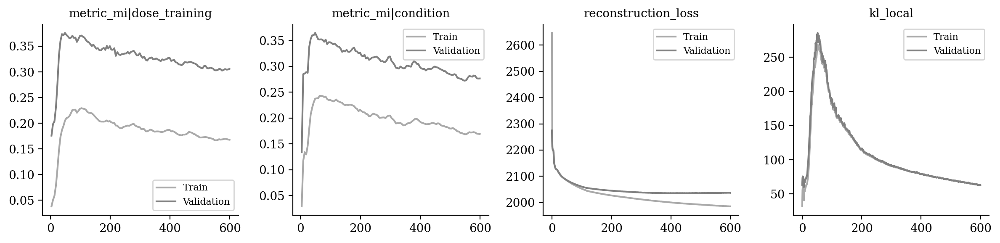

In [11]:
vae.plot_training_history(
    ignore_first=0,
    n_col=4,
    metrics_name=["metric_mi|dose_training", "metric_mi|condition", 
                 "reconstruction_loss", "kl_local"]
)

In [12]:
from tardis._disentanglementmanager import DisentanglementManager as DM

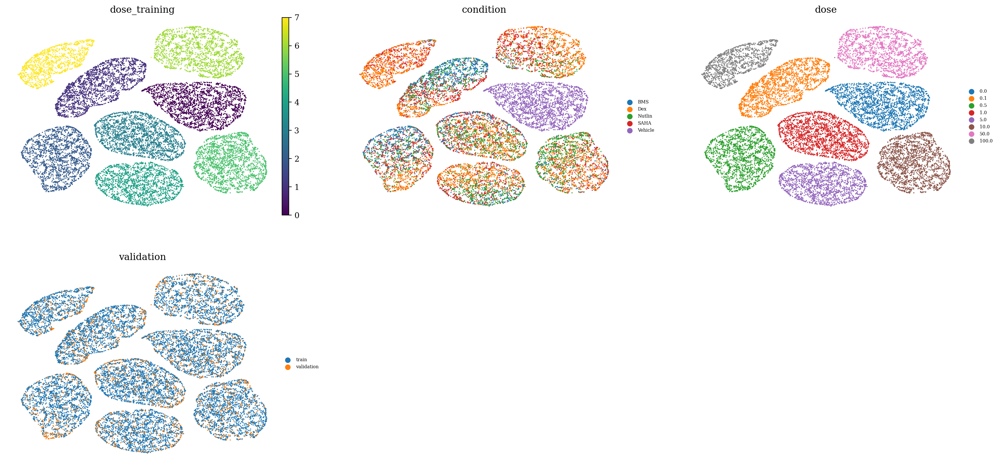

In [13]:
sublatent = DM.configurations.get_by_obs_key("dose_training").reserved_latent_indices
latent = ad.AnnData(X=vae.get_latent_representation()[:, sublatent], obs=adata.obs.copy())
sc.pp.neighbors(latent)
sc.tl.umap(latent)

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sc.pl.umap(
        latent, 
        color=['dose_training', 'condition', 'dose', "validation"], 
        ncols=3,
        frameon=False,
        legend_fontsize="xx-small"
    )

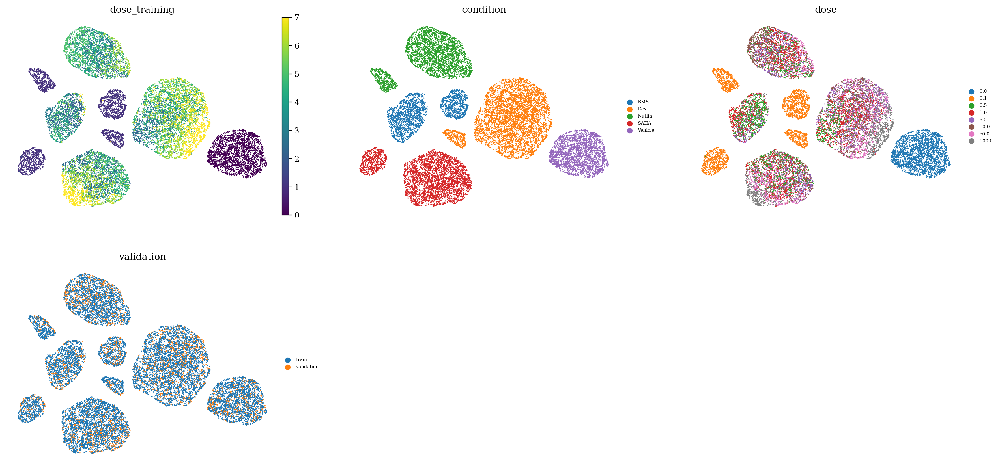

In [14]:
sublatent = DM.configurations.get_by_obs_key("condition").reserved_latent_indices
latent = ad.AnnData(X=vae.get_latent_representation()[:, sublatent], obs=adata.obs.copy())
sc.pp.neighbors(latent)
sc.tl.umap(latent)

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sc.pl.umap(
        latent, 
        color=['dose_training', 'condition', 'dose', "validation"], 
        ncols=3,
        frameon=False,
        legend_fontsize="xx-small"
    )

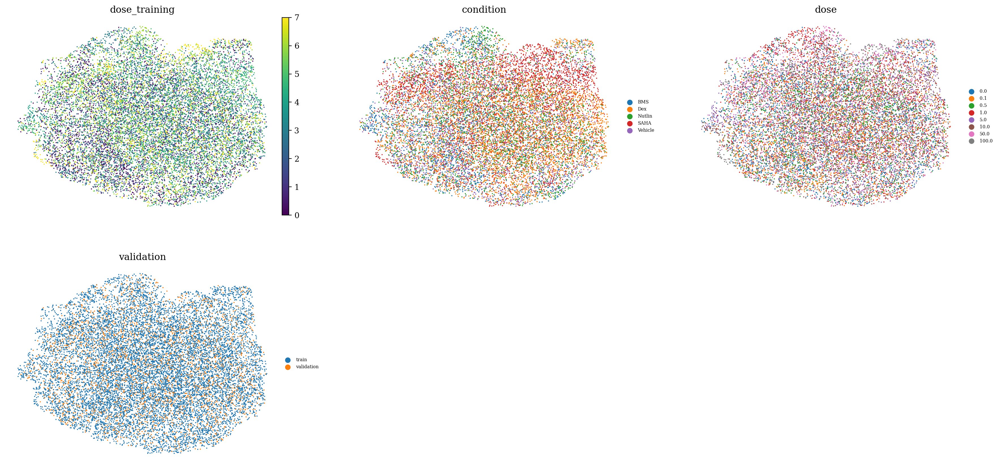

In [15]:
sublatent = DM.configurations.unreserved_latent_indices
latent = ad.AnnData(X=vae.get_latent_representation()[:, sublatent], obs=adata.obs.copy())
sc.pp.neighbors(latent)
sc.tl.umap(latent)

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sc.pl.umap(
        latent, 
        color=['dose_training', 'condition', 'dose', "validation"], 
        ncols=3,
        frameon=False,
        legend_fontsize="xx-small"
    )

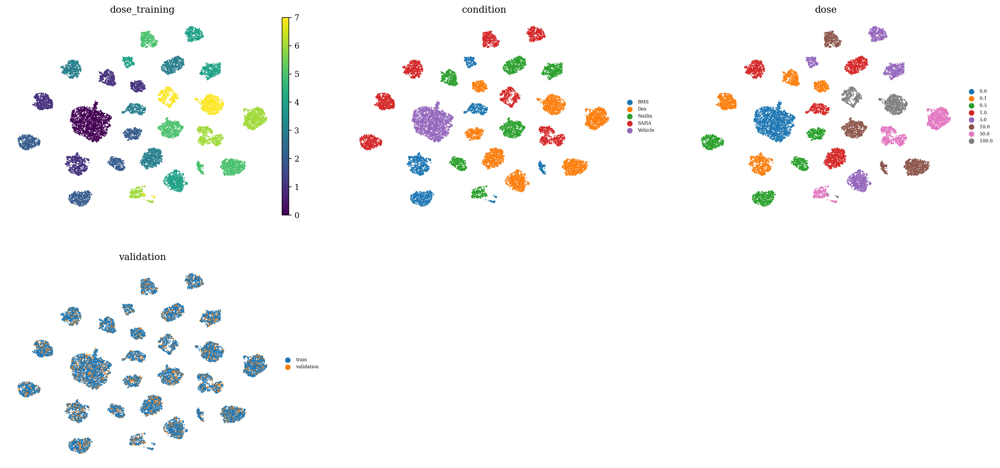

In [16]:
latent = ad.AnnData(X=vae.get_latent_representation(), obs=adata.obs.copy())
sc.pp.neighbors(latent)
sc.tl.umap(latent)

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sc.pl.umap(
        latent, 
        color=['dose_training', 'condition', 'dose', "validation"], 
        ncols=3,
        frameon=False,
        legend_fontsize="xx-small"
    )

In [17]:
1

1